#### Importación de librerías

In [213]:
import numpy as np
import pandas as pd
from IPython.display import display, HTML
import importlib
import funciones

import plotly.express as px
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
import statsmodels.tsa.stattools as tsa


from pmdarima.arima import auto_arima, ndiffs, nsdiffs, ADFTest
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

import warnings
import os

importlib.reload(funciones)
warnings.filterwarnings("ignore")
pd.options.display.float_format = '{:,.2f}'.format

#### Metodología de Box-Jenkins
1. 
2. 
3. 
4. 

#### Creamos dataframes

In [214]:
df_main = pd.read_excel("https://raw.githubusercontent.com/carrenogf/MCD-Series-Temporales/main/dataset/series_diarias.xlsx")
df_main = df_main.sort_values("FECHA",ascending=True)
df_main = df_main[df_main["FECHA"] >= "2022-01-01"]
df_main.set_index("FECHA", inplace=True)
df_copa = df_main["CHU_COPA_AJUST"].dropna()
df_recprop = df_main["CHU_REC_PROPIOS_AJUST"].dropna()
df_regal = df_main["CHU_REGALIAS_AJUST"].dropna()
dataframes = [df_copa, df_recprop, df_regal]
titulos = ["CHU_COPA_AJUST", "CHU_REC_PROPIOS_AJUST", "CHU_REGALIAS_AJUST"]

<h2>Ejercicio 1</h2>
Buscar 3 (tres) series de tiempo y exponer la problemática de interés analítico (es importante detallar cuáles fueron los motivos de elección y situar al lector en el contexto adecuado).

In [3]:
funciones.display_col3(df_copa.to_frame().tail().to_html(),
             df_recprop.tail().to_frame().to_html(),
             df_regal.tail().to_frame().to_html())

,CHU_COPA_AJUST
FECHA,
2024-09-24,"3,350.31"
2024-09-25,"4,040.92"
2024-09-26,"4,298.41"
2024-09-27,"2,299.34"
2024-09-30,"1,296.17"
,CHU_REC_PROPIOS_AJUST
FECHA,
2024-09-24,1102539
2024-09-25,2665230


<h2>Ejercicio 2</h2>
Graficar las series originales. Analizar si es necesario diferenciarlas para convertirlas en estacionarias.

Exponer los conceptos relacionados con la estacionariedad de la serie.

Gráficos de las series

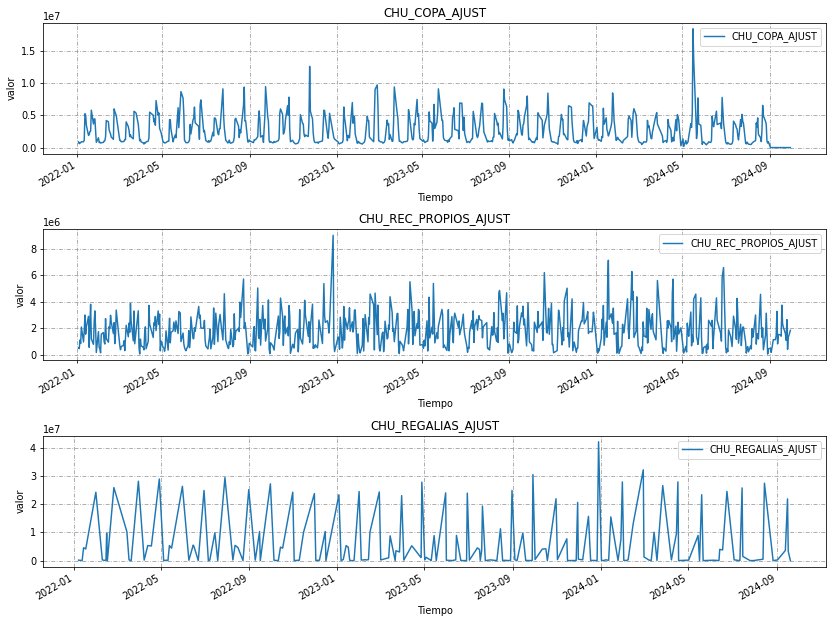

In [4]:
fig, axes = plt.subplots(3, 1, figsize=(12, 9), dpi=70)  # 3 filas, 1 columna

for i, (df, ax) in enumerate(zip(dataframes, axes)):
    funciones.graficar_serie(serie=df,
             titulo=f"{df.name}",
             xlabel="Tiempo",
             ylabel="valor",
             ax=ax)

plt.tight_layout()  # Evitar superposición
plt.show()

In [5]:
display(HTML("<h2>Boxplot</h2>"))
funciones.graficar_boxplots(dataframes,titulos=titulos)

In [106]:
df = pd.DataFrame(dataframes[2].copy())

df["Year"] = df.index.year
df["Month"] = df.index.month
per = df.groupby(["Year", "Month"]).count()
# period_default  = int(df["Year"].value_counts().mean())
per.mean()

CHU_REGALIAS_AJUST    5.757576
dtype: float64

In [91]:
per = df.groupby([""])

FECHA
1     22
5     19
6     19
7     19
3     17
8     17
2     16
4     15
9     15
11    11
10    10
12    10
Name: count, dtype: int64

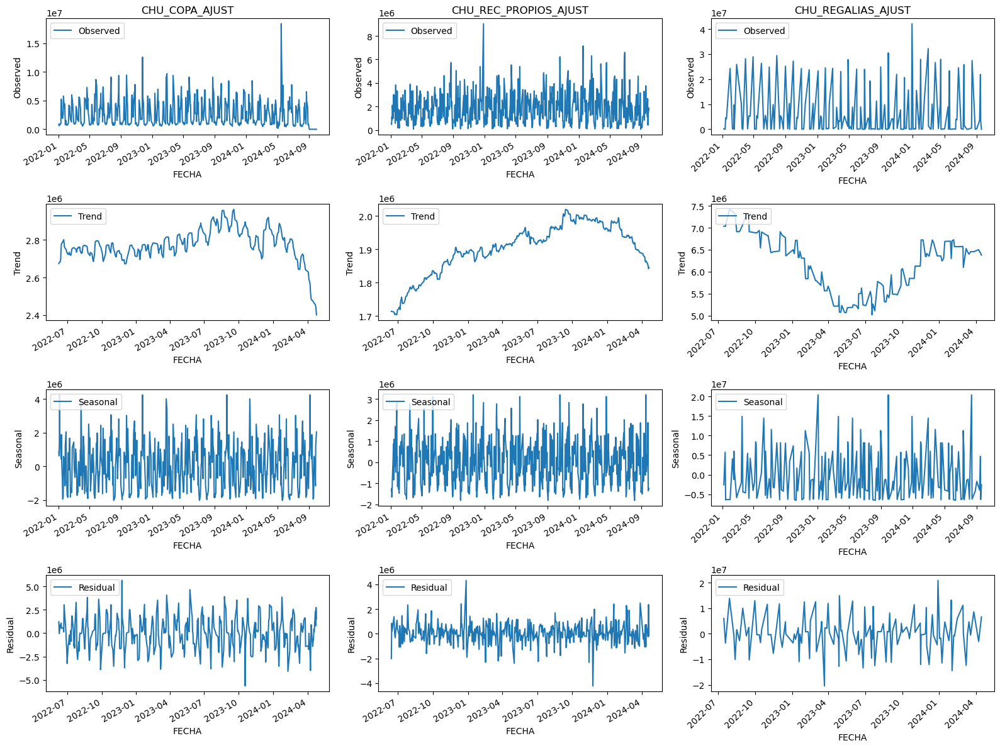

In [6]:
periodos = [211, 218, 63]
display(HTML("<h2>Descomposición de las series</h2>"))
funciones.componentes(dataframes, periodos, titulos)

### le quitamos componenete estacional

In [169]:
from statsmodels.tsa.seasonal import seasonal_decompose

df1_sin_estac = dataframes[1].copy()
result = seasonal_decompose(df1_sin_estac, model='additive', period=218)
df1_sin_estac['deseasonalizada'] = df1_sin_estac - result.seasonal

# Codigo opcional
df1_sin_estac.dropna(inplace=True)

In [170]:
df1_sin_estac.head()

FECHA
2022-01-03 00:00:00     523165
2022-01-04 00:00:00     476333
2022-01-05 00:00:00    1125238
2022-01-06 00:00:00     865619
2022-01-07 00:00:00    2105995
Name: CHU_REC_PROPIOS_AJUST, dtype: object

<h2>Ejercicio 3</h2>
Graficar la FAS, FAC y FACP de las mismas en un solo gráfico y analizarlas. ¿Qué puede inferir de los gráficos?.

Justificar con teoría.

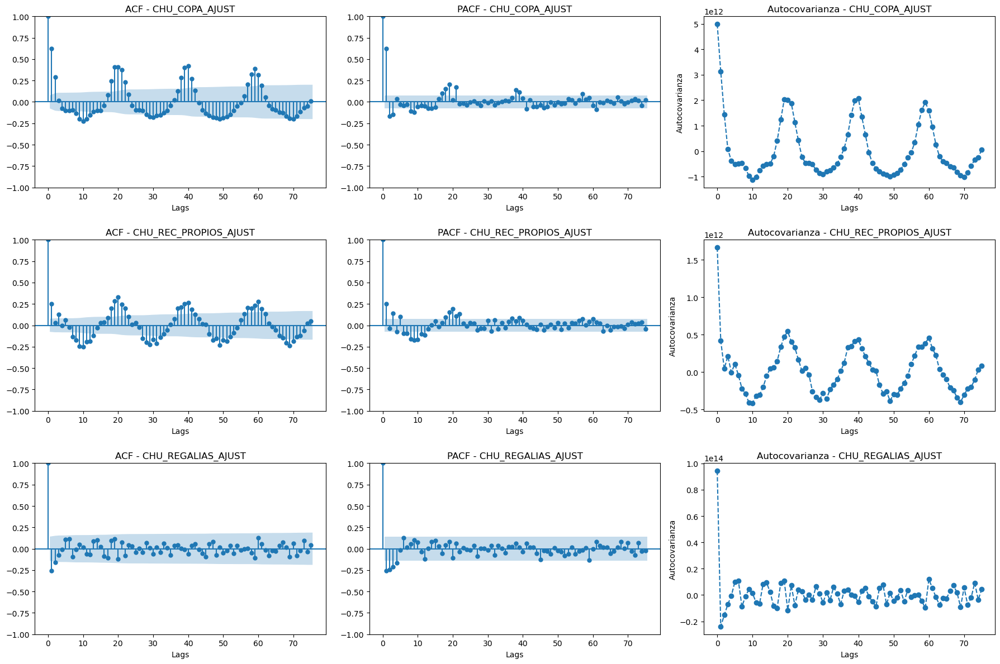

In [7]:
from importlib import reload
import funciones
reload(funciones)
funciones.multi_autocov_autocorr(dataframes,75,['a','b','c'])

#### SON ESTACIONARIAS PORQUE:
* FAC es sinusoidal en copa y REC
* Las autocorrelaciones se reducen exponencialmente en REGALIAS


*Vemos que en las tres series no hay estacionalidad porque no vemos picos que se repiten periodicamente. Parecen ser estancionarios, porque su PAC es sinusoidal y su PACF decrece exponencialmente.*

CHU_COPA_AJUST:

1. ACF (Autocorrelación):

* La función de autocorrelación (ACF) nos indica cómo los valores de la serie están correlacionados consigo mismos en diferentes retardos (lags).
* Interpretación: El primer lag muestra una autocorrelación muy alta (cercana a 1), lo cual es común en muchas series temporales, ya que cada punto está altamente correlacionado con el valor inmediato anterior. Luego, vemos una autocorrelación significativa hasta alrededor del lag 10. A partir de ahí, la autocorrelación disminuye y oscila, pero sigue mostrando valores positivos significativos en varios lags posteriores, lo que podría indicar un patrón de periodicidad o una estructura de largo plazo en la serie.
* Análisis: La presencia de autocorrelaciones significativas en varios lags indica que la serie tiene memoria, es decir, que el valor actual está influenciado por valores pasados más allá de los periodos cercanos. Esto sugiere que la serie tiene un componente estructural que necesita modelarse.

2. PACF (Autocorrelación Parcial):

* La función de autocorrelación parcial (PACF) nos ayuda a identificar la dependencia de un punto con sus retardos excluyendo las correlaciones intermedias, es decir, muestra la correlación directa de un punto con su propio retardo, eliminando el efecto de otros retardos.
* Interpretación: En el PACF vemos una caída abrupta después del primer lag, lo que significa que el valor actual está fuertemente influenciado solo por el valor inmediato anterior (lag 1), y las correlaciones en lags más largos se vuelven más débiles, aunque todavía hay algunas correlaciones significativas hasta aproximadamente el lag 20.
* Análisis: La fuerte caída después del lag 1 sugiere que un modelo AR(1) podría ser adecuado para capturar la dependencia en los datos. Sin embargo, las correlaciones parciales en otros lags podrían indicar la necesidad de un modelo con más términos o de incluir una parte de media móvil (MA) en un modelo ARIMA.

3. Autocovarianza:

* La autocovarianza muestra cómo varía la covarianza entre puntos separados por diferentes lags.
* Interpretación: La autocovarianza sigue una forma ondulante, lo que sugiere la presencia de un patrón cíclico o periódico en la serie. Este comportamiento es consistente con lo que observamos en la ACF, donde la correlación no decae de manera rápida.
* Análisis: Este patrón cíclico refuerza la idea de que hay un componente estacional o repetitivo en la serie que podría ser capturado con términos estacionales o de periodicidad en un modelo.

4. ¿Es estacionaria la serie?
A partir de la ACF y PACF, la serie no parece estacionaria, dado que:

* La autocorrelación no decae rápidamente a cero, lo que indica que hay memoria a largo plazo.
* La PACF sugiere que hay correlaciones significativas más allá del primer retardo.

Conclusión: La serie no es estacionaria, y sería recomendable aplicar técnicas como la diferenciación para convertirla en estacionaria antes de modelar. Además, si los picos en la ACF son persistentes y muestran un patrón cíclico, también se debería considerar un componente estacional en el modelo, como un SARIMA o algún ajuste para capturar las periodicidades.

##### CHU_REC_AJUST
1. ACF (Función de Autocorrelación):

* Muestra un patrón cíclico/estacional claro
* Los valores decaen lentamente
* Presenta oscilaciones periódicas significativas
* Esto sugiere que la serie NO es estacionaria
* El patrón cíclico parece tener una periodicidad aproximada de 15-20 lags

2. PACF (Función de Autocorrelación Parcial):

* Muestra correlaciones significativas en los primeros lags
* Después del lag 5-6, las correlaciones son menos significativas
* Se observan algunos picos significativos dispersos

4. Estacionariedad:

* La serie original NO es estacionaria debido a:
    * Patrones cíclicos claros
    * Decaimiento lento en ACF
    * Correlaciones significativas persistentes
* Existe una clara componente estacional en los datos originales

5. Para la serie original, sería necesario:

* Aplicar diferenciación para eliminar tendencia
* Considerar diferenciación estacional
* Posiblemente usar modelos SARIMA

CHU_REGALIAS_AJUST

1. ACF:

* Las correlaciones son mucho más débiles
* No hay un patrón cíclico claro
* La mayoría de los valores están dentro de las bandas de confianza
* Sugiere que la serie se ha vuelto más estacionaria

2. PACF:

* Correlaciones parciales significativas solo en los primeros lags
* Después del lag 5, casi todas las correlaciones están dentro de las bandas de confianza
* Estructura más limpia y menos ruidosa

3. Consideraciones:
* Podría modelarse con un ARIMA más simple
* Los órdenes del modelo podrían ser bajos dado el comportamiento de ACF/PACF
* Posiblemente un ARIMA(p,d,q) donde p y q serían pequeños

## Ejercicio 4
Realizar distintas pruebas de raíces unitarias para determinar si las series elegidas son o no estacionarias.

Componentes deterministicos - Test de Raíces Unitarias - Dickey Fuller

Estos tests se utilizan para determinar si una serie de tiempo es estacionaria o no.

In [8]:
resultados_adf = funciones.test_dickeyfuller(dataframes, titulos)
display(HTML("<h2>Resultados de la prueba de Dickey-Fuller</h2>"))
display(resultados_adf)

Serie,CHU_COPA_AJUST,CHU_REC_PROPIOS_AJUST,CHU_REGALIAS_AJUST
ADF (None),-1.02,-0.60,-0.84
p-valor (None),0.28,0.46,0.35
Críticos (None),"1%: -2.569, 5%: -1.941, 10%: -1.616","1%: -2.569, 5%: -1.941, 10%: -1.616","1%: -2.579, 5%: -1.943, 10%: -1.615"
Rechaza H0 (None),False,False,False
ADF (Drift),-2.18,-3.92,-10.69
p-valor (Drift),0.21,0.00,0.00
Críticos (Drift),"1%: -3.441, 5%: -2.866, 10%: -2.569","1%: -3.441, 5%: -2.866, 10%: -2.569","1%: -3.466, 5%: -2.877, 10%: -2.575"
Rechaza H0 (Drift),False,True,True
ADF (Trend),-2.44,-3.94,-10.84
p-valor (Trend),0.36,0.01,0.00


<b>Análisis de CHU_COPA_AJUST</b>

Test ADF sin drift ni tendencia:
* Estadístico ADF: -0.641313
* p-valor: 0.437307
* Interpretación: En este caso, el p-valor (0.437307) es mayor que los niveles de significancia comunes (0.01, 0.05, 0.1). Además, el estadístico ADF (-0.641313) es mayor que todos los valores críticos. Esto sugiere que no podemos rechazar la hipótesis nula de no estacionariedad. Es decir, según este test, la serie parece no ser estacionaria.

Test ADF con drift (constante):
* Estadístico ADF: -5.671137
* p-valor: 0.000001
* Interpretación: El p-valor es muy pequeño (0.000001 < 0.01) y el estadístico ADF (-5.671137) es menor que todos los valores críticos. Esto nos permite rechazar la hipótesis nula con un alto nivel de confianza. Según este test, la serie parece ser estacionaria alrededor de una constante.

Test ADF con tendencia:
* Estadístico ADF: -6.436652
* p-valor: 0.000000
* Interpretación: Al igual que en el caso anterior, el p-valor es extremadamente pequeño y el estadístico ADF es menor que todos los valores críticos. Podemos rechazar la hipótesis nula con un alto nivel de confianza. Este test sugiere que la serie es estacionaria alrededor de una tendencia.

Conclusión general:
Los resultados de estos tres tests muestran una imagen interesante:
* Sin considerar drift ni tendencia, la serie parece no estacionaria.
* Al considerar un término constante (drift), la serie muestra evidencia de estacionariedad.
* Al considerar tanto drift como tendencia, la serie muestra una fuerte evidencia de estacionariedad.

Esto sugiere que tu serie temporal probablemente tiene una tendencia y/o un nivel medio distinto de cero. La serie parece ser estacionaria una vez que se tienen en cuenta estos componentes.

Recomendaciones:
* Visualiza tu serie temporal para confirmar visualmente la presencia de una tendencia o un nivel medio distinto de cero.
* Considera diferenciar la serie si planeas usar modelos que requieran estacionariedad estricta.
* Si estás modelando la serie, podrías incluir términos de tendencia y/o constantes en tu modelo para capturar estos componentes.
* Ten en cuenta que la elección entre los modelos con drift y con tendencia dependerá de tu conocimiento del proceso que genera los datos y del comportamiento observado en la serie.

In [9]:
importlib.reload(funciones)
display(HTML("<h2>Resultados de la prueba de Augmented Dickey-Fuller</h2>"))
display(funciones.Augmented_Dickey_Fuller_Test_func2(dataframes))

,Test Statistic,p-value,No Lags,No Obs,"Crit Val (1%,5%,10%)",Estacionaria 5%
CHU_COPA_AJUST,-2.18,0.21,20,633,"[-3.441, -2.866, -2.569]",False
CHU_REC_PROPIOS_AJUST,-3.92,0.00,20,635,"[-3.441, -2.866, -2.569]",True
CHU_REGALIAS_AJUST,-10.69,0.00,3,186,"[-3.466, -2.877, -2.575]",True


A continuacion, analizamos mediante diferentes pruebas el orden de diferenciacion requerido para que la serie pueda llegar a ser estacionaria. Este es un analizis complementario, junto con los otros realizados. 
Las pruebas realizadas son:

* Prueba de Dickey-Fuller aumentada 
* Prueba de Kwiatkowski-Phillips-Schmidt-Shin
* Prueba de Phillips-Perron

In [10]:

display(funciones.estacionario2(dataframes))

,ADF,KPSS,PP,Should Diff ADFtest
CHU_COPA_AJUST,0,0,0,"(0.01, False)"
CHU_REC_PROPIOS_AJUST,0,0,0,"(0.01, False)"
CHU_REGALIAS_AJUST,0,0,0,"(0.01, False)"


*Según el test de KPSS debemos diferenciar 1 vez para que las series sean estacionarias*

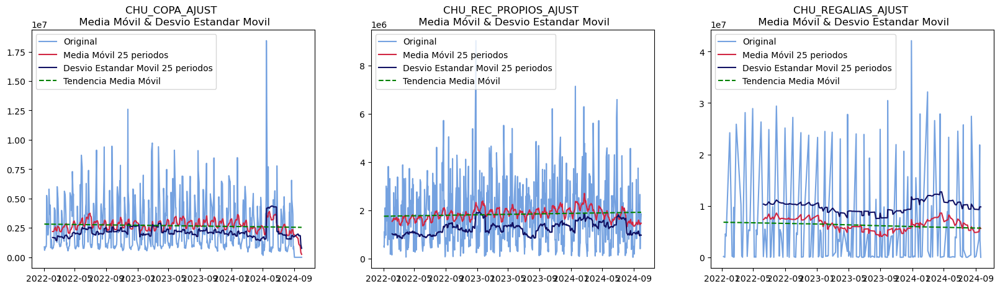

In [11]:

funciones.test_stationarity(dataframes)

#### PREGUNTA: EN BASE A LOS GRAFICOS DE ARRIBA........ ¿HACE FALTA APLICAR BOX-COX? PARA ESTABILIZAR LA VARIANZA....

1. Gráfico de la izquierda (CHU_COPA_AJUST):
* Descripción: Se observa la serie original (en azul claro), junto con una media móvil de 25 períodos (línea roja), un desvío estándar móvil de 25 períodos (línea azul oscuro) y una tendencia (línea verde punteada).
* Interpretación: La serie original muestra un comportamiento muy fluctuante, con picos pronunciados. Sin embargo, la media móvil y el desvío estándar parecen estabilizarse, sugiriendo cierta suavización en los valores. No obstante, la varianza no parece ser constante a lo largo del tiempo, dado que los picos y caídas en la serie son bastante marcados.
* Estacionariedad: Es poco probable que esta serie sea estacionaria, ya que muestra grandes variaciones en la magnitud (especialmente en los picos). Esto sugiere que la serie podría beneficiarse de transformaciones adicionales para estabilizar la varianza.

2. Gráfico del centro (CHU_REC_PROPIOS_AJUST):
* Descripción: Similar al primer gráfico, muestra la serie original, la media móvil, el desvío estándar móvil y la tendencia.
* Interpretación: La serie también presenta fluctuaciones importantes, aunque los picos no son tan extremos como en la serie anterior. La media móvil parece mantenerse relativamente constante a lo largo del tiempo, pero la varianza sigue mostrando incrementos y disminuciones notables.
* Estacionariedad: Tampoco parece ser estacionaria, ya que los valores de la serie original varían significativamente en diferentes períodos. Aunque la media móvil es estable, el desvío estándar refleja variaciones en la dispersión de los datos.

3. Gráfico de la derecha (CHU_REGALIAS_AJUST):
* Descripción: Igual que los gráficos anteriores, muestra la serie original junto con la media móvil, desvío estándar móvil y tendencia.
* Interpretación: Esta serie tiene fluctuaciones marcadas, con algunos picos importantes. La media móvil muestra una leve tendencia ascendente, mientras que el desvío estándar también varía, indicando que la dispersión de los datos no es constante.
* Estacionariedad: Al igual que en los casos anteriores, la serie no parece estacionaria debido a la variabilidad en la magnitud de los datos.


¿Es necesaria la transformación de Box-Cox?
La transformación de Box-Cox puede ser útil para estabilizar la varianza en series temporales con fluctuaciones grandes. En estos gráficos, la varianza no parece ser constante (heterocedasticidad), ya que los picos varían mucho en diferentes puntos del tiempo. Aplicar una transformación como Box-Cox podría ayudar a hacer la varianza más estable y, potencialmente, facilitar el análisis de las series, especialmente si planeas modelarlas con métodos que requieren estacionariedad.

Resumen:
* Ninguna de las series parece ser estacionaria.
* La transformación de Box-Cox podría ser recomendable para estabilizar la varianza y hacer que las series sean más apropiadas para el modelado.

In [106]:
# Realizar la transformación de Box-Cox en los datos de la columna 'Cataratas'
transform_data, best_lambda = boxcox(dataframes[1])

# Reconstruir el DataFrame conservando el índice original (fecha)
df_1_boxcox = pd.DataFrame(transform_data, index=dataframes[1].index)

print("Mejor lambda:", best_lambda)
df_1_boxcox.head()  # Ve

Mejor lambda: 0.38096304244840024


,0
FECHA,
2022-01-03,393.39
2022-01-04,379.49
2022-01-05,527.55
2022-01-06,477.13
2022-01-07,670.54


ValueError: Polynomial must be 1d only.

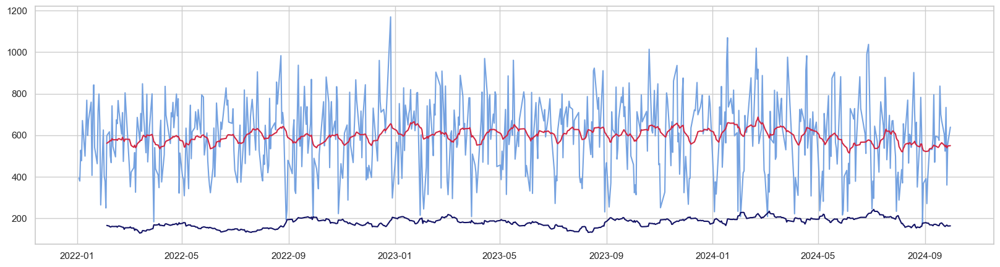

In [111]:
series = [df_1_boxcox]
fig, axes = plt.subplots(ncols=len(series), nrows=1, figsize=(20, 5))

# Asegurarse de que `axes` siempre sea una lista
if len(series) == 1:
    axes = [axes]

for i, serie in enumerate(series):
    # Determing rolling statistics
    rolmean = serie.rolling(25).mean()
    rolstd = serie.rolling(25).std()

    # Plot rolling statistics:
    ax = axes[i]
    ax.plot(serie, color='#75a2e0', label='Original')
    ax.plot(rolmean, color='#d12642', label='Media Móvil 25 periodos')
    ax.plot(rolstd, color='#111163', label='Desvío Estándar Móvil 25 periodos')
    
    # Plot linear trend of rolling mean
    z = np.polyfit(range(len(rolmean.dropna())), rolmean.dropna(), 1)
    p = np.poly1d(z)
    ax.plot(rolmean.index, p(range(len(rolmean))), color='green', linestyle='--', label='Tendencia Media Móvil')
    ax.legend(loc='best')
    ax.set_title(f'{serie.name} \n Media Móvil & Desvío Estándar Móvil')

plt.show()

<h3>Auto Arima</h3>

<h4>CHU_COPA_AJUST</h4>

Serie original

In [14]:
models = []

In [15]:
aa_chu_copa_ajust = auto_arima(dataframes[0], trace=True,suppress_warnings=True)
models.append({
    "modelo": aa_chu_copa_ajust,
    "titulo": "aa_df0",
    "aic": aa_chu_copa_ajust.aic(),
    "order": aa_chu_copa_ajust.order
})

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=20630.135, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=20981.121, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=20656.656, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=20738.331, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=21549.679, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=20634.042, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=20644.589, Time=0.29 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=20630.598, Time=0.37 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=20631.717, Time=0.32 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=20646.833, Time=0.10 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=20632.131, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=20629.136, Time=0.26 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=20627.294, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=20639.823, Time=0.08 sec
 ARIMA(4,0,0)(0,0,0

<h4>CHU_REC_PROPIOS_AJUST</h4>

Serie original

In [16]:
aa_rec_propios_ajus = auto_arima(dataframes[1], trace=True,suppress_warnings=True)
models.append({
    "modelo": aa_rec_propios_ajus,
    "titulo": "aa_df1",
    "aic": aa_rec_propios_ajus.aic(),
    "order": aa_rec_propios_ajus.order
})

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=20267.189, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=20325.278, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=20284.482, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=20281.247, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=21048.386, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=20283.968, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=20288.273, Time=0.16 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=20267.945, Time=0.29 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=20267.303, Time=0.37 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=20286.571, Time=0.08 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=20268.321, Time=0.20 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=20275.996, Time=0.22 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=20276.631, Time=0.52 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.43 sec

Best model:  ARIMA(2,0,2

<h4>CHU_REGALIAS_AJUST</h4>

Serie original

In [17]:
aa_rec_regalias_ajus = auto_arima(dataframes[2], trace=True,suppress_warnings=True)
models.append({
    "modelo": aa_rec_regalias_ajus,
    "titulo": "aa_df2",
    "aic": aa_rec_regalias_ajus.aic(),
    "order": aa_rec_regalias_ajus.order
})

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=6633.407, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=6656.772, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=6646.098, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=6640.490, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=6721.796, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=6633.596, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=6643.260, Time=0.08 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=6631.602, Time=0.24 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=6630.874, Time=0.09 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=6629.520, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=6636.517, Time=0.06 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=6626.038, Time=0.14 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=6627.989, Time=0.13 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=6628.020, Time=0.14 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept

In [18]:
pd.DataFrame(models)

,modelo,titulo,aic,order
0,"ARIMA(3,0,0)(0,0,0)[0] intercept",aa_df0,"20,627.29","(3, 0, 0)"
1,"ARIMA(2,0,2)(0,0,0)[0] intercept",aa_df1,"20,267.19","(2, 0, 2)"
2,"ARIMA(4,0,0)(0,0,0)[0] intercept",aa_df2,"6,626.04","(4, 0, 0)"


<h3>Modelos ARMA</h3>

In [20]:
import itertools
import statsmodels.api as sm

p_values = range(0, 10)
q_values = range(0, 10)

def modelo_arma(df):

    resultados = []
    mejor_aic = float("inf")
    mejor_order = None
    mejor_modelo = None


    for p, q in itertools.product(p_values, q_values):
        try:

            modelo = sm.tsa.arima.ARIMA(df, order=(p, 0, q))
            resultado = modelo.fit()

            aic = resultado.aic
            resultados.append((p, q, aic))

            if aic < mejor_aic:
                mejor_aic = aic
                mejor_order = (p, q)
                mejor_modelo = resultado

        except Exception as e:
            print(f"Error en el modelo ARMA({p},{q}): {e}")

    print(f"Mejor modelo ARMA: order={mejor_order} con AIC={mejor_aic}")

    for p, q, aic in resultados:
        print(f"ARMA({p},{q}) AIC: {aic}")

<h4>CHU_COPA_AJUST</h4>

Serie original

In [21]:
modelo_arma(dataframes[0])

Error en el modelo ARMA(7,5): LU decomposition error.
Mejor modelo ARMA: order=(8, 2) con AIC=20567.292264806507
ARMA(0,0) AIC: 24568.072989042223
ARMA(0,1) AIC: 20728.070461814794
ARMA(0,2) AIC: 20633.399216893667
ARMA(0,3) AIC: 20629.243851774554
ARMA(0,4) AIC: 20632.511998949623
ARMA(0,5) AIC: 20636.043775797356
ARMA(0,6) AIC: 20635.42880225405
ARMA(0,7) AIC: 20637.63042382909
ARMA(0,8) AIC: 20639.731259939283
ARMA(0,9) AIC: 20652.261912065398
ARMA(1,0) AIC: 20656.658567194536
ARMA(1,1) AIC: 20646.349448087873
ARMA(1,2) AIC: 20629.112203482386
ARMA(1,3) AIC: 20634.746483201277
ARMA(1,4) AIC: 20633.039528137677
ARMA(1,5) AIC: 20624.740317645577
ARMA(1,6) AIC: 20624.461081826546
ARMA(1,7) AIC: 20626.45153990575
ARMA(1,8) AIC: 20628.577229500894
ARMA(1,9) AIC: 20628.726697506685
ARMA(2,0) AIC: 20639.82176529124
ARMA(2,1) AIC: 20625.353666130133
ARMA(2,2) AIC: 20630.084715086407
ARMA(2,3) AIC: 20620.912138305408
ARMA(2,4) AIC: 20580.343910718024
ARMA(2,5) AIC: 20634.905931857546
ARMA(2,

In [25]:
models.append({
    "modelo": "ARMA(8, 2)",
    "titulo": "arma_df0",
    "aic": 20567.292264806507,
    "order": "(8, 2)"})

<h4>CHU_REC_PROPIOS_AJUST</h4>

Serie original

In [23]:
modelo_arma(dataframes[1])

Mejor modelo ARMA: order=(2, 8) con AIC=20141.10023315901
ARMA(0,0) AIC: 23925.19966083935
ARMA(0,1) AIC: 20280.10526509802
ARMA(0,2) AIC: 20279.62428038489
ARMA(0,3) AIC: 20265.60031458264
ARMA(0,4) AIC: 20267.609965634983
ARMA(0,5) AIC: 20265.239817045152
ARMA(0,6) AIC: 20262.215440716776
ARMA(0,7) AIC: 20264.06970355777
ARMA(0,8) AIC: 20265.962473719457
ARMA(0,9) AIC: 20253.90615277212
ARMA(1,0) AIC: 20284.480891111743
ARMA(1,1) AIC: 20271.640016641402
ARMA(1,2) AIC: 20270.69286019521
ARMA(1,3) AIC: 20266.385504504688
ARMA(1,4) AIC: 20269.226552792203
ARMA(1,5) AIC: 20272.536705337676
ARMA(1,6) AIC: 20258.13552460402
ARMA(1,7) AIC: 20246.431513688884
ARMA(1,8) AIC: 20242.507517276408
ARMA(1,9) AIC: 20241.01574649082
ARMA(2,0) AIC: 20285.53471715327
ARMA(2,1) AIC: 20269.219584271734
ARMA(2,2) AIC: 20267.121159329225
ARMA(2,3) AIC: 20272.521900169264
ARMA(2,4) AIC: 20270.7971619239
ARMA(2,5) AIC: 20273.555060785042
ARMA(2,6) AIC: 20142.37354924928
ARMA(2,7) AIC: 20141.546614578707
ARM

In [24]:
models.append({
    "modelo": "ARMA(2, 8)",
    "titulo": "arma_df1",
    "aic": 20141.10023315901,
    "order": "(2, 8)"})

Serie diferenciada

<h4>CHU_REGALIAS_AJUST</h4>

Serie original

In [31]:
modelo_arma(dataframes[2])

Mejor modelo ARMA: order=(2, 2) con AIC=6622.495584186374
ARMA(0,0) AIC: 7464.707051790934
ARMA(0,1) AIC: 6632.64175558783
ARMA(0,2) AIC: 6628.430260157916
ARMA(0,3) AIC: 6630.100040735028
ARMA(0,4) AIC: 6627.610937001353
ARMA(0,5) AIC: 6625.887517667294
ARMA(0,6) AIC: 6627.6697708912925
ARMA(0,7) AIC: 6626.1881270860185
ARMA(0,8) AIC: 6627.948978259316
ARMA(0,9) AIC: 6629.69687236852
ARMA(1,0) AIC: 6646.097575167638
ARMA(1,1) AIC: 6629.9603915343805
ARMA(1,2) AIC: 6630.314569392928
ARMA(1,3) AIC: 6627.1704055991195
ARMA(1,4) AIC: 6627.394012185007
ARMA(1,5) AIC: 6627.81401730765
ARMA(1,6) AIC: 6628.560580085995
ARMA(1,7) AIC: 6628.0067814554295
ARMA(1,8) AIC: 6629.867405400533
ARMA(1,9) AIC: 6629.790517978323
ARMA(2,0) AIC: 6636.516259691305
ARMA(2,1) AIC: 6628.741731499382
ARMA(2,2) AIC: 6622.495584186374
ARMA(2,3) AIC: 6623.960025249506
ARMA(2,4) AIC: 6625.883752601889
ARMA(2,5) AIC: 6625.298413688859
ARMA(2,6) AIC: 6624.175298474589
ARMA(2,7) AIC: 6625.936211586903
ARMA(2,8) AIC: 6

In [32]:
models.append({
    "modelo": "ARMA(2, 2)",
    "titulo": "arma_df2",
    "aic": 6622.49558418637,
    "order": "(2, 2)"})

In [33]:
pd.DataFrame(models)

,modelo,titulo,aic,order
0,"ARIMA(3,0,0)(0,0,0)[0] intercept",aa_df0,"20,627.29","(3, 0, 0)"
1,"ARIMA(2,0,2)(0,0,0)[0] intercept",aa_df1,"20,267.19","(2, 0, 2)"
2,"ARIMA(4,0,0)(0,0,0)[0] intercept",aa_df2,"6,626.04","(4, 0, 0)"
3,"ARMA(2, 8)",arma_df1,"20,141.10","(2, 8)"
4,"ARMA(8, 2)",arma_df0,"20,567.29","(8, 2)"
5,"ARMA(2, 2)",arma_df2,"6,622.50","(2, 2)"


<h3> Métricas para modelos de autoarima automatico y manual </h3>

<h4>CHU_COPA_AJUST</h4>

Modelo 1: AUTOARIMA - ARIMA(3,0,0)(0,0,0)[0] intercept

In [34]:
modelo_aa_ARIMA_copa = sm.tsa.arima.ARIMA(dataframes[0], order=(3,0,0))
resultado_aa_ARIMA_copa = modelo_aa_ARIMA_copa.fit()
resultado_aa_ARIMA_copa.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:         CHU_COPA_AJUST   No. Observations:                  654
Model:                 ARIMA(3, 0, 0)   Log Likelihood              -10308.645
Date:                Sat, 26 Oct 2024   AIC                          20627.290
Time:                        20:06:07   BIC                          20649.706
Sample:                             0   HQIC                         20635.982
                                - 654                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.635e+06   1.43e+05     18.438      0.000    2.35e+06    2.91e+06
ar.L1          0.7076      0.036     19.589      0.000       0.637       0.778
ar.L2         -0.0602      0.042     -1.417      0.156      -0.143       0.023
ar.L3         -0.1483      0.043     -3.473      0.001      -0.232      -0.065
sigma2      2.881e+12      0.173   1.67e+13      0.000    2.88e+12    2.88e+12
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):              2906.10
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               1.08   Skew:                             2.14
Prob(H) (two-sided):                  0.56   Kurtosis:                        12.40
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.25e+27. Standard errors may be unstable.
"""

Modelo 2 ARMA(8,2)

In [35]:
modelo_ARMA_copa = sm.tsa.arima.ARIMA(dataframes[0], order=(8,0,2))
modelo_ARMA_copa = modelo_ARMA_copa.fit()
modelo_ARMA_copa.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:         CHU_COPA_AJUST   No. Observations:                  654
Model:                 ARIMA(8, 0, 2)   Log Likelihood              -10271.646
Date:                Sat, 26 Oct 2024   AIC                          20567.292
Time:                        20:08:39   BIC                          20621.090
Sample:                             0   HQIC                         20588.153
                                - 654                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.635e+06   5.96e-08   4.42e+13      0.000    2.63e+06    2.63e+06
ar.L1          2.4412      0.040     60.761      0.000       2.362       2.520
ar.L2         -2.1540      0.106    -20.326      0.000      -2.362      -1.946
ar.L3          0.5436      0.141      3.861      0.000       0.268       0.820
ar.L4          0.2956      0.156      1.896      0.058      -0.010       0.601
ar.L5         -0.2302      0.176     -1.309      0.190      -0.575       0.114
ar.L6          0.0101      0.172      0.059      0.953      -0.327       0.348
ar.L7          0.0464      0.132      0.352      0.725      -0.212       0.305
ar.L8         -0.0443      0.053     -0.831      0.406      -0.149       0.060
ma.L1         -1.8434      0.016   -116.289      0.000      -1.874      -1.812
ma.L2          0.9636      0.016     60.790      0.000       0.933       0.995
sigma2       2.84e+12   2.08e-13   1.37e+25      0.000    2.84e+12    2.84e+12
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              4065.94
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               1.21   Skew:                             2.10
Prob(H) (two-sided):                  0.16   Kurtosis:                        14.47
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.33e+40. Standard errors may be unstable.
"""

<h4>CHU_REC_PROPIOS_AJUST</h4>

In [36]:
modelo_aa_ARIMA_RP= sm.tsa.arima.ARIMA(dataframes[1], order=(2,0,2))
modelo_aa_ARIMA_RP = modelo_aa_ARIMA_RP.fit()
modelo_aa_ARIMA_RP.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 SARIMAX Results                                 
=================================================================================
Dep. Variable:     CHU_REC_PROPIOS_AJUST   No. Observations:                  656
Model:                    ARIMA(2, 0, 2)   Log Likelihood              -10127.561
Date:                   Sat, 26 Oct 2024   AIC                          20267.121
Time:                           20:09:10   BIC                          20294.038
Sample:                                0   HQIC                         20277.557
                                   - 656                                         
Covariance Type:                     opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.833e+06   7.14e+04     25.685      0.000    1.69e+06    1.97e+06
ar.L1         -0.0354      0.339     -0.104      0.917      -0.700       0.629
ar.L2          0.3643      0.140      2.610      0.009       0.091       0.638
ma.L1          0.3374      0.345      0.977      0.329      -0.339       1.014
ma.L2         -0.3769      0.230     -1.641      0.101      -0.827       0.073
sigma2      1.502e+12      0.040   3.76e+13      0.000     1.5e+12     1.5e+12
===================================================================================
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):               187.41
Prob(Q):                              0.77   Prob(JB):                         0.00
Heteroskedasticity (H):               1.53   Skew:                             1.00
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.47e+28. Standard errors may be unstable.
"""

In [37]:
modelo_ARMA_RP = sm.tsa.arima.ARIMA(dataframes[1], order=(2,0,8))
modelo_ARMA_RP = modelo_ARMA_RP.fit()
modelo_ARMA_RP.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 SARIMAX Results                                 
=================================================================================
Dep. Variable:     CHU_REC_PROPIOS_AJUST   No. Observations:                  656
Model:                    ARIMA(2, 0, 8)   Log Likelihood              -10058.550
Date:                   Sat, 26 Oct 2024   AIC                          20141.100
Time:                           20:09:41   BIC                          20194.934
Sample:                                0   HQIC                         20161.972
                                   - 656                                         
Covariance Type:                     opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.833e+06   4.63e-08   3.96e+13      0.000    1.83e+06    1.83e+06
ar.L1          1.8981      0.002    863.498      0.000       1.894       1.902
ar.L2         -0.9985      0.002   -454.774      0.000      -1.003      -0.994
ma.L1         -1.8142      0.040    -45.748      0.000      -1.892      -1.737
ma.L2          0.6094      0.080      7.648      0.000       0.453       0.766
ma.L3          0.5482      0.091      6.056      0.000       0.371       0.726
ma.L4         -0.3590      0.102     -3.536      0.000      -0.558      -0.160
ma.L5          0.2619      0.099      2.645      0.008       0.068       0.456
ma.L6         -0.1830      0.100     -1.833      0.067      -0.379       0.013
ma.L7         -0.0450      0.096     -0.468      0.640      -0.233       0.143
ma.L8          0.0705      0.045      1.563      0.118      -0.018       0.159
sigma2      1.372e+12   4.42e-14    3.1e+25      0.000    1.37e+12    1.37e+12
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               303.84
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               1.64   Skew:                             1.17
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 8.8e+40. Standard errors may be unstable.
"""

<h4>CHU_REGALIAS_AJUST</h4>

In [79]:
modelo_aa_ARIMA_REG= sm.tsa.arima.ARIMA(dataframes[2], order=(4,0,0))
modelo_aa_ARIMA_REG = modelo_aa_ARIMA_REG.fit()
modelo_aa_ARIMA_REG.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:     CHU_REGALIAS_AJUST   No. Observations:                  190
Model:                 ARIMA(4, 0, 0)   Log Likelihood               -3307.020
Date:              vie., 25 oct. 2024   AIC                           6626.040
Time:                        20:29:20   BIC                           6645.522
Sample:                             0   HQIC                          6633.932
                                - 190                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       6.313e+06   4.05e+05     15.607      0.000    5.52e+06    7.11e+06
ar.L1         -0.4067      0.120     -3.387      0.001      -0.642      -0.171
ar.L2         -0.3655      0.136     -2.694      0.007      -0.631      -0.100
ar.L3         -0.2793      0.088     -3.165      0.002      -0.452      -0.106
ar.L4         -0.1689      0.064     -2.632      0.008      -0.295      -0.043
sigma2      7.751e+13      0.014   5.53e+15      0.000    7.75e+13    7.75e+13
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                46.40
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               1.33   Skew:                             1.12
Prob(H) (two-sided):                  0.26   Kurtosis:                         3.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.04e+30. Standard errors may be unstable.
"""

In [80]:
modelo_ARMA_REG = sm.tsa.arima.ARIMA(dataframes[2], order=(2,0,2))
modelo_ARMA_REG = modelo_ARMA_REG.fit()
modelo_ARMA_REG.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:     CHU_REGALIAS_AJUST   No. Observations:                  190
Model:                 ARIMA(2, 0, 2)   Log Likelihood               -3305.248
Date:              vie., 25 oct. 2024   AIC                           6622.496
Time:                        20:29:45   BIC                           6641.978
Sample:                             0   HQIC                          6630.388
                                - 190                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       6.313e+06   5.19e+05     12.162      0.000     5.3e+06    7.33e+06
ar.L1          0.9376      0.196      4.787      0.000       0.554       1.321
ar.L2         -0.5396      0.153     -3.532      0.000      -0.839      -0.240
ma.L1         -1.3436      0.174     -7.735      0.000      -1.684      -1.003
ma.L2          0.6924      0.137      5.064      0.000       0.424       0.960
sigma2      7.727e+13      0.023    3.4e+15      0.000    7.73e+13    7.73e+13
===================================================================================
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                42.93
Prob(Q):                              0.77   Prob(JB):                         0.00
Heteroskedasticity (H):               1.38   Skew:                             1.08
Prob(H) (two-sided):                  0.21   Kurtosis:                         3.88
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number  1e+42. Standard errors may be unstable.
"""

## Ejercicio 5

Efectuar una estimación de la serie temporal con distintos órdenes de parámetros de modelos SARIMA y encontrar aquel que se ajuste mejor a los datos (pueden emplear Criterios de Información/Selección y analizar significatividad individual y global de los parámetros del modelo).

In [42]:
# Model SARIMA
smodel_copa = auto_arima(dataframes[0],
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=21, # Seleccionamos 21 para comparar series diarias con estacionalidad mensual
                    start_P=0,
                    seasonal=True,
                    d=None,
                    D=None,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

smodel_copa.summary()

models.append({
    "modelo": smodel_copa,
    "titulo": "sarima_df0",
    "aic": smodel_copa.aic(),
    "order": smodel_copa.order,
    "seasonal_order": smodel_copa.seasonal_order
})

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[21] intercept   : AIC=20899.499, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[21] intercept   : AIC=20981.121, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[21] intercept   : AIC=20629.154, Time=1.16 sec
 ARIMA(0,0,1)(0,0,1)[21] intercept   : AIC=20690.209, Time=1.26 sec
 ARIMA(0,0,0)(0,0,0)[21]             : AIC=21549.679, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[21] intercept   : AIC=20656.656, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[21] intercept   : AIC=20630.765, Time=6.63 sec
 ARIMA(1,0,0)(1,0,1)[21] intercept   : AIC=20629.488, Time=0.87 sec
 ARIMA(1,0,0)(0,0,1)[21] intercept   : AIC=20629.528, Time=0.37 sec
 ARIMA(1,0,0)(2,0,1)[21] intercept   : AIC=20630.912, Time=4.60 sec
 ARIMA(0,0,0)(1,0,0)[21] intercept   : AIC=20945.291, Time=0.59 sec
 ARIMA(2,0,0)(1,0,0)[21] intercept   : AIC=20608.644, Time=2.04 sec
 ARIMA(2,0,0)(0,0,0)[21] intercept   : AIC=20639.823, Time=0.13 sec
 ARIMA(2,0,0)(2,0,0)[21] intercept   : AIC=20610.641, Time=17.09 sec
 ARI

In [45]:
# Model SARIMA
smodel_copa = auto_arima(dataframes[0],
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=21, # Seleccionamos 21 para comparar series diarias con estacionalidad mensual
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=1,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

smodel_copa.summary()

models.append({
    "modelo": smodel_copa,
    "titulo": "sarima_df0_diff",
    "aic": smodel_copa.aic(),
    "order": smodel_copa.order,
    "seasonal_order": smodel_copa.seasonal_order
})

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,1)[21]             : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,1,0)[21]             : AIC=20425.290, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[21]             : AIC=20320.746, Time=1.21 sec
 ARIMA(0,1,1)(0,1,1)[21]             : AIC=inf, Time=3.60 sec
 ARIMA(1,1,0)(0,1,0)[21]             : AIC=20423.327, Time=0.17 sec
 ARIMA(1,1,0)(2,1,0)[21]             : AIC=20290.839, Time=4.84 sec
 ARIMA(1,1,0)(2,1,1)[21]             : AIC=inf, Time=17.14 sec
 ARIMA(1,1,0)(1,1,1)[21]             : AIC=inf, Time=7.03 sec
 ARIMA(0,1,0)(2,1,0)[21]             : AIC=20271.816, Time=5.00 sec
 ARIMA(0,1,0)(1,1,0)[21]             : AIC=20309.464, Time=0.78 sec
 ARIMA(0,1,0)(2,1,1)[21]             : AIC=inf, Time=10.19 sec
 ARIMA(0,1,0)(1,1,1)[21]             : AIC=inf, Time=2.87 sec
 ARIMA(0,1,1)(2,1,0)[21]             : AIC=20288.828, Time=7.39 sec
 ARIMA(1,1,1)(2,1,0)[21]             : AIC=inf, Time=20.78 sec
 ARIMA(0,1,0)(2,1,0)[21] intercept   : AIC=2

In [46]:
# Model SARIMA
smodel_rec_prop = auto_arima(dataframes[1],
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=21, # Seleccionamos 21 para comparar series diarias con estacionalidad mensual
                    start_P=0,
                    seasonal=True,
                    d=None,
                    D=None,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

smodel_rec_prop.summary()


models.append({
    "modelo": smodel_rec_prop,
    "titulo": "sarima_df1",
    "aic": smodel_rec_prop.aic(),
    "order": smodel_rec_prop.order,
    "seasonal_order": smodel_rec_prop.seasonal_order
})

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[21] intercept   : AIC=20294.580, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[21] intercept   : AIC=20325.278, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[21] intercept   : AIC=20273.754, Time=0.66 sec
 ARIMA(0,0,1)(0,0,1)[21] intercept   : AIC=20271.010, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[21]             : AIC=21048.386, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[21] intercept   : AIC=20281.247, Time=0.08 sec
 ARIMA(0,0,1)(1,0,1)[21] intercept   : AIC=20271.972, Time=0.92 sec
 ARIMA(0,0,1)(0,0,2)[21] intercept   : AIC=20268.085, Time=1.33 sec
 ARIMA(0,0,1)(1,0,2)[21] intercept   : AIC=20269.634, Time=7.33 sec
 ARIMA(0,0,0)(0,0,2)[21] intercept   : AIC=20287.343, Time=0.92 sec
 ARIMA(1,0,1)(0,0,2)[21] intercept   : AIC=20274.503, Time=1.78 sec
 ARIMA(0,0,2)(0,0,2)[21] intercept   : AIC=20261.822, Time=1.22 sec
 ARIMA(0,0,2)(0,0,1)[21] intercept   : AIC=20266.755, Time=0.72 sec
 ARIMA(0,0,2)(1,0,2)[21] intercept   : AIC=inf, Time=6.63 sec
 ARIMA(0,0,

In [47]:
# Model SARIMA
smodel_rec_prop = auto_arima(dataframes[1],
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=21, # Seleccionamos 21 para comparar series diarias con estacionalidad mensual
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=1,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

smodel_rec_prop.summary()


models.append({
    "modelo": smodel_rec_prop,
    "titulo": "sarima_df1_diff",
    "aic": smodel_rec_prop.aic(),
    "order": smodel_rec_prop.order,
    "seasonal_order": smodel_rec_prop.seasonal_order
})

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,1)[21]             : AIC=inf, Time=2.50 sec
 ARIMA(0,1,0)(0,1,0)[21]             : AIC=20362.235, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[21]             : AIC=20104.351, Time=1.25 sec
 ARIMA(0,1,1)(0,1,1)[21]             : AIC=19843.164, Time=2.19 sec
 ARIMA(0,1,1)(0,1,0)[21]             : AIC=inf, Time=0.58 sec
 ARIMA(0,1,1)(1,1,1)[21]             : AIC=inf, Time=4.54 sec
 ARIMA(0,1,1)(0,1,2)[21]             : AIC=inf, Time=9.93 sec
 ARIMA(0,1,1)(1,1,0)[21]             : AIC=19884.918, Time=2.06 sec
 ARIMA(0,1,1)(1,1,2)[21]             : AIC=inf, Time=14.07 sec
 ARIMA(1,1,1)(0,1,1)[21]             : AIC=inf, Time=3.21 sec
 ARIMA(0,1,2)(0,1,1)[21]             : AIC=inf, Time=6.36 sec
 ARIMA(1,1,0)(0,1,1)[21]             : AIC=inf, Time=2.04 sec
 ARIMA(1,1,2)(0,1,1)[21]             : AIC=inf, Time=3.87 sec
 ARIMA(0,1,1)(0,1,1)[21] intercept   : AIC=19852.924, Time=3.24 sec

Best model:  ARIMA(0,1,1)(0,1,1)[21]          
Total fit 

In [48]:
# Model SARIMA
smodel_reg = auto_arima(dataframes[2],
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=6, # Seleccionamos 21 para comparar series diarias con estacionalidad mensual
                    start_P=0,
                    seasonal=True,
                    d=None,
                    D=None,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

smodel_reg.summary()


models.append({
    "modelo": smodel_reg,
    "titulo": "sarima_df2",
    "aic": smodel_reg.aic(),
    "order": smodel_reg.order,
    "seasonal_order": smodel_reg.seasonal_order
})

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[6] intercept   : AIC=6655.657, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[6] intercept   : AIC=6656.772, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[6] intercept   : AIC=6645.868, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[6] intercept   : AIC=6635.536, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[6]             : AIC=6721.796, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[6] intercept   : AIC=6640.490, Time=0.03 sec
 ARIMA(0,0,1)(1,0,1)[6] intercept   : AIC=6631.445, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[6] intercept   : AIC=6642.021, Time=0.07 sec
 ARIMA(0,0,1)(2,0,1)[6] intercept   : AIC=6633.287, Time=0.26 sec
 ARIMA(0,0,1)(1,0,2)[6] intercept   : AIC=6633.031, Time=0.27 sec
 ARIMA(0,0,1)(0,0,2)[6] intercept   : AIC=6636.918, Time=0.14 sec
 ARIMA(0,0,1)(2,0,0)[6] intercept   : AIC=6637.088, Time=0.14 sec
 ARIMA(0,0,1)(2,0,2)[6] intercept   : AIC=6634.883, Time=0.39 sec
 ARIMA(0,0,0)(1,0,1)[6] intercept   : AIC=6657.513, Time=0.09 sec
 ARIMA(1,0,1)(1,0,1)[6] intercept

In [49]:
# Model SARIMA
smodel_reg = auto_arima(dataframes[2],
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=6, # Seleccionamos 21 para comparar series diarias con estacionalidad mensual
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=1,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

smodel_reg.summary()


models.append({
    "modelo": smodel_reg,
    "titulo": "sarima_df2_diff",
    "aic": smodel_reg.aic(),
    "order": smodel_reg.order,
    "seasonal_order": smodel_reg.seasonal_order
})

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,1)[6]             : AIC=6606.792, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[6]             : AIC=6688.509, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[6]             : AIC=6599.553, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[6]             : AIC=6476.022, Time=0.16 sec
 ARIMA(0,1,1)(0,1,0)[6]             : AIC=inf, Time=0.06 sec
 ARIMA(0,1,1)(1,1,1)[6]             : AIC=6477.634, Time=0.17 sec
 ARIMA(0,1,1)(0,1,2)[6]             : AIC=6477.487, Time=0.38 sec
 ARIMA(0,1,1)(1,1,0)[6]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,1)(1,1,2)[6]             : AIC=6478.352, Time=0.44 sec
 ARIMA(1,1,1)(0,1,1)[6]             : AIC=6472.381, Time=0.20 sec
 ARIMA(1,1,1)(0,1,0)[6]             : AIC=inf, Time=0.17 sec
 ARIMA(1,1,1)(1,1,1)[6]             : AIC=6473.817, Time=0.24 sec
 ARIMA(1,1,1)(0,1,2)[6]             : AIC=6473.572, Time=0.43 sec
 ARIMA(1,1,1)(1,1,0)[6]             : AIC=inf, Time=0.22 sec
 ARIMA(1,1,1)(1,1,2)[6]             : AIC=6474.217, T

In [52]:
pd.DataFrame(models)

,modelo,titulo,aic,order,seasonal_order
0,"ARIMA(3,0,0)(0,0,0)[0] intercept",aa_df0,"20,627.29","(3, 0, 0)",NaN
1,"ARIMA(2,0,2)(0,0,0)[0] intercept",aa_df1,"20,267.19","(2, 0, 2)",NaN
2,"ARIMA(4,0,0)(0,0,0)[0] intercept",aa_df2,"6,626.04","(4, 0, 0)",NaN
3,"ARMA(2, 8)",arma_df1,"20,141.10","(2, 8)",NaN
4,"ARMA(8, 2)",arma_df0,"20,567.29","(8, 2)",NaN
5,"ARMA(2, 2)",arma_df2,"6,622.50","(2, 2)",NaN
6,"ARIMA(3,0,0)(0,0,2)[21] intercept",sarima_df0,"20,599.67","(3, 0, 0)","(0, 0, 2, 21)"
7,"ARIMA(0,1,0)(2,1,0)[21]",sarima_df0_diff,"20,271.82","(0, 1, 0)","(2, 1, 0, 21)"
8,"ARIMA(0,0,3)(0,0,2)[21] intercept",sarima_df1,"20,253.23","(0, 0, 3)","(0, 0, 2, 21)"
9,"ARIMA(0,1,1)(0,1,1)[21]",sarima_df1_diff,"19,843.16","(0, 1, 1)","(0, 1, 1, 21)"


## Ejercicio 6

Evaluar alguna métrica de performance teniendo en cuenta el entrenamiento del modelo entre Training Set y Testing Set.

##### AUTOARIMA con Cross Validation

In [223]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import numpy as np
from pmdarima import auto_arima

results_train_test = []
predictions_test = []

# Lista para almacenar dataframes de resultados
resultados = []

for i, df in enumerate(dataframes):
    kfolds = 5
    tscv = TimeSeriesSplit(gap=2, n_splits=kfolds)
    train_sets = []
    test_sets = []

    mse_scores, rmse_scores, mae_scores, mape_scores = [], [], [], []
    
    for j, (train_index, test_index) in enumerate(tscv.split(df)):
        # Elimina el índice adicional, dejando solo uno
        train_data = df.iloc[train_index]
        test_data = df.iloc[test_index]

        train_sets.append(train_data)
        test_sets.append(test_data)

    # Asigna los conjuntos de entrenamiento y prueba
    train1, test1 = train_sets[0], test_sets[0]
    train2, test2 = train_sets[1], test_sets[1]
    train3, test3 = train_sets[2], test_sets[2]
    train4, test4 = train_sets[3], test_sets[3]
    train5, test5 = train_sets[4], test_sets[4]
    train = [train1, train2, train3, train4, train5]
    test = [test1, test2, test3, test4, test5]

    for f in range(kfolds - 1):
        # Entrenamiento del modelo ARIMA
        model = auto_arima(train[f], trace=True, suppress_warnings=True)
        pred = model.predict(len(test[f]))
        
        MSE = round(mean_squared_error(test[f], pred), 2)
        RMSE = np.sqrt(MSE)
        MAE = mean_absolute_error(test[f], pred)
        MAPE = np.mean(np.abs((test[f] - pred.mean()) / test[f])) * 100
        
        # Guardar métricas para cada fold
        mse_scores.append(MSE)
        rmse_scores.append(RMSE)
        mae_scores.append(MAE)
        mape_scores.append(MAPE)
        
    # Crear DataFrame de resultados para el dataframe actual
    resultados_df = pd.DataFrame({
        'DataFrame': [f'df{i}_autoarima'],
        'MSE': [np.mean(mse_scores)],
        'RMSE': [np.mean(rmse_scores)],
        'MAE': [np.mean(mae_scores)],
        'MAPE': [np.mean(mape_scores)]
    })

    # Agregar el DataFrame de resultados a la lista de resultados
    resultados.append(resultados_df)

# Concatenar todos los resultados en un único DataFrame
resultados_final = pd.concat(resultados, ignore_index=True)
print(resultados_final)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=3347.021, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=3407.253, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=3347.709, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=3368.365, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3512.129, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=3346.906, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=3351.991, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=3349.228, Time=0.05 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=3347.829, Time=0.10 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=3345.915, Time=0.09 sec
 ARIMA(0,0,4)(0,0,0)[0] intercept   : AIC=3347.956, Time=0.11 sec
 ARIMA(1,0,4)(0,0,0)[0] intercept   : AIC=3349.328, Time=0.12 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=3412.014, Time=0.06 sec

Best model:  ARIMA(0,0,3)(0,0,0)[0] intercept
Total fit time: 0.951 seconds
Performing stepwise se

In [224]:
resultados_final.head()

,DataFrame,MSE,RMSE,MAE,MAPE
0,df0_autoarima,"4,700,587,253,178.95","2,159,392.71","1,756,308.56",100.80
1,df1_autoarima,"1,890,059,285,580.70","1,365,599.76","1,064,990.68",133.66
2,df2_autoarima,"95,490,275,719,683.80","9,724,566.82","8,024,409.91","299,002.82"


In [150]:
# Aplicar Box-Cox y aplanar el resultado
from scipy.stats import boxcox

# Transformación de Box-Cox (asegúrate de que `data_recursos` sea la serie original)
transform_data_recursos, best_lambda_recursos = boxcox(dataframes[1])

# Convertir a un DataFrame unidimensional para que coincida con las otras
data_recursos_boxcox = pd.Series(transform_data_recursos, index=dataframes[1].index)




In [147]:
# Asegúrate de que `dataframes[3]` tenga el mismo índice de fecha que `dataframes[0]`
dataframes[3].index = dataframes[1].index

# Renombrar la columna para que coincida con `dataframes[0]`
dataframes[3].columns = ['CHU_REC_PROPIOS_AJUST']

# Formatear los números para que incluyan comas y dos decimales
#dataframes[3] = dataframes[3].applymap(lambda x: f"{x:,.2f}")

# Verificar el resultado
display(dataframes[3].head())


,CHU_REC_PROPIOS_AJUST
FECHA,
2022-01-03,393.39
2022-01-04,379.49
2022-01-05,527.55
2022-01-06,477.13
2022-01-07,670.54


In [148]:
display(dataframes_train[1].head())
display(dataframes_train[3].head())

FECHA
2022-01-03     523165
2022-01-04     476333
2022-01-05    1125238
2022-01-06     865619
2022-01-07    2105995
Name: CHU_REC_PROPIOS_AJUST, dtype: int64

,CHU_REC_PROPIOS_AJUST
FECHA,
2022-01-03,393.39
2022-01-04,379.49
2022-01-05,527.55
2022-01-06,477.13
2022-01-07,670.54


In [146]:

###### PREGUNTA: DEBERIAMOS HACER VALIDACION CRUZADA NO????? CODIGO EN CLASE 4 - EJERCI 1

train_copa = dataframes[0].iloc[:round(len(dataframes[0])*.9)]
test_copa = dataframes[0].iloc[round(len(dataframes[0])*.9):]
print(f"Coparticipacion: train({train_copa.shape}), test({test_copa.shape})")

train_recursos = dataframes[1].iloc[:round(len(dataframes[1])*.9)]
test_recursos = dataframes[1].iloc[round(len(dataframes[1])*.9):]
print(f"Recursos: train({train_recursos.shape}), test({test_recursos.shape})")

train_regalias = dataframes[2].iloc[:round(len(dataframes[2])*.9)]
test_regalias = dataframes[2].iloc[round(len(dataframes[2])*.9):]
print(f"Regalias: train({train_regalias.shape}), test({test_regalias.shape})")

# train_recursos_boxcox = dataframes[3].iloc[:round(len(dataframes[3])*.9)]
# test_recursos_boxcox = dataframes[3].iloc[round(len(dataframes[3])*.9):]
# print(f"Recursos boxcox: train({train_recursos_boxcox.shape}), test({test_recursos_boxcox.shape})")



dataframes_train = [ train_copa, train_recursos, train_regalias ]
dataframes_test = [ test_copa, test_recursos, test_regalias ]


Coparticipacion: train((589,)), test((65,))
Recursos: train((590,)), test((66,))
Regalias: train((171,)), test((19,))
Recursos boxcox: train((590, 1)), test((66, 1))


In [151]:
models = []

# # Dividir en train y test de forma similar
train_recursos_boxcox = data_recursos_boxcox.iloc[:590]  # asumiendo que train termina en el índice 590
test_recursos_boxcox = data_recursos_boxcox.iloc[590:]   # y test empieza en 590
print(f"Recursos boxcox: train({train_recursos_boxcox.shape}), test({test_recursos_boxcox.shape})")


Recursos boxcox: train((590,)), test((66,))


In [165]:




train_recursos_sinestacion = df1_sin_estac.iloc[:round(len(df1_sin_estac)*.9)]
test_recursos_sinestacion = df1_sin_estac.iloc[round(len(df1_sin_estac)*.9):]
print(f"Recursos: train({train_recursos_sinestacion.shape}), test({test_recursos_sinestacion.shape})")


Recursos: train((591,)), test((66,))


In [171]:

models = []


train_recursos_sinestacion = df1_sin_estac.iloc[:round(len(df1_sin_estac)*.9)]
test_recursos_sinestacion = df1_sin_estac.iloc[round(len(df1_sin_estac)*.9):]
print(f"Recursos: train({train_recursos_sinestacion.shape}), test({test_recursos_sinestacion.shape})")

Recursos: train((591,)), test((66,))


autoARIMA para boxcox_df1

In [152]:
model = auto_arima(train_recursos_boxcox, trace=True, suppress_warnings=True)
models.append({
"modelo": model,
"titulo": f"aa_train_df1_boxcox",
"aic": model.aic(),
"order": model.order})

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=7725.876, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=7796.339, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=7738.395, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=7737.231, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=9274.043, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=7740.097, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=7742.369, Time=0.29 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=7725.321, Time=0.51 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=7729.074, Time=0.35 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=7726.254, Time=0.77 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=7725.729, Time=1.60 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=7723.369, Time=0.86 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=7722.057, Time=0.28 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=7720.657, Time=1.04 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept

In [166]:
model = auto_arima(train_recursos_sinestacion, trace=True, suppress_warnings=True)
models.append({
"modelo": model,
"titulo": f"aa_train_df1_sinestacion",
"aic": model.aic(),
"order": model.order})

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=18280.856, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=18330.986, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=18293.566, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=18291.105, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=18986.002, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=18294.068, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=18297.473, Time=0.27 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=18281.870, Time=0.65 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=18281.359, Time=0.73 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=18295.698, Time=0.13 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=18281.610, Time=0.28 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=18287.040, Time=0.30 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=18283.397, Time=0.84 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.59 sec

Best model:  ARIMA(2,0,2

In [168]:
from statsmodels.tsa.seasonal import seasonal_decompose

df1_sinestac = dataframes[1].copy()
result = seasonal_decompose(df1_sinestac, model='additive', period=12)
df1_sinestac['deseasonalizada'] = df1_sinestac - result.seasonal

# Codigo opcional
df1_sinestac.dropna(inplace=True)

## Ejercicio 7

Detallar una comparación con otros modelos estimados.

### ARIMA

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=18608.007, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=18903.054, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=18635.137, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=18694.991, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=19445.924, Time=0.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=18612.326, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=18623.194, Time=0.39 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=18606.372, Time=0.62 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=18605.262, Time=0.27 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=18603.330, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=18617.701, Time=0.08 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=18605.103, Time=0.13 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=18607.080, Time=0.32 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=18718.585, Time=0.09 sec

Best model:  ARIMA

IndexError: list index out of range

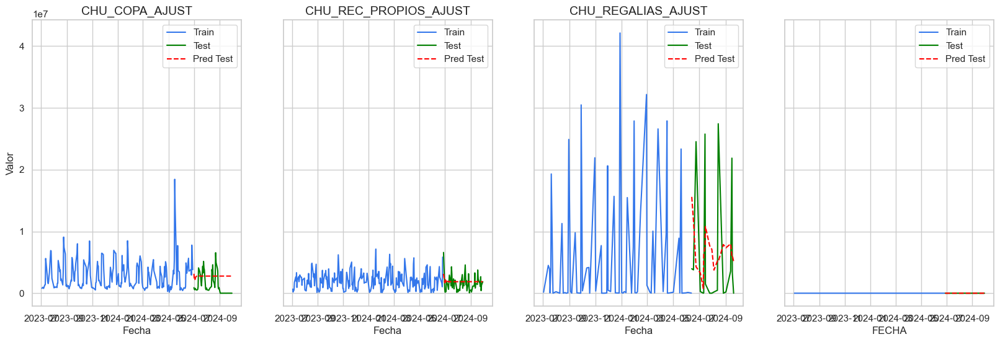

In [137]:
results_train_test = []
predictions_test = []
for i, df_train in enumerate(dataframes_train):
    # Entrenamiento del modelo ARIMA
    model = auto_arima(df_train, trace=True, suppress_warnings=True)
    models.append({
    "modelo": model,
    "titulo": f"aa_train_df{i}",
    "aic": model.aic(),
    "order": model.order})
    # Cálculo del MSE en el conjunto de entrenamiento
    mape_train = mean_absolute_percentage_error(df_train, model.predict_in_sample())

    # Obtener el DataFrame de test correspondiente
    df_test = dataframes_test[i]
    pred_test = model.predict(len(df_test))
    predictions_test.append(pred_test)
    # Cálculo del MSE en el conjunto de prueba
    mape_test = mean_absolute_percentage_error(df_test, pred_test)
    mape_mean = mean_absolute_percentage_error(df_test, [df_test.mean()] * len(df_test))
    pred_test.index = df_test.index
    results_train_test.append({
        "name": df_train.name,
        "len_train": len(df_train),
        "len_test": len(df_test),
        "mape_train": mape_train,
        "mape_test": mape_test,
        "mape_mean": mape_mean
    })
funciones.plot_train_test_predictions(
dataframes_train=dataframes_train,
dataframes_test=dataframes_test,
predictions_test=predictions_test,
series_names=titulos,
start_date='2023-07-01'
)

In [172]:



model = auto_arima(train_recursos_sinestacion, trace=True, suppress_warnings=True)
models.append({
"modelo": model,
"titulo": f"aa_train_df1_sinestac",
"aic": model.aic(),
"order": model.order})

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=18280.856, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=18330.986, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=18293.566, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=18291.105, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=18986.002, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=18294.068, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=18297.473, Time=0.22 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=18281.870, Time=0.62 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=18281.359, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=18295.698, Time=0.12 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=18281.610, Time=0.28 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=18287.040, Time=0.30 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=18283.397, Time=0.94 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.52 sec

Best model:  ARIMA(2,0,2

In [53]:
pd.DataFrame(results_train_test)

,name,len_train,len_test,mape_train,mape_test,mape_mean
0,CHU_COPA_AJUST,589,65,0.68,715.12,362.28
1,CHU_REC_PROPIOS_AJUST,590,66,1.35,1.99,1.57
2,CHU_REGALIAS_AJUST,171,19,"2,398.75","8,342.46","9,889.84"


In [80]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
results_train_test = []
predictions_test = []
for i, df_train in enumerate(dataframes_train):
    # Entrenamiento del modelo ARIMA
    model = ExponentialSmoothing(df_train,trend="add",seasonal='add', seasonal_periods=21).fit()
    models.append({
    "modelo": model,
    "titulo": f"expsmoth_train_df{i}",
    "aic": "",
    "order": ""})
    
    df_test = dataframes_test[i]
    pred_train = model.predict(start=0, end=len(df_train) - 1)
    pred_test = model.predict(start=len(df_train), end=len(df_train) + len(df_test) - 1)
    pred_test.index = df_test.index
    predictions_test.append(pred_test)
    # Cálculo del MAPE para entrenamiento y prueba
    mape_train = mean_absolute_percentage_error(df_train, pred_train)
    mape_test = mean_absolute_percentage_error(df_test, pred_test)
    mape_mean = mean_absolute_percentage_error(df_test, [df_test.mean()] * len(df_test))
    
    results_train_test.append({
        "name": df_train.name,
        "len_train": len(df_train),
        "len_test": len(df_test),
        "mape_train": mape_train,
        "mape_test": mape_test,
        "mape_mean": mape_mean
    })
pd.DataFrame(results_train_test)

,name,len_train,len_test,mape_train,mape_test,mape_mean
0,CHU_COPA_AJUST,589,65,0.65,972.85,362.28
1,CHU_REC_PROPIOS_AJUST,590,66,1.45,2.29,1.57
2,CHU_REGALIAS_AJUST,171,19,"1,693.65","10,941.29","9,889.84"


In [154]:
##### autoarima para df1 boxcox
model = ExponentialSmoothing(train_recursos_boxcox,trend="add",seasonal='add', seasonal_periods=21).fit()
models.append({
"modelo": model,
"titulo": f"expsmoth_train_df1_boxcox",
"aic": "",
"order": ""})

In [182]:
train_recursos_sinestacion = pd.to_numeric(train_recursos_sinestacion, errors='coerce').dropna()

model = ExponentialSmoothing(train_recursos_sinestacion,trend="add").fit()
models.append({
    "modelo": model,
    "titulo": f"expsmoth_train_df1_sinestac",
    "aic": model.aic,
    "order": ""})

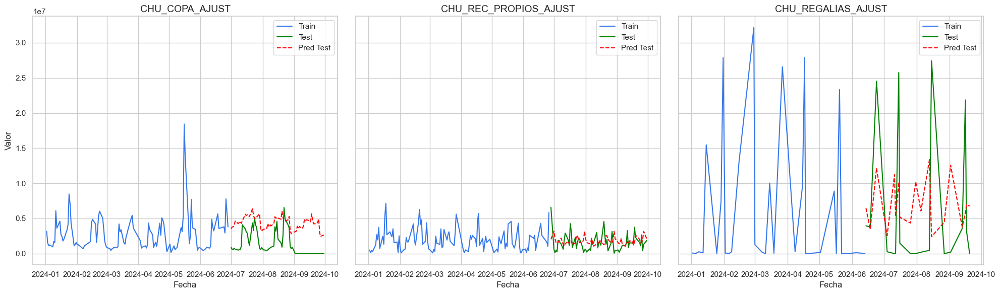

In [81]:

funciones.plot_train_test_predictions(
    dataframes_train=dataframes_train,
    dataframes_test=dataframes_test,
    predictions_test=predictions_test,
    series_names=titulos,
    start_date='2024-01-01'
)

,name,len_train,len_test,mape_train,mape_test,mape_mean
0,CHU_COPA_AJUST,589,65,0.52,"1,051.58",362.28
1,CHU_REC_PROPIOS_AJUST,590,66,1.48,1.97,1.57
2,CHU_REGALIAS_AJUST,171,19,"2,050.72","9,734.31","9,889.84"


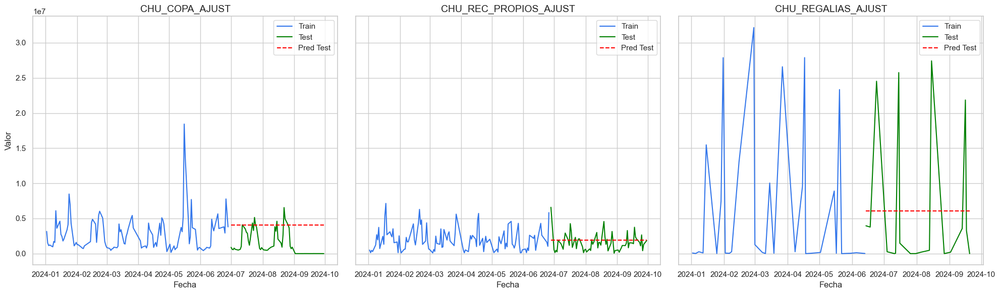

None

In [82]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
results_train_test = []
predictions_test = []
for i, df_train in enumerate(dataframes_train):
    # Entrenamiento del modelo ARIMA
    model = SimpleExpSmoothing(df_train).fit()
    models.append({
    "modelo": model,
    "titulo": f"simpsmoth_train_df{i}",
    "aic": "",
    "order": ""})
    df_test = dataframes_test[i]
    pred_train = model.predict(start=0, end=len(df_train) - 1)
    pred_test = model.predict(start=len(df_train), end=len(df_train) + len(df_test) - 1)
    pred_test.index = df_test.index
    predictions_test.append(pred_test)
    # Cálculo del MAPE para entrenamiento y prueba
    mape_train = mean_absolute_percentage_error(df_train, pred_train)
    mape_test = mean_absolute_percentage_error(df_test, pred_test)
    mape_mean = mean_absolute_percentage_error(df_test, [df_test.mean()] * len(df_test))
    
    results_train_test.append({
        "name": df_train.name,
        "len_train": len(df_train),
        "len_test": len(df_test),
        "mape_train": mape_train,
        "mape_test": mape_test,
        "mape_mean": mape_mean
    })
display(pd.DataFrame(results_train_test))

display(funciones.plot_train_test_predictions(
    dataframes_train=dataframes_train,
    dataframes_test=dataframes_test,
    predictions_test=predictions_test,
    series_names=titulos,
    start_date='2024-01-01'
))

In [155]:
##### autoarima para df1 boxcox

model = SimpleExpSmoothing(train_recursos_boxcox).fit()
models.append({
    "modelo": model,
    "titulo": f"simpsmoth_train_df1_boxcox",
    "aic": "",
    "order": ""})


In [179]:
train_recursos_sinestacion.head()

FECHA
2022-01-03 00:00:00     523165
2022-01-04 00:00:00     476333
2022-01-05 00:00:00    1125238
2022-01-06 00:00:00     865619
2022-01-07 00:00:00    2105995
Name: CHU_REC_PROPIOS_AJUST, dtype: object

In [180]:
train_recursos_sinestacion = pd.to_numeric(train_recursos_sinestacion, errors='coerce').dropna()

model = SimpleExpSmoothing(train_recursos_sinestacion).fit()
models.append({
    "modelo": model,
    "titulo": f"simpsmoth_train_df1_boxcox",
    "aic": model.aic,
    "order": ""})



### SARIMA

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[21] intercept   : AIC=18826.832, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[21] intercept   : AIC=18903.054, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[21] intercept   : AIC=18606.892, Time=0.94 sec
 ARIMA(0,0,1)(0,0,1)[21] intercept   : AIC=18646.564, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[21]             : AIC=19445.924, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[21] intercept   : AIC=18635.137, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[21] intercept   : AIC=18607.934, Time=7.33 sec
 ARIMA(1,0,0)(1,0,1)[21] intercept   : AIC=18606.472, Time=0.72 sec
 ARIMA(1,0,0)(0,0,1)[21] intercept   : AIC=18606.240, Time=0.26 sec
 ARIMA(1,0,0)(0,0,2)[21] intercept   : AIC=18606.118, Time=1.93 sec
 ARIMA(1,0,0)(1,0,2)[21] intercept   : AIC=18607.640, Time=2.76 sec
 ARIMA(0,0,0)(0,0,2)[21] intercept   : AIC=18817.445, Time=0.77 sec
 ARIMA(2,0,0)(0,0,2)[21] intercept   : AIC=18582.543, Time=1.34 sec
 ARIMA(2,0,0)(0,0,1)[21] intercept   : AIC=18585.512, Time=0.78 sec
 ARIM

,name,len_train,len_test,mape_train,mape_test,mape_mean
0,CHU_COPA_AJUST,589,65,0.62,683.03,362.28
1,CHU_REC_PROPIOS_AJUST,590,66,1.29,1.90,1.57
2,CHU_REGALIAS_AJUST,171,19,"2,735.76","10,275.91","9,889.84"


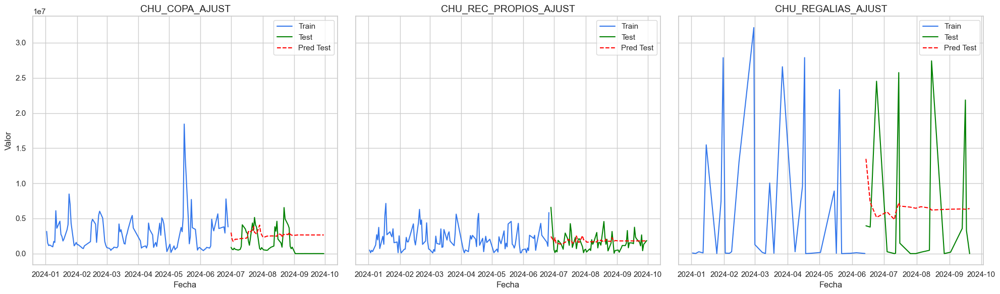

None

In [83]:
results_train_test = []
predictions_test = []
for i, df_train in enumerate(dataframes_train):
    # Entrenamiento del modelo ARIMA
    if i in [0,1]: 
        m = 21
    else :
        m = 6
    model = auto_arima(dataframes_train[i],
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=None,
                    D=None,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)
    models.append({
    "modelo": model,
    "titulo": f"sarima_train_df{i}",
    "aic": model.aic(),
    "order": model.order})
    
    mape_train = mean_absolute_percentage_error(df_train, model.predict_in_sample())

    # Obtener el DataFrame de test correspondiente
    df_test = dataframes_test[i]
    pred_test = model.predict(len(df_test))
    predictions_test.append(pred_test)
    # Cálculo del MSE en el conjunto de prueba
    mape_test = mean_absolute_percentage_error(df_test, pred_test)
    mape_mean = mean_absolute_percentage_error(df_test, [df_test.mean()] * len(df_test))
    pred_test.index = df_test.index
    
    results_train_test.append({
        "name": df_train.name,
        "len_train": len(df_train),
        "len_test": len(df_test),
        "mape_train": mape_train,
        "mape_test": mape_test,
        "mape_mean": mape_mean
    })
display(pd.DataFrame(results_train_test))

display(funciones.plot_train_test_predictions(
    dataframes_train=dataframes_train,
    dataframes_test=dataframes_test,
    predictions_test=predictions_test,
    series_names=titulos,
    start_date='2024-01-01'
))

In [183]:
train_recursos_sinestacion = pd.to_numeric(train_recursos_sinestacion, errors='coerce').dropna()





model = auto_arima(train_recursos_sinestacion,
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=None,
                    D=None,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)
models.append({
    "modelo": model,
    "titulo": f"sarima_train_df1_sinestac",
    "aic": model.aic(),
    "order": model.order})

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[6] intercept   : AIC=18332.239, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[6] intercept   : AIC=18330.986, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[6] intercept   : AIC=18295.529, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[6] intercept   : AIC=18292.804, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[6]             : AIC=18986.002, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[6] intercept   : AIC=18291.105, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[6] intercept   : AIC=18293.036, Time=0.26 sec
 ARIMA(0,0,1)(1,0,1)[6] intercept   : AIC=18294.063, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[6] intercept   : AIC=18295.698, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[6] intercept   : AIC=18290.978, Time=0.13 sec
 ARIMA(0,0,2)(1,0,0)[6] intercept   : AIC=18292.959, Time=0.40 sec
 ARIMA(0,0,2)(0,0,1)[6] intercept   : AIC=18292.263, Time=0.31 sec
 ARIMA(0,0,2)(1,0,1)[6] intercept   : AIC=18293.986, Time=0.92 sec
 ARIMA(1,0,2)(0,0,0)[6] intercept   : AIC=18294.068, Time=0.26 sec
 ARIMA(0,0,3)(0,0,0

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,1)[21]             : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(0,1,0)[21]             : AIC=18344.226, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[21]             : AIC=18248.827, Time=0.80 sec
 ARIMA(0,1,1)(0,1,1)[21]             : AIC=inf, Time=1.42 sec
 ARIMA(1,1,0)(0,1,0)[21]             : AIC=18343.833, Time=0.63 sec
 ARIMA(1,1,0)(2,1,0)[21]             : AIC=18220.932, Time=2.99 sec
 ARIMA(1,1,0)(2,1,1)[21]             : AIC=inf, Time=4.94 sec
 ARIMA(1,1,0)(1,1,1)[21]             : AIC=inf, Time=1.43 sec
 ARIMA(0,1,0)(2,1,0)[21]             : AIC=18202.231, Time=2.07 sec
 ARIMA(0,1,0)(1,1,0)[21]             : AIC=18237.650, Time=0.48 sec
 ARIMA(0,1,0)(2,1,1)[21]             : AIC=inf, Time=5.83 sec
 ARIMA(0,1,0)(1,1,1)[21]             : AIC=inf, Time=1.26 sec
 ARIMA(0,1,1)(2,1,0)[21]             : AIC=18219.493, Time=3.29 sec
 ARIMA(1,1,1)(2,1,0)[21]             : AIC=inf, Time=11.53 sec
 ARIMA(0,1,0)(2,1,0)[21] intercept   : AIC=182

,name,len_train,len_test,mape_train,mape_test,mape_mean
0,CHU_COPA_AJUST,589,65,0.78,"1,110.79",362.28
1,CHU_REC_PROPIOS_AJUST,590,66,1.53,2.43,1.57
2,CHU_REGALIAS_AJUST,171,19,"2,576.54","7,879.52","9,889.84"


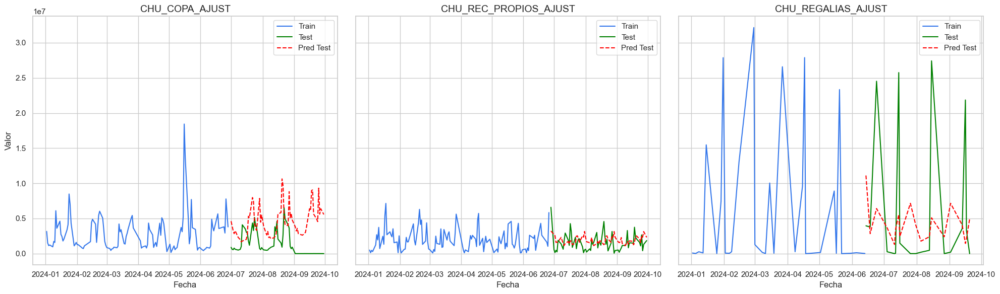

None

In [84]:
results_train_test = []
predictions_test = []
for i, df_train in enumerate(dataframes_train):
    # Entrenamiento del modelo ARIMA
    if i in [0,1]: 
        m = 21
    else :
        m = 6
    model = auto_arima(dataframes_train[i],
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=1,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)
    models.append({
    "modelo": model,
    "titulo": f"sarima_train_df{i}_diff",
    "aic": model.aic(),
    "order": model.order})
    
    mape_train = mean_absolute_percentage_error(df_train, model.predict_in_sample())

    # Obtener el DataFrame de test correspondiente
    df_test = dataframes_test[i]
    pred_test = model.predict(len(df_test))
    predictions_test.append(pred_test)
    # Cálculo del MSE en el conjunto de prueba
    mape_test = mean_absolute_percentage_error(df_test, pred_test)
    mape_mean = mean_absolute_percentage_error(df_test, [df_test.mean()] * len(df_test))
    pred_test.index = df_test.index
    
    results_train_test.append({
        "name": df_train.name,
        "len_train": len(df_train),
        "len_test": len(df_test),
        "mape_train": mape_train,
        "mape_test": mape_test,
        "mape_mean": mape_mean
    })
display(pd.DataFrame(results_train_test))

display(funciones.plot_train_test_predictions(
    dataframes_train=dataframes_train,
    dataframes_test=dataframes_test,
    predictions_test=predictions_test,
    series_names=titulos,
    start_date='2024-01-01'
))

In [157]:
##### autoarima para df1 boxcox


model = auto_arima(train_recursos_boxcox,
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=1,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)
models.append({
    "modelo": model,
    "titulo": f"sarima_train_df1_boxcox_diff",
    "aic": model.aic(),
    "order": model.order})


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,1)[6]             : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(0,1,0)[6]             : AIC=8312.756, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[6]             : AIC=8075.013, Time=0.33 sec
 ARIMA(0,1,1)(0,1,1)[6]             : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,1,0)[6]             : AIC=8233.854, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[6]             : AIC=7980.467, Time=0.36 sec
 ARIMA(1,1,0)(2,1,1)[6]             : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(1,1,1)[6]             : AIC=inf, Time=1.26 sec
 ARIMA(0,1,0)(2,1,0)[6]             : AIC=8056.908, Time=0.14 sec
 ARIMA(2,1,0)(2,1,0)[6]             : AIC=7888.505, Time=0.56 sec
 ARIMA(2,1,0)(1,1,0)[6]             : AIC=7999.861, Time=0.54 sec
 ARIMA(2,1,0)(2,1,1)[6]             : AIC=inf, Time=2.32 sec
 ARIMA(2,1,0)(1,1,1)[6]             : AIC=inf, Time=1.24 sec
 ARIMA(3,1,0)(2,1,0)[6]             : AIC=7882.079, Time=1.53 sec
 ARIMA(3,1,0)(1,1,0)[6]             : AIC=7999.777, Time=0.87 s

In [184]:
train_recursos_sinestacion = pd.to_numeric(train_recursos_sinestacion, errors='coerce').dropna()





model = auto_arima(train_recursos_sinestacion,
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=1,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)
models.append({
    "modelo": model,
    "titulo": f"sarima_train_df1_sinestac_diff",
    "aic": model.aic(),
    "order": model.order})

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,1)[6]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,1,0)[6]             : AIC=18730.210, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[6]             : AIC=18515.733, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[6]             : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,1,0)[6]             : AIC=18633.876, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[6]             : AIC=18463.264, Time=0.29 sec
 ARIMA(1,1,0)(2,1,1)[6]             : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(1,1,1)[6]             : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(2,1,0)[6]             : AIC=18509.279, Time=0.23 sec
 ARIMA(2,1,0)(2,1,0)[6]             : AIC=18376.749, Time=0.62 sec
 ARIMA(2,1,0)(1,1,0)[6]             : AIC=18440.240, Time=0.35 sec
 ARIMA(2,1,0)(2,1,1)[6]             : AIC=inf, Time=1.10 sec
 ARIMA(2,1,0)(1,1,1)[6]             : AIC=inf, Time=1.64 sec
 ARIMA(3,1,0)(2,1,0)[6]             : AIC=18362.440, Time=1.20 sec
 ARIMA(3,1,0)(1,1,0)[6]             : AIC=18432.374, Ti

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,1)[21] intercept   : AIC=18713.281, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[21] intercept   : AIC=18730.329, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[21] intercept   : AIC=18713.402, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[21] intercept   : AIC=18712.340, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[21]             : AIC=18728.334, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[21] intercept   : AIC=18730.175, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[21] intercept   : AIC=18714.200, Time=0.79 sec
 ARIMA(0,1,1)(0,0,2)[21] intercept   : AIC=18714.088, Time=2.31 sec
 ARIMA(0,1,1)(1,0,0)[21] intercept   : AIC=18712.599, Time=0.76 sec
 ARIMA(0,1,1)(1,0,2)[21] intercept   : AIC=18716.340, Time=2.54 sec
 ARIMA(1,1,1)(0,0,1)[21] intercept   : AIC=18607.693, Time=2.14 sec
 ARIMA(1,1,1)(0,0,0)[21] intercept   : AIC=18635.704, Time=0.55 sec
 ARIMA(1,1,1)(1,0,1)[21] intercept   : AIC=18609.614, Time=3.75 sec
 ARIMA(1,1,1)(0,0,2)[21] intercept   : AIC=18606.771, Time=7.28 sec
 ARIM

,name,len_train,len_test,mape_train,mape_test,mape_mean
0,CHU_COPA_AJUST,589,65,0.67,911.44,362.28
1,CHU_REC_PROPIOS_AJUST,590,66,1.41,2.35,1.57
2,CHU_REGALIAS_AJUST,171,19,"2,624.61","9,933.40","9,889.84"


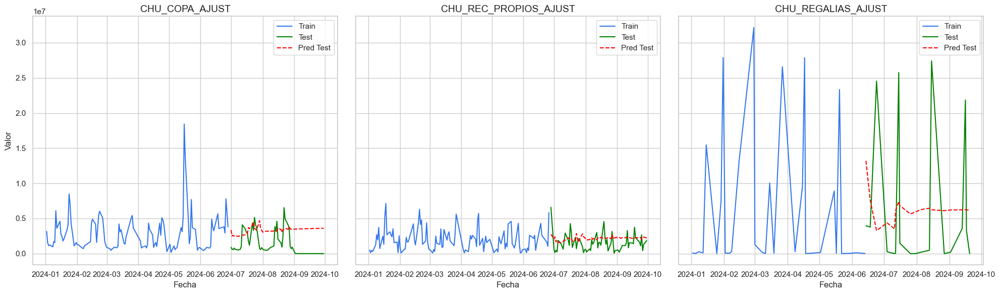

None

In [85]:
results_train_test = []
predictions_test = []
for i, df_train in enumerate(dataframes_train):
    # Entrenamiento del modelo ARIMA
    if i in [0,1]: 
        m = 21
    else :
        m = 6
    model = auto_arima(dataframes_train[i],
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=0,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)
    models.append({
    "modelo": model,
    "titulo": f"sarima_train_df{i}_diff_sin_estac",
    "aic": model.aic(),
    "order": model.order})
    
    mape_train = mean_absolute_percentage_error(df_train, model.predict_in_sample())

    # Obtener el DataFrame de test correspondiente
    df_test = dataframes_test[i]
    pred_test = model.predict(len(df_test))
    predictions_test.append(pred_test)
    # Cálculo del MSE en el conjunto de prueba
    mape_test = mean_absolute_percentage_error(df_test, pred_test)
    mape_mean = mean_absolute_percentage_error(df_test, [df_test.mean()] * len(df_test))
    pred_test.index = df_test.index
    
    results_train_test.append({
        "name": df_train.name,
        "len_train": len(df_train),
        "len_test": len(df_test),
        "mape_train": mape_train,
        "mape_test": mape_test,
        "mape_mean": mape_mean
    })
display(pd.DataFrame(results_train_test))

display(funciones.plot_train_test_predictions(
    dataframes_train=dataframes_train,
    dataframes_test=dataframes_test,
    predictions_test=predictions_test,
    series_names=titulos,
    start_date='2024-01-01'
))

In [158]:
##### autoarima para df1 boxcox


model = auto_arima(train_recursos_boxcox,
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=0,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)
models.append({
    "modelo": model,
    "titulo": f"sarima_train_df1_boxcox_diff_sin_estac",
    "aic": model.aic(),
    "order": model.order})


Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,1)[6] intercept   : AIC=7970.949, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[6] intercept   : AIC=7969.847, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[6] intercept   : AIC=7900.791, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[6] intercept   : AIC=7808.903, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[6]             : AIC=7967.862, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[6] intercept   : AIC=7810.378, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[6] intercept   : AIC=7809.093, Time=0.83 sec
 ARIMA(0,1,1)(0,0,2)[6] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,1,1)(1,0,0)[6] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,1,1)(1,0,2)[6] intercept   : AIC=inf, Time=1.93 sec
 ARIMA(1,1,1)(0,0,1)[6] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,2)(0,0,1)[6] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,1,0)(0,0,1)[6] intercept   : AIC=7900.766, Time=0.18 sec
 ARIMA(1,1,2)(0,0,1)[6] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,1,1)(0,0,1)[6]             : AIC=7806.937, Time=0.76 s

In [185]:
train_recursos_sinestacion = pd.to_numeric(train_recursos_sinestacion, errors='coerce').dropna()





model = auto_arima(train_recursos_sinestacion,
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=0,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)
models.append({
    "modelo": model,
    "titulo": f"sarima_train_df1_sinestac_diff_sinestac",
    "aic": model.aic(),
    "order": model.order})

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,1)[6] intercept   : AIC=18531.533, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[6] intercept   : AIC=18529.799, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[6] intercept   : AIC=18453.051, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[6] intercept   : AIC=18340.160, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[6]             : AIC=18527.825, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[6] intercept   : AIC=18338.537, Time=0.27 sec
 ARIMA(0,1,1)(1,0,0)[6] intercept   : AIC=18339.884, Time=0.53 sec
 ARIMA(0,1,1)(1,0,1)[6] intercept   : AIC=18326.926, Time=0.90 sec
 ARIMA(0,1,1)(2,0,1)[6] intercept   : AIC=18307.568, Time=1.02 sec
 ARIMA(0,1,1)(2,0,0)[6] intercept   : AIC=18321.362, Time=0.76 sec
 ARIMA(0,1,1)(2,0,2)[6] intercept   : AIC=inf, Time=4.24 sec
 ARIMA(0,1,1)(1,0,2)[6] intercept   : AIC=18316.862, Time=0.75 sec
 ARIMA(0,1,0)(2,0,1)[6] intercept   : AIC=18535.147, Time=0.37 sec
 ARIMA(1,1,1)(2,0,1)[6] intercept   : AIC=18294.962, Time=0.92 sec
 ARIMA(1,1,1)(1,0,1)[6] i

### SARIMAX

In [120]:
# models.pop()


{'modelo': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x1826b67fa10>,
 'titulo': 'sarimax_train_df0',
 'aic': 18706.01394597045,
 'order': {'trend': 0,
  'exog': 2,
  'ar': 3,
  'ma': 0,
  'seasonal_ar': 0,
  'seasonal_ma': 42,
  'reduced_ar': 3,
  'reduced_ma': 42,
  'exog_variance': 0,
  'measurement_variance': 0,
  'variance': 1}}

,name,len_train,len_test,mape_train,mape_test,mape_mean
0,CHU_COPA_AJUST,589,65,0.45,58.68,362.28
1,CHU_REC_PROPIOS_AJUST,590,66,0.79,0.87,1.57
2,CHU_REGALIAS_AJUST,171,19,"2,257.35","10,245.02","9,889.84"


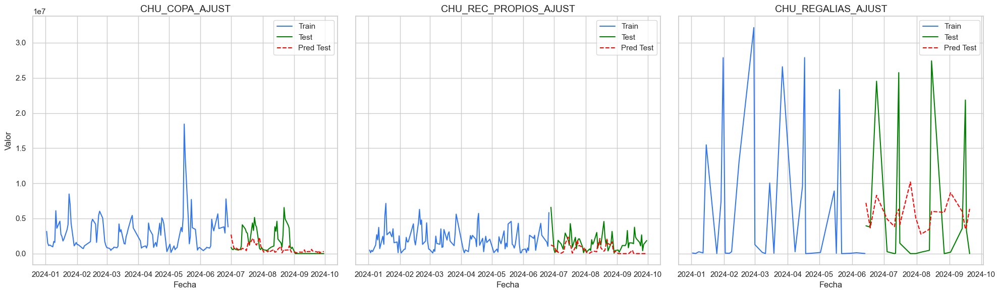

None

In [86]:
results_train_test = []
predictions_test = []
for i, df_train in enumerate(dataframes_train):
    # Entrenamiento del modelo ARIMA
    name = dataframes_train[i].name
    df_train = dataframes_train[i].to_frame()
    df_train.index = pd.to_datetime(df_train.index)
    df_test = dataframes_test[i].to_frame()
    df_test.index = pd.to_datetime(df_test.index)
    dfs = [0,1,2]
    dfs.remove(i)
    titulos_otros_df = titulos.copy()
    titulos_otros_df.remove(titulos[i])
    for j in dfs:
        df_train = df_train.join(dataframes_train[j].to_frame(), how='left')
        df_test = df_test.join(dataframes_test[j].to_frame(), how='left')
    df_train.fillna(0,inplace=True)
    df_test.fillna(0,inplace=True)
    # df_train = df_train.dropna(subset=titulos)
    # df_test = df_test.dropna(subset=titulos)
    # order de todos los df train
    orders = {row["titulo"]:row["modelo"].order for row in models if "sarima_" in row["titulo"]}
    # seasonal order de todos los df train
    sorders = {row["titulo"]:row["modelo"].seasonal_order for row in models if "sarima_" in row["titulo"]}
    
    model = sm.tsa.SARIMAX(df_train[name], order=orders[f"sarima_train_df{i}"], seasonal_order=sorders[f"sarima_train_df{i}"], exog=df_train[list(titulos_otros_df)]).fit()
    models.append({
    "modelo": model,
    "titulo": f"sarimax_train_df{i}",
    "aic": model.aic,
    "order": model.model_orders})
    pred_train =  model.predict(start=0, end=len(df_train)-1 ,exog=df_train[list(titulos_otros_df)])
    mape_train = mean_absolute_percentage_error(df_train[name], pred_train)

    # Obtener el DataFrame de test correspondiente
    pred_test =  model.predict(start=len(df_train), end=len(df_train) + len(df_test) - 1 , exog=df_test[list(titulos_otros_df)])
    predictions_test.append(pred_test)
    # Cálculo del MSE en el conjunto de prueba
    mape_test = mean_absolute_percentage_error(df_test[name], pred_test)
    mape_mean = mean_absolute_percentage_error(df_test[name], [df_test[name].mean()] * len(df_test))
    pred_test.index = df_test[name].index
    
    results_train_test.append({
        "name": name,
        "len_train": len(df_train),
        "len_test": len(df_test),
        "mape_train": mape_train,
        "mape_test": mape_test,
        "mape_mean": mape_mean
    })
display(pd.DataFrame(results_train_test))

display(funciones.plot_train_test_predictions(
    dataframes_train=dataframes_train,
    dataframes_test=dataframes_test,
    predictions_test=predictions_test,
    series_names=titulos,
    start_date='2024-01-01'
))

Crear modelos aplicando transformaciones

In [ ]:
# quitar estacionalidad... etc....

In [ ]:
# from sklearn.model_selection import TimeSeriesSplit

# tscv = TimeSeriesSplit(gap=2, n_splits=5)

# train_sets = []
# test_sets = []

# for i, (train_index, test_index) in enumerate(tscv.split(dataframes[0])):
#     train_data = dataframes[0].iloc[train_index, 0]
#     test_data = dataframes[0].iloc[test_index, 0]

#     train_sets.append(train_data)
#     test_sets.append(test_data)
# 1


# train1, test1 = train_sets[0], test_sets[0]
# train2, test2 = train_sets[1], test_sets[1]
# train3, test3 = train_sets[2], test_sets[2]
# train4, test4 = train_sets[3], test_sets[3]
# train5, test5 = train_sets[4], test_sets[4]

In [ ]:
# from sklearn.model_selection import TimeSeriesSplit
# tscv = TimeSeriesSplit(gap=2, n_splits=5)

# def graficar_split(data, tscv):
#     for i, (train_index, test_index) in enumerate(tscv.split(data)):
#         plt.figure(figsize=(12, 6))
#         plt.plot(data.index, data, label='Total', color='grey')

#         plt.plot(data.index[train_index], data.iloc[train_index], 'o-', label='Train Set', color='blue')
#         plt.plot(data.index[test_index], data.iloc[test_index], 'x--', label='Test Set', color='red')

#         plt.title(f'Particion {i + 1}')
#         plt.xlabel('Tiempo')
#         plt.ylabel('Total')
#         plt.legend()
#         plt.grid(True)
#         plt.show()
        
# graficar_split(dataframes[0], tscv)

In [188]:
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(gap=2, n_splits=5)

train_sets = []
test_sets = []

for i, (train_index, test_index) in enumerate(tscv.split(dataframes[0])):
    # Elimina el índice adicional, dejando solo uno
    train_data = dataframes[0].iloc[train_index]
    test_data = dataframes[0].iloc[test_index]

    train_sets.append(train_data)
    test_sets.append(test_data)

# Asigna los conjuntos de entrenamiento y prueba
train1, test1 = train_sets[0], test_sets[0]
train2, test2 = train_sets[1], test_sets[1]
train3, test3 = train_sets[2], test_sets[2]
train4, test4 = train_sets[3], test_sets[3]
train5, test5 = train_sets[4], test_sets[4]


In [ ]:
model1 = ExponentialSmoothing(train1,trend="mul", seasonal='mul', seasonal_periods=12).fit()
pred1 = model1.predict(start=test1.index[0], end=test1.index[-1])
MSE1=round(mean_squared_error(test1, pred1),2)
model2 = ExponentialSmoothing(train2,trend="mul", seasonal='mul', seasonal_periods=12).fit()
pred2 = model2.predict(start=test2.index[0], end=test2.index[-1])
MSE2=round(mean_squared_error(test2, pred2),2)
model3 = ExponentialSmoothing(train3,trend="mul", seasonal='mul', seasonal_periods=12).fit()
pred3 = model3.predict(start=test3.index[0], end=test3.index[-1])
MSE3=round(mean_squared_error(test3, pred3),2)
model4 = ExponentialSmoothing(train4,trend="mul", seasonal='mul', seasonal_periods=12).fit()
pred4 = model4.predict(start=test4.index[0], end=test4.index[-1])
MSE4=round(mean_squared_error(test4, pred4),2)
model5 = ExponentialSmoothing(train5,trend="mul", seasonal='mul', seasonal_periods=12).fit()
pred5 = model5.predict(start=test5.index[0], end=test5.index[-1])
MSE5=round(mean_squared_error(test5, pred5),2)

In [200]:
model_1 = auto_arima(train1,
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=0,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

# pred1 = model_1.predict(start=test1.index[0], end=test1.index[-1])
pred1 = model_1.predict(n_periods=len(test1))


model_2 = auto_arima(train2,
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=0,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

#pred2 = model_2.predict(start=test2.index[0], end=test2.index[-1])
pred2 = model_2.predict(n_periods=len(test2))

model_3 = auto_arima(train3,
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=0,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

# pred3 = model_3.predict(start=test3.index[0], end=test3.index[-1])
pred3 = model_3.predict(n_periods=len(test3))

model_4= auto_arima(train4,
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=0,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

# pred4 = model_4.predict(start=test4.index[0], end=test4.index[-1])
pred4 = model_4.predict(n_periods=len(test4))


model_5 = auto_arima(train5,
                    start_p=0,
                    start_q=0,
                    max_p=12,
                    max_q=12,
                    m=m, # segun gpt recomiendas m=21 ya que 21 dias laborales en un mes.
                    start_P=0,
                    seasonal=True,
                    d=1,
                    D=0,
                    trace=True,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)

# pred5 = model_5.predict(start=test5.index[0], end=test5.index[-1])
pred5 = model_5.predict(n_periods=len(test5))

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,1)[6] intercept   : AIC=3334.210, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[6] intercept   : AIC=3334.025, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[6] intercept   : AIC=3335.228, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[6] intercept   : AIC=3335.387, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[6]             : AIC=3332.036, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[6] intercept   : AIC=3334.091, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[6] intercept   : AIC=3336.069, Time=0.75 sec
 ARIMA(1,1,0)(0,0,0)[6] intercept   : AIC=3335.049, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[6] intercept   : AIC=3335.160, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[6] intercept   : AIC=3336.920, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[6]          
Total fit time: 1.635 seconds
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,1)[6] intercept   : AIC=6836.684, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[6] intercept   : AIC=6834.712, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[6] intercept   : AIC=683

In [197]:
display(test1.shape)
display(pred1.shape)

(109,)

(109,)

In [204]:
MSE1=round(mean_squared_error(test1, pred1),2)
MSE2=round(mean_squared_error(test2, pred2),2)
MSE3=round(mean_squared_error(test3, pred3),2)
MSE4=round(mean_squared_error(test4, pred4),2)
MSE5=round(mean_squared_error(test5, pred5),2)

print ("Error cuadratico medio 1:", MSE1)
print ("Error cuadratico medio 2:", MSE2)
print ("Error cuadratico medio 3:", MSE3)
print ("Error cuadratico medio 4:", MSE4)
print ("Error cuadratico medio 5:", MSE5)

Overall_MSE=round((MSE1+MSE2+MSE3+MSE4+MSE5)/5,2)
print ("Error cuadratico medio general:", Overall_MSE)






Error cuadratico medio 1: 5947993157893.98
Error cuadratico medio 2: 6224717447018.6
Error cuadratico medio 3: 4740342465666.23
Error cuadratico medio 4: 3624220541604.82
Error cuadratico medio 5: 8433169299317.59
Error cuadratico medio general: 5794088582300.24


In [205]:
rmse1 = np.sqrt(MSE1)
rmse2 = np.sqrt(MSE2)
rmse3 = np.sqrt(MSE3)
rmse4 = np.sqrt(MSE4)
rmse5 = np.sqrt(MSE5)

print ("Error cuadratico medio 1:", rmse1)
print ("Error cuadratico medio 2:", rmse2)
print ("Error cuadratico medio 3:", rmse3)
print ("Error cuadratico medio 4:", rmse4)
print ("Error cuadratico medio 5:", rmse5)


Overall_RMSE=round((rmse1+rmse2+rmse3+rmse4+rmse5)/5,2)
print ("Error cuadratico medio general:", Overall_RMSE)

Error cuadratico medio 1: 2438850.7863118607
Error cuadratico medio 2: 2494938.365374704
Error cuadratico medio 3: 2177232.7541322336
Error cuadratico medio 4: 1903738.56965835
Error cuadratico medio 5: 2903991.9592377646
Error cuadratico medio general: 2383750.49


In [206]:
mae1 = mean_absolute_error(test1, pred1)
mae2 = mean_absolute_error(test2, pred2)
mae3 = mean_absolute_error(test3, pred3)
mae4 = mean_absolute_error(test4, pred4)
mae5 = mean_absolute_error(test5, pred5)

print ("Error cuadratico medio 1:", mae1)
print ("Error cuadratico medio 2:", mae2)
print ("Error cuadratico medio 3:", mae3)
print ("Error cuadratico medio 4:", mae4)
print ("Error cuadratico medio 5:", mae5)

Overall_mae=round((mae1+mae2+mae3+mae4+mae5)/5,2)
print ("Error cuadratico medio general:", Overall_mae)

Error cuadratico medio 1: 1757541.5716797656
Error cuadratico medio 2: 2171825.0221140096
Error cuadratico medio 3: 1775826.409204386
Error cuadratico medio 4: 1656188.8842732543
Error cuadratico medio 5: 2243689.8249771805
Error cuadratico medio general: 1921014.34


In [211]:
non_zero_test5 = test1 != 0  # Identificar los valores no cero en test5
mape5 = np.mean(np.abs((test1[non_zero_test5] - pred1.mean()) / test1[non_zero_test5])) * 100

print(f"MAPE5: {mape5}")

MAPE5: 77.65348617977344


In [212]:
mape1 = np.mean(np.abs((test1 - pred1.mean()) / test1)) * 100
mape2 = np.mean(np.abs((test2 - pred2.mean()) / test2)) * 100
mape3 = np.mean(np.abs((test3 - pred3.mean()) / test3)) * 100
mape4 = np.mean(np.abs((test4 - pred4.mean()) / test4)) * 100
mape5 = np.mean(np.abs((test5 - pred5.mean()) / test5)) * 100

print ("Error cuadratico medio 1:", mape1)
print ("Error cuadratico medio 2:", mape2)
print ("Error cuadratico medio 3:", mape3)
print ("Error cuadratico medio 4:", mape4)
print ("Error cuadratico medio 5:", mape5)
Overall_mape=round((mape1+mape2+mape3+mape4+mape5)/5,2)
print ("Error cuadratico medio general:", Overall_mape)

Error cuadratico medio 1: 77.65348617977344
Error cuadratico medio 2: 165.3964194952992
Error cuadratico medio 3: 90.56877244558478
Error cuadratico medio 4: 119.52691810749134
Error cuadratico medio 5: 47743.346806208334
Error cuadratico medio general: 9639.3


Relación cruzada

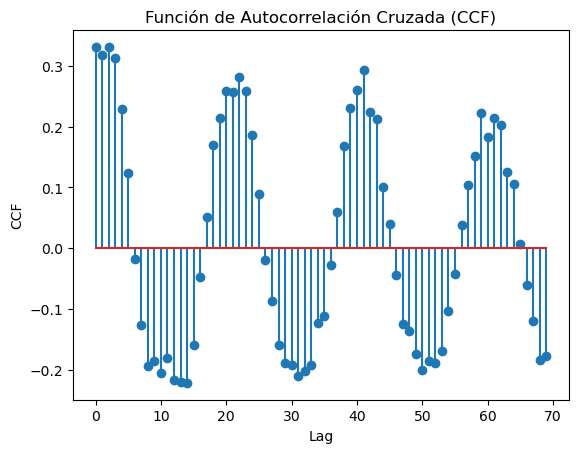

In [179]:
from statsmodels.tsa.stattools import ccf

MediaDestino2_array = train_sarimax['CHU_COPA_AJUST'].values
MediaDestino1_array = train_sarimax['CHU_REC_PROPIOS_AJUST'].values

import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import ccf

# Calculo de CCF
lags = 70
cross_corr = ccf(MediaDestino2_array, MediaDestino1_array)[:lags]

# Grafico de CCF
plt.stem(range(lags), cross_corr)  # Eliminar el argumento 'use_line_collection'
plt.title('Función de Autocorrelación Cruzada (CCF)')
plt.xlabel('Lag')
plt.ylabel('CCF')
plt.show()

In [87]:
pd.DataFrame(models)

,modelo,titulo,aic,order
0,"ARIMA(3,0,0)(0,0,0)[0] intercept",aa_train_df0,"18,603.33","(3, 0, 0)"
1,"ARIMA(2,0,2)(0,0,0)[0] intercept",aa_train_df1,"18,243.38","(2, 0, 2)"
2,"ARIMA(4,0,3)(0,0,0)[0] intercept",aa_train_df2,"5,962.15","(4, 0, 3)"
3,<statsmodels.tsa.holtwinters.results.HoltWinte...,expsmoth_train_df0,,
4,<statsmodels.tsa.holtwinters.results.HoltWinte...,expsmoth_train_df1,,
5,<statsmodels.tsa.holtwinters.results.HoltWinte...,expsmoth_train_df2,,
6,<statsmodels.tsa.holtwinters.results.HoltWinte...,simpsmoth_train_df0,,
7,<statsmodels.tsa.holtwinters.results.HoltWinte...,simpsmoth_train_df1,,
8,<statsmodels.tsa.holtwinters.results.HoltWinte...,simpsmoth_train_df2,,
9,"ARIMA(3,0,0)(0,0,2)[21] intercept",sarima_train_df0,"18,573.84","(3, 0, 0)"


In [75]:
# models_completo = models
# models = []
# for modelo in models_completo:
#     if "train" in modelo["titulo"]:
#         models.append(modelo)

In [78]:
# pd.DataFrame(models_completo)

""


## Ejercicio 8

Efectuar un Análisis de Diagnóstico de las series temporales (Análisis sobre los Residuos del modelo, análisis gráfico de FAC, test de Ljung-Box, etc.).

In [88]:
def plotear_residuos(modelo, titulo):
    if titulo.startswith(("aa_","sarima_")):
        modelo.resid().plot(figsize=(20,5))
    else:
        modelo.resid.plot(figsize=(20,5))
    plt.title(titulo,size=24)
    plt.show()

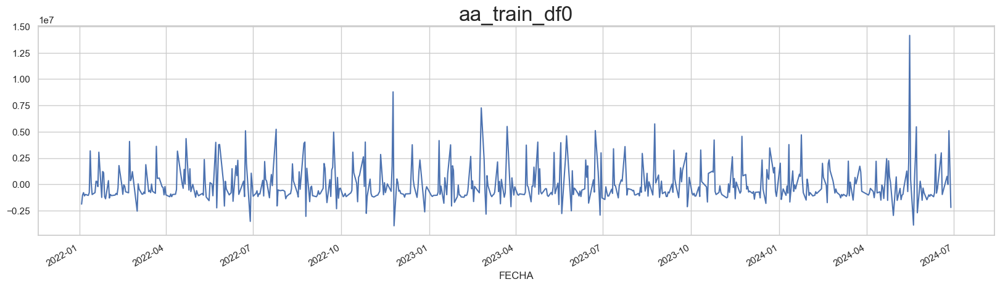

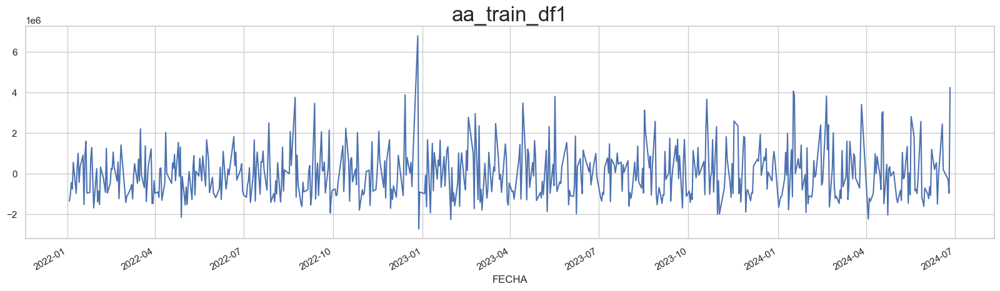

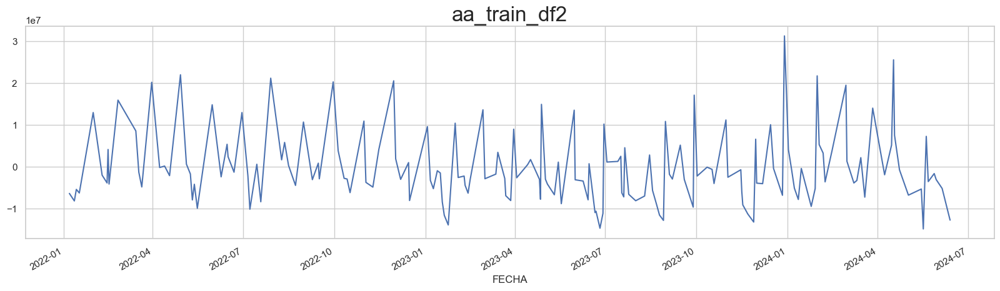

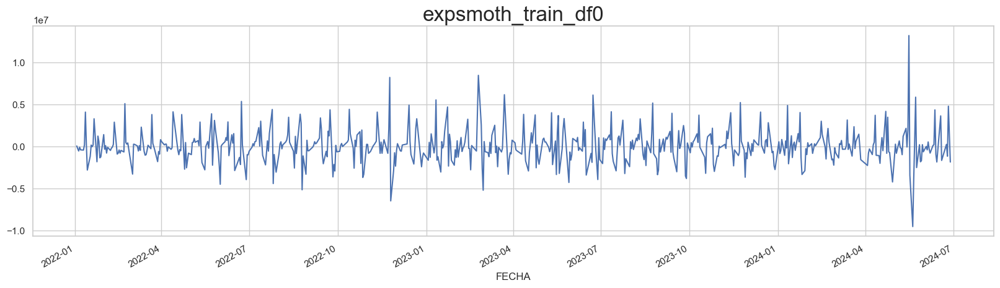

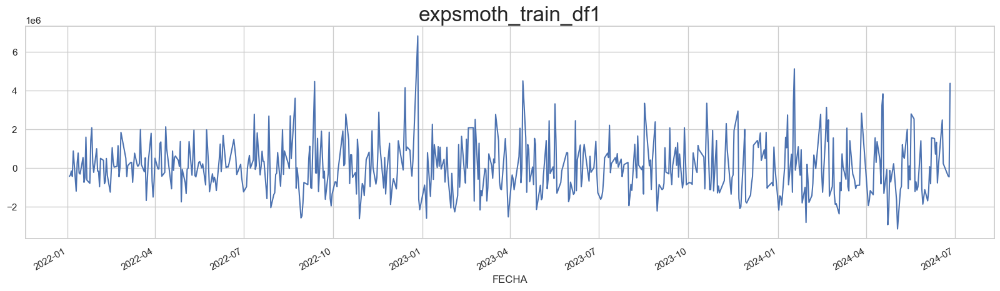

...

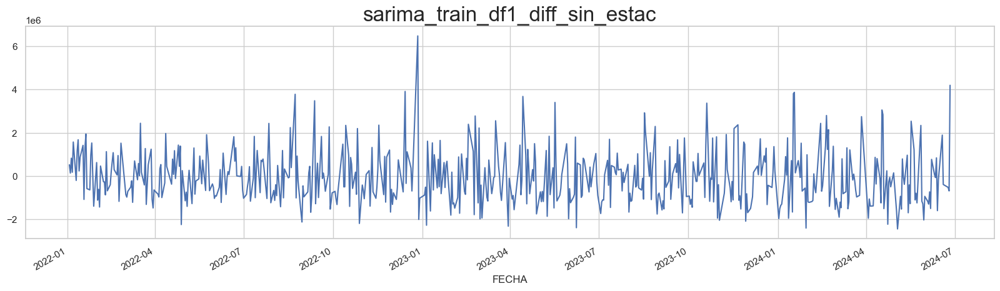

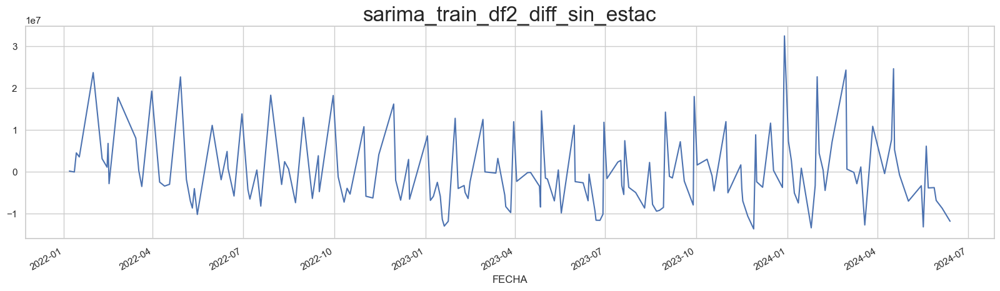

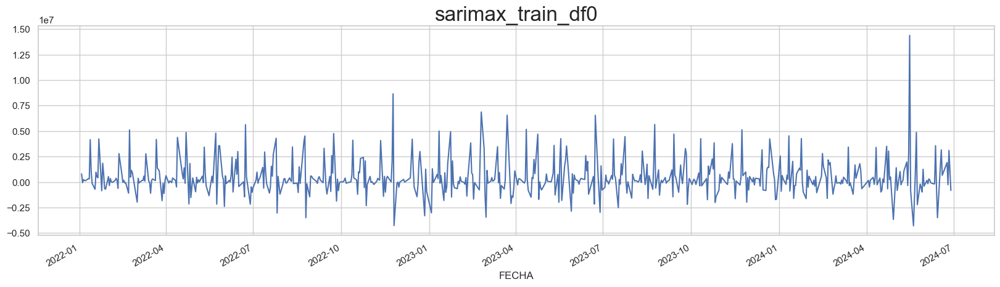

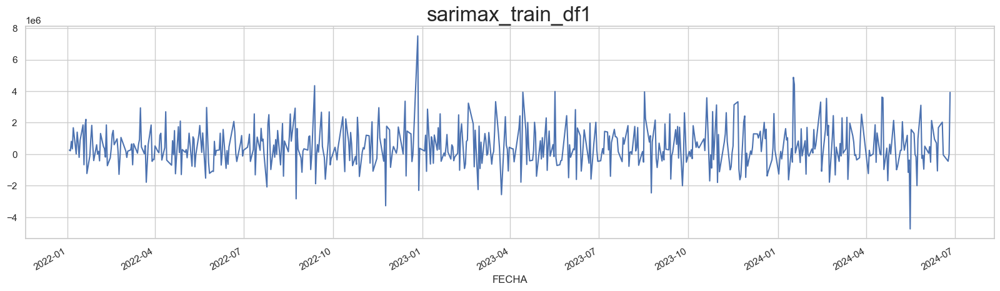

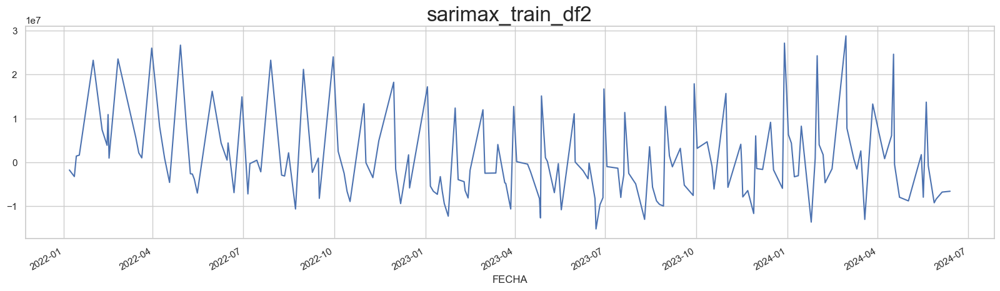

In [89]:
for modelo in models:
  try:

    plotear_residuos(modelo["modelo"],modelo["titulo"])
  except:
    print(f"Error en {modelo['titulo']}")

#### Gráficos PAC y PACF de los residuos

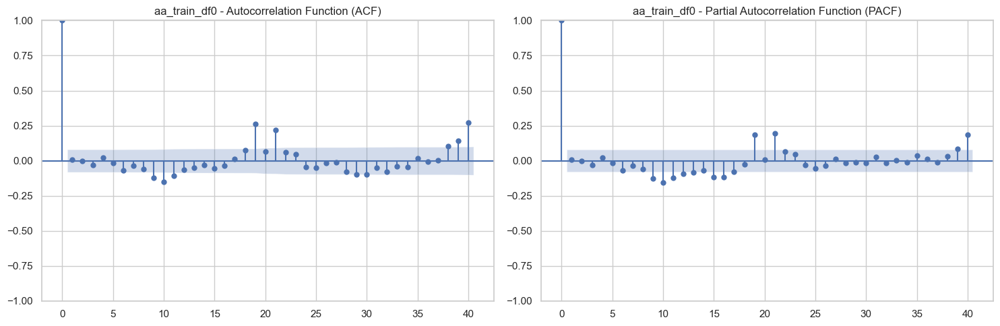

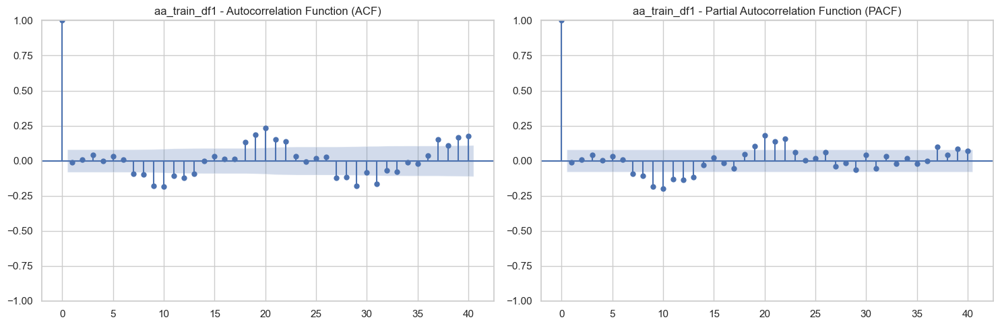

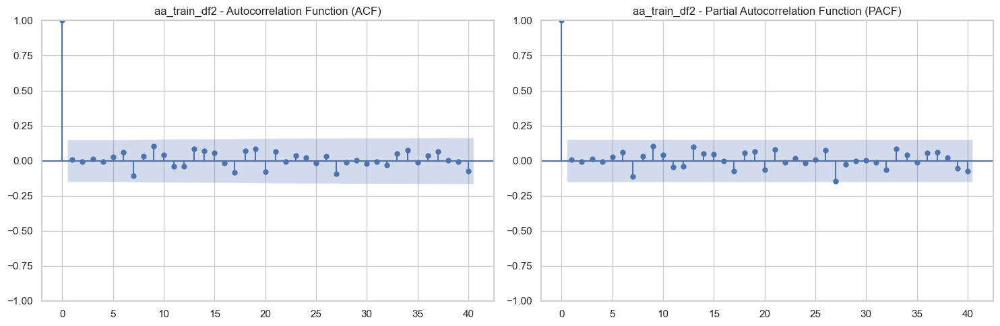

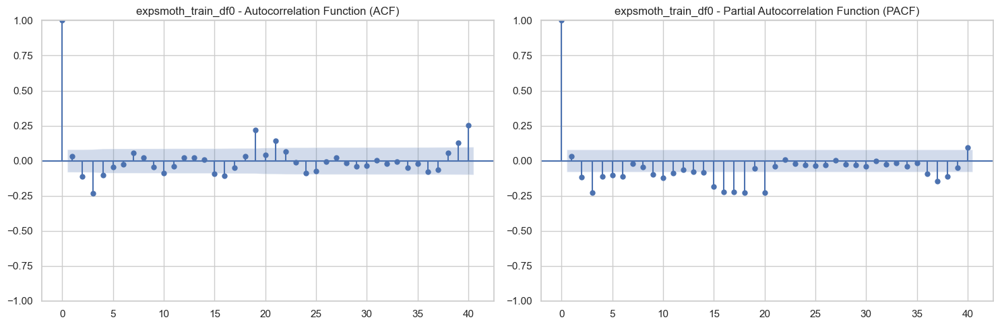

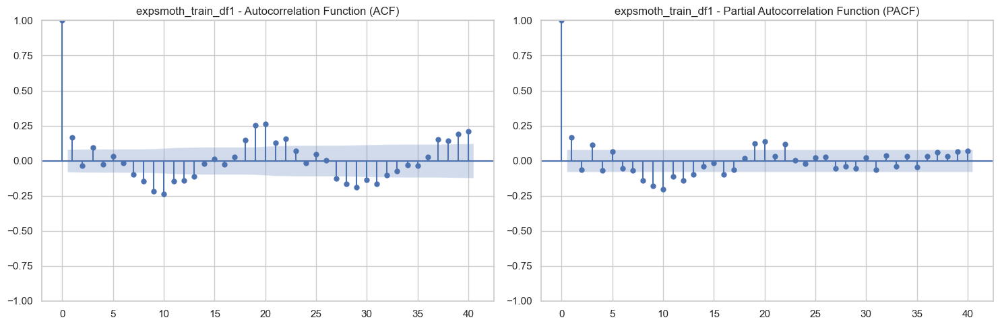

...

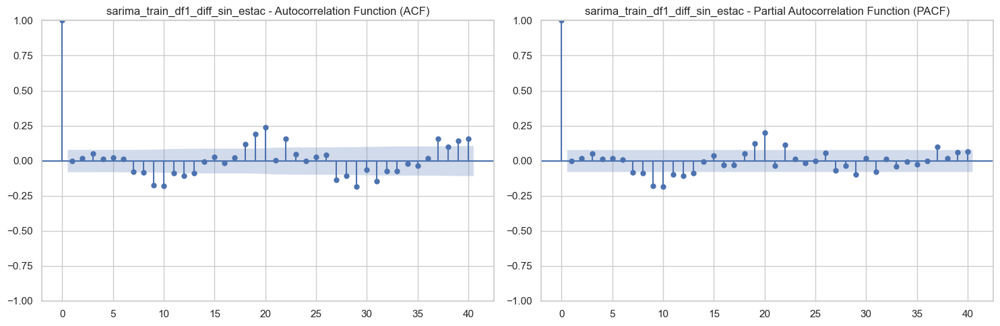

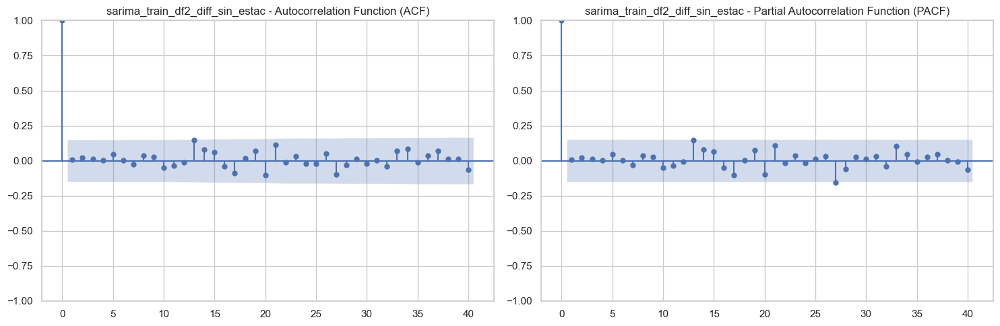

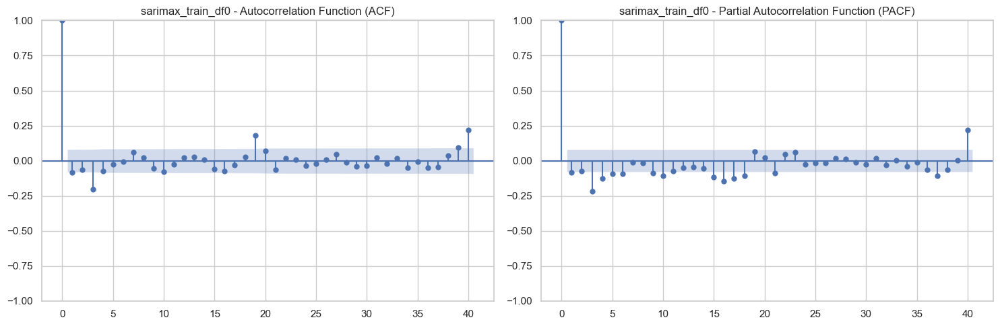

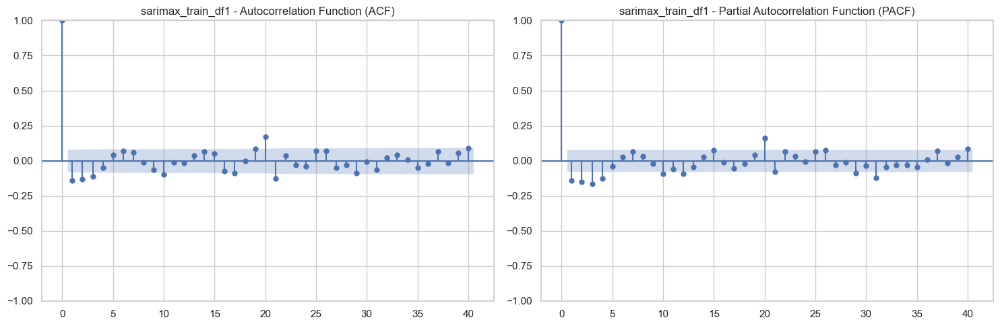

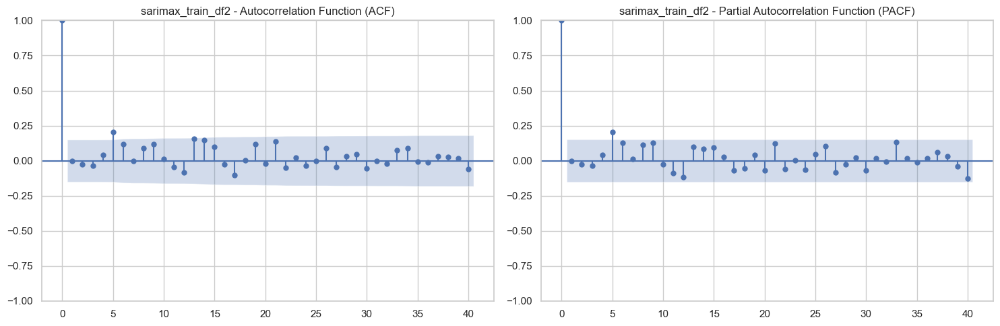

In [90]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def plot_acf_pacf(model_result, titulo):
    # Obtener los residuos del modelo
    if titulo.startswith(("aa_","sarima_")):
        residuals = model_result.resid()
    else:
        residuals = model_result.resid

    # Crear una figura con dos subplots
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # ACF en el subplot izquierdo
    plot_acf(residuals, ax=axes[0], lags=40)
    axes[0].set_title(f'{titulo} - Autocorrelation Function (ACF)')

    # PACF en el subplot derecho
    plot_pacf(residuals, ax=axes[1], lags=40)
    axes[1].set_title(f'{titulo} - Partial Autocorrelation Function (PACF)')
    
    # Mostrar el gráfico
    plt.tight_layout()
    plt.show()
    
for modelo in models:
    try:
        plot_acf_pacf(modelo["modelo"],modelo["titulo"])
    except:
        print(f"Error en {modelo['titulo']}")

#### Análisis diagnóstico de los residuos: QQPlot - Normalizacion - Correlograma

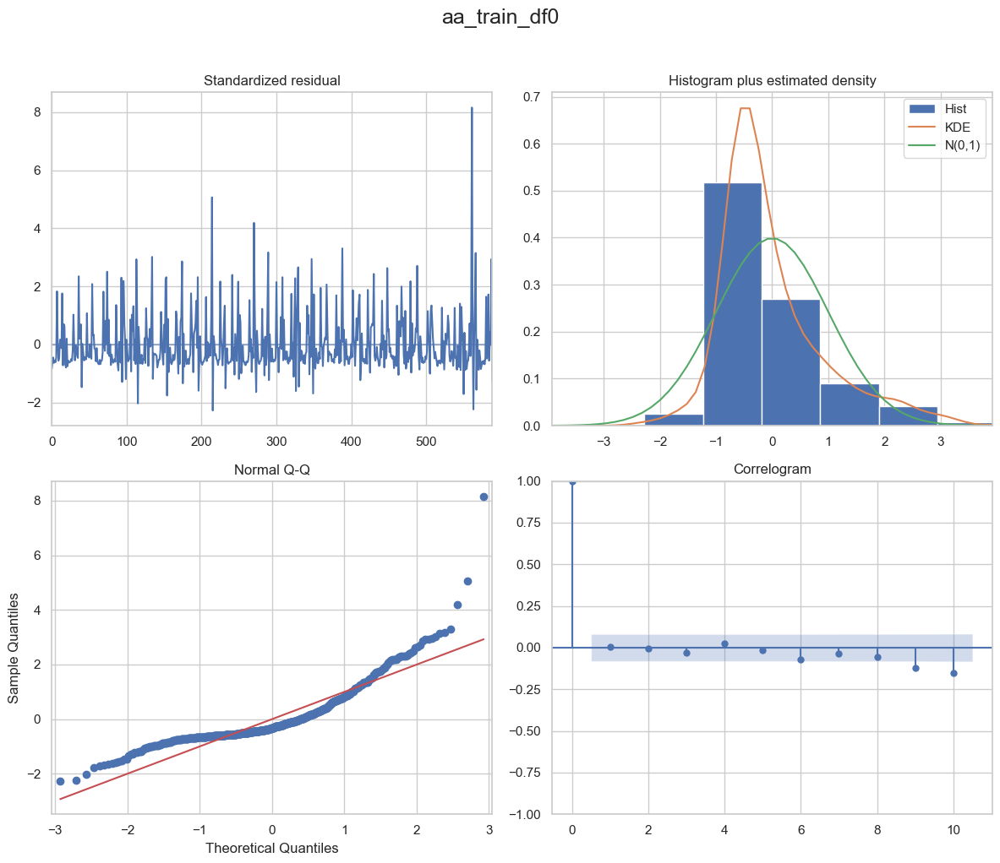

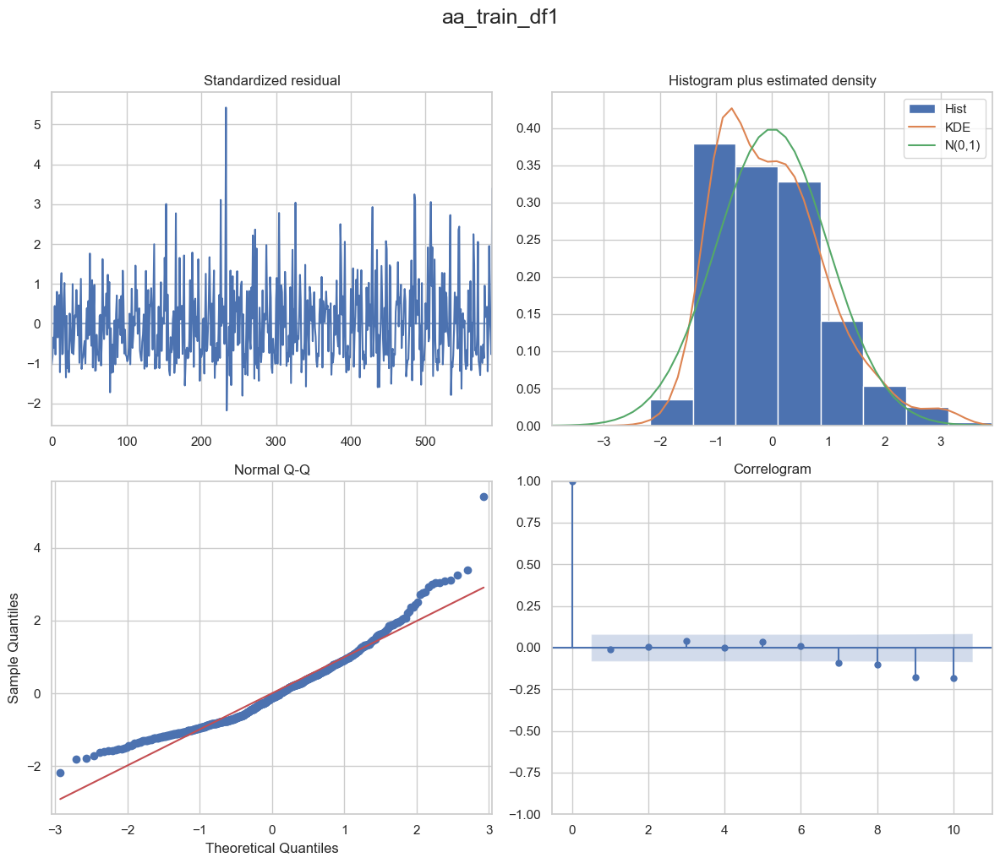

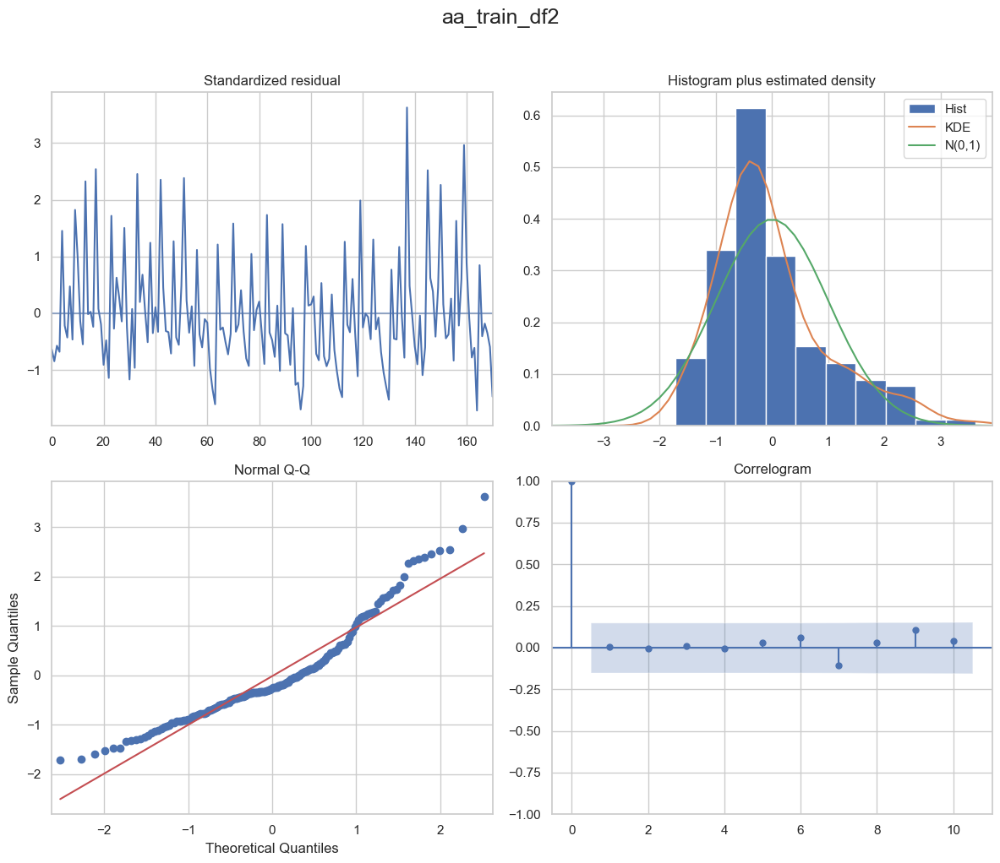

Error en expsmoth_train_df0
Error en expsmoth_train_df1
Error en expsmoth_train_df2
Error en simpsmoth_train_df0
Error en simpsmoth_train_df1
Error en simpsmoth_train_df2


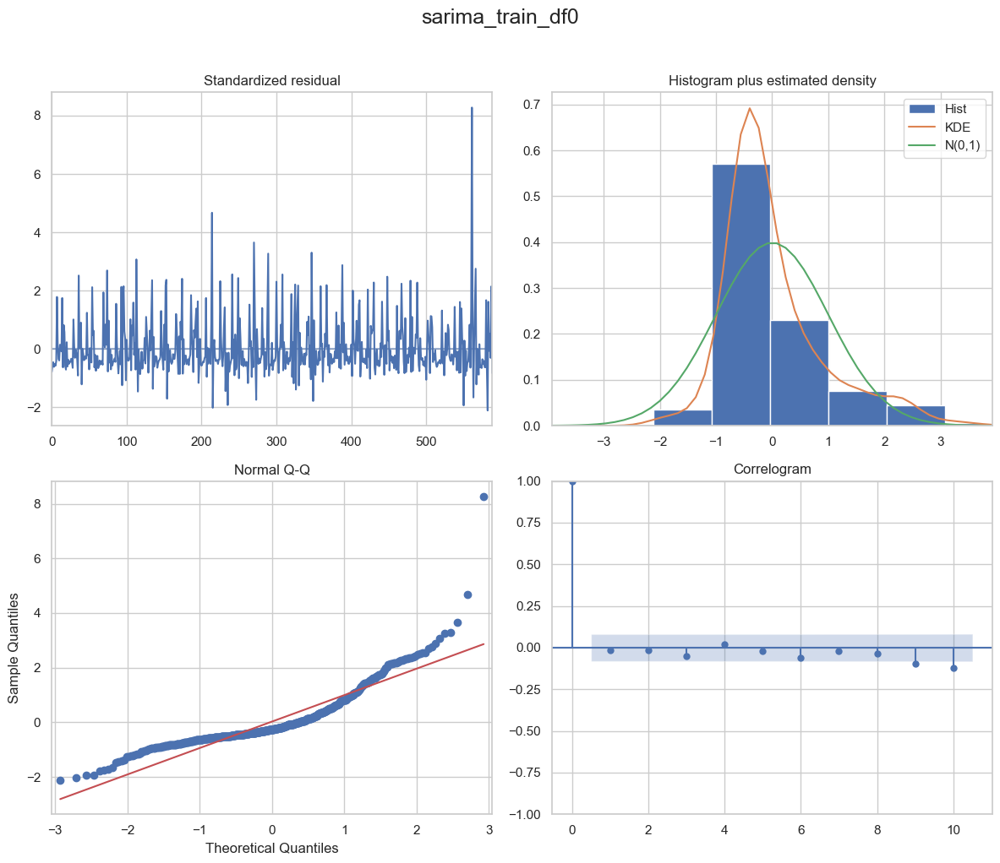

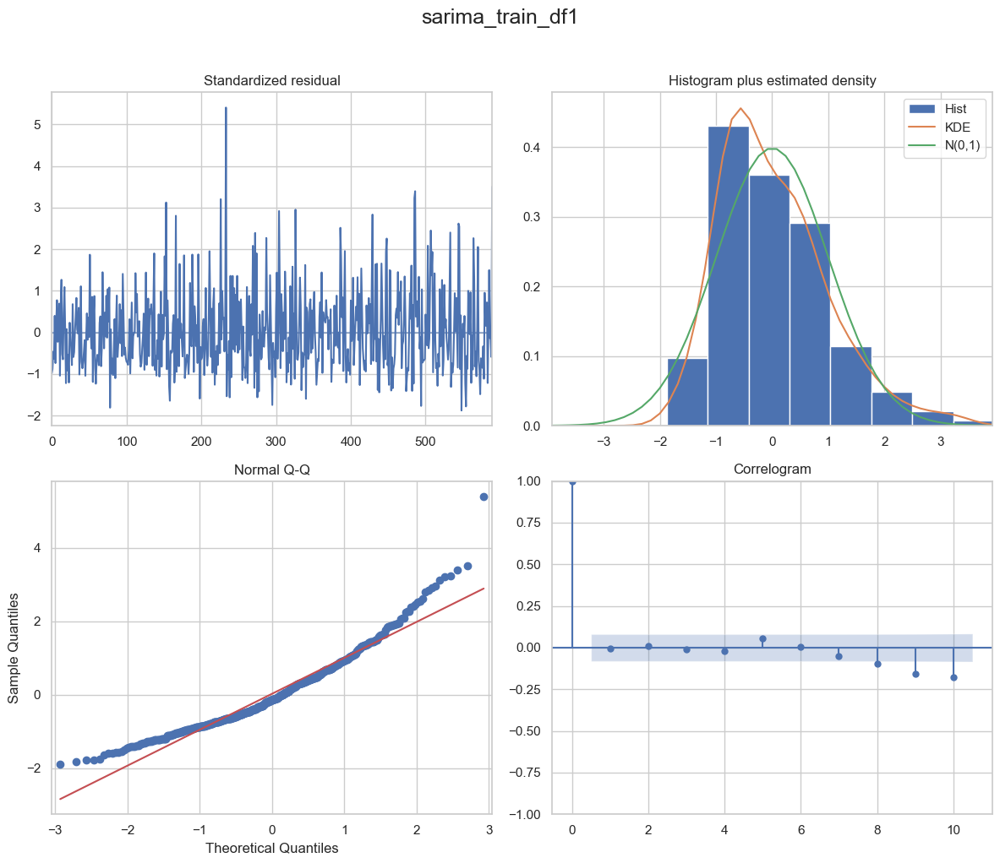

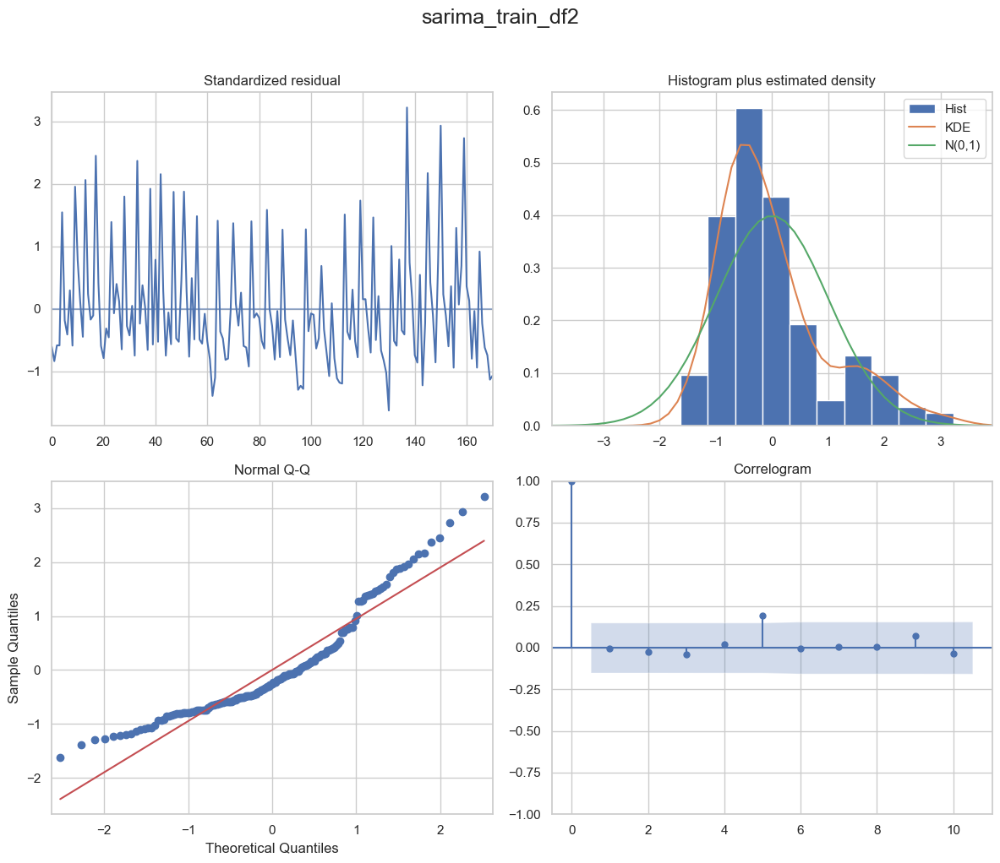

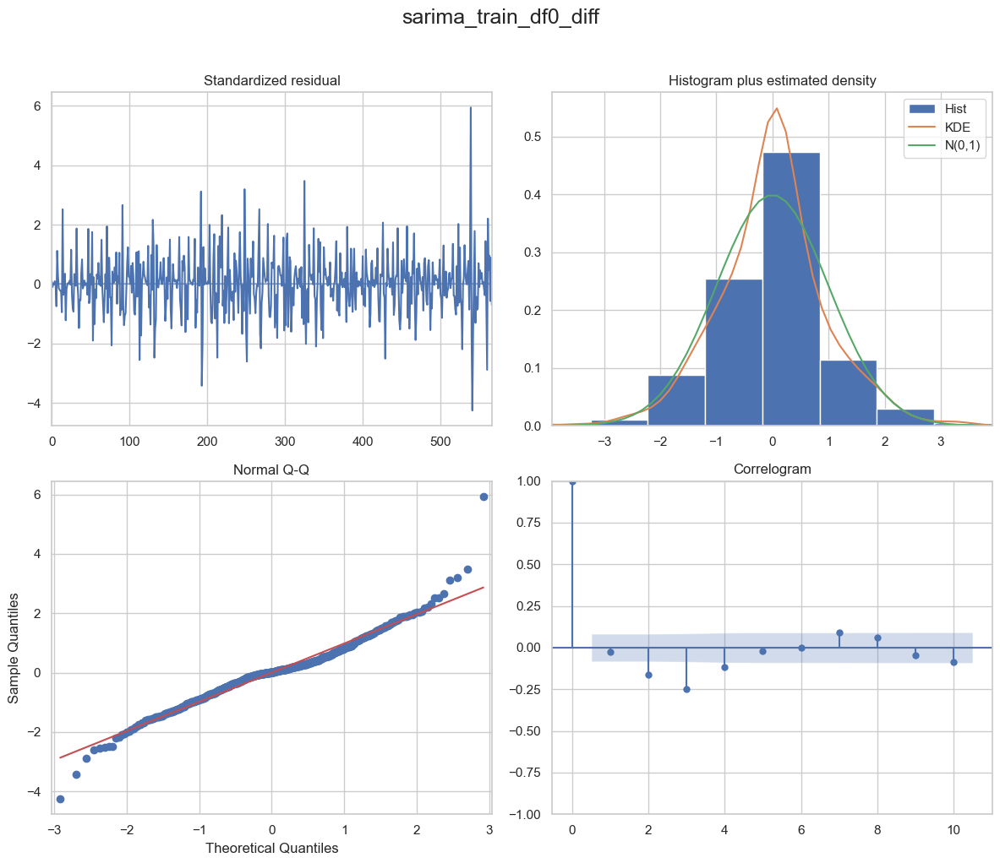

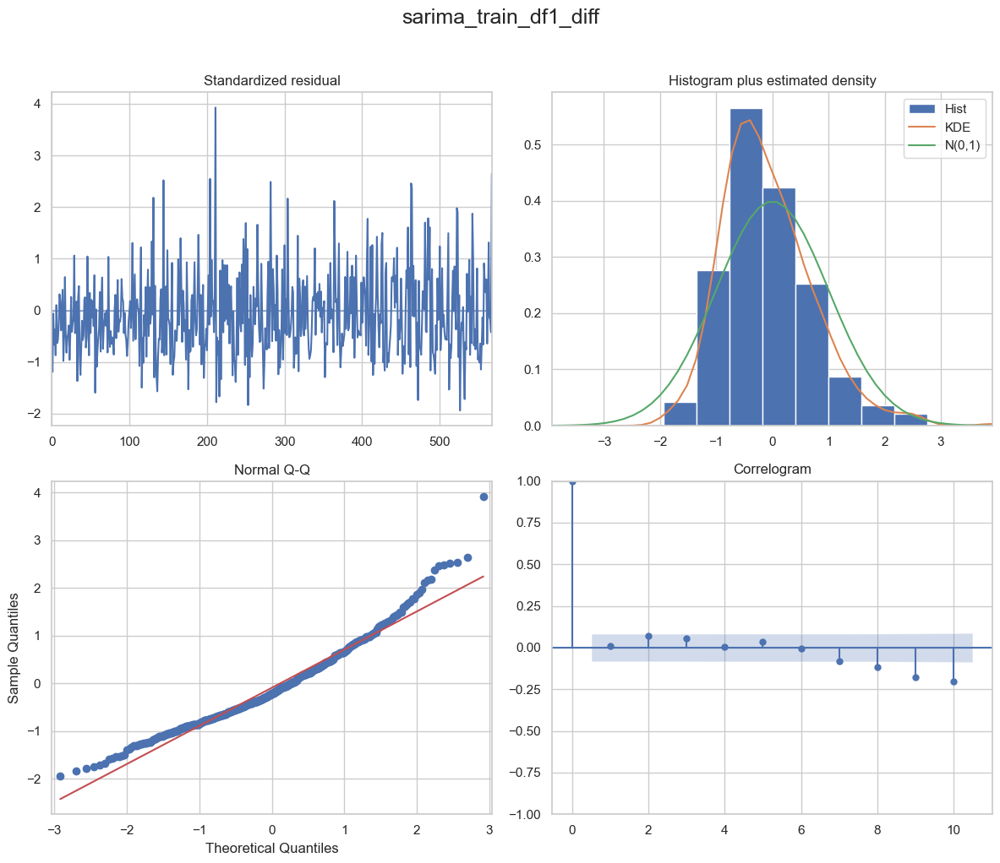

...

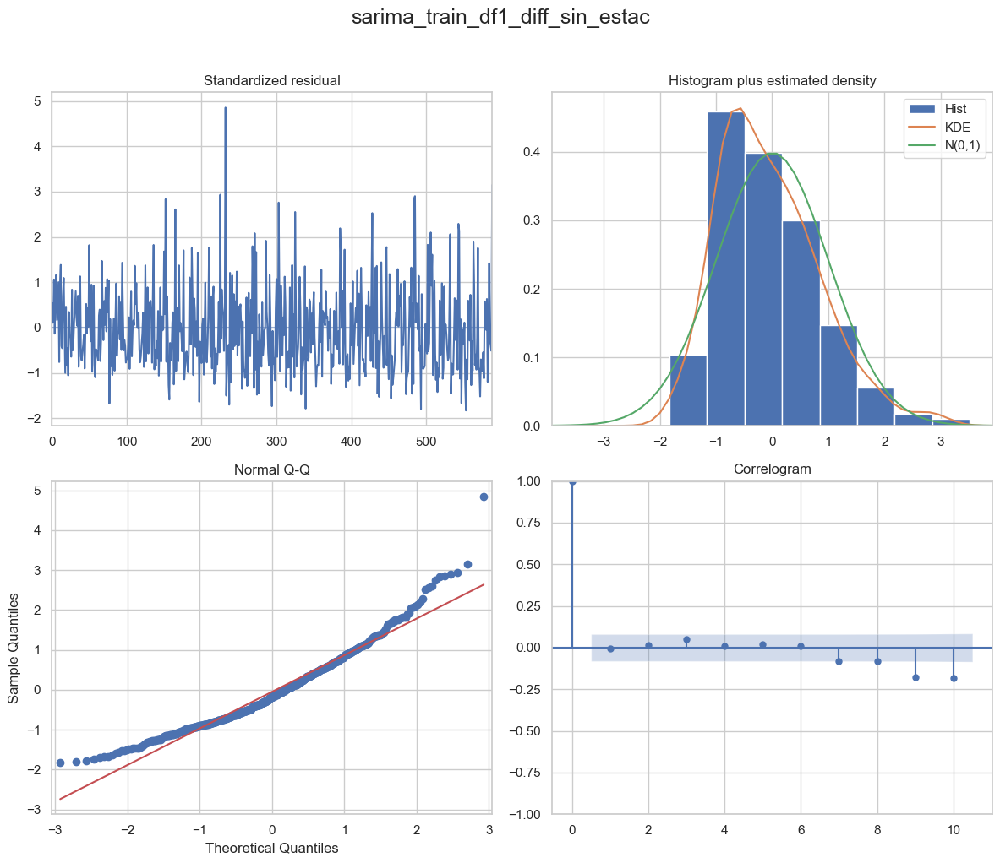

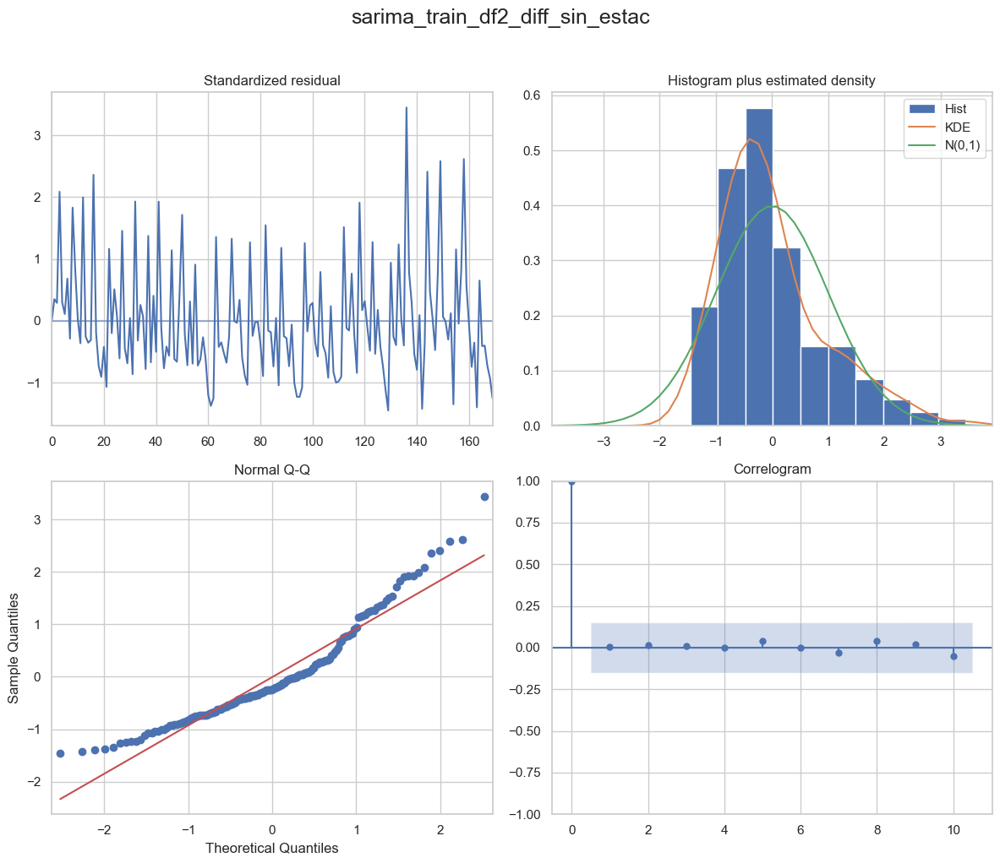

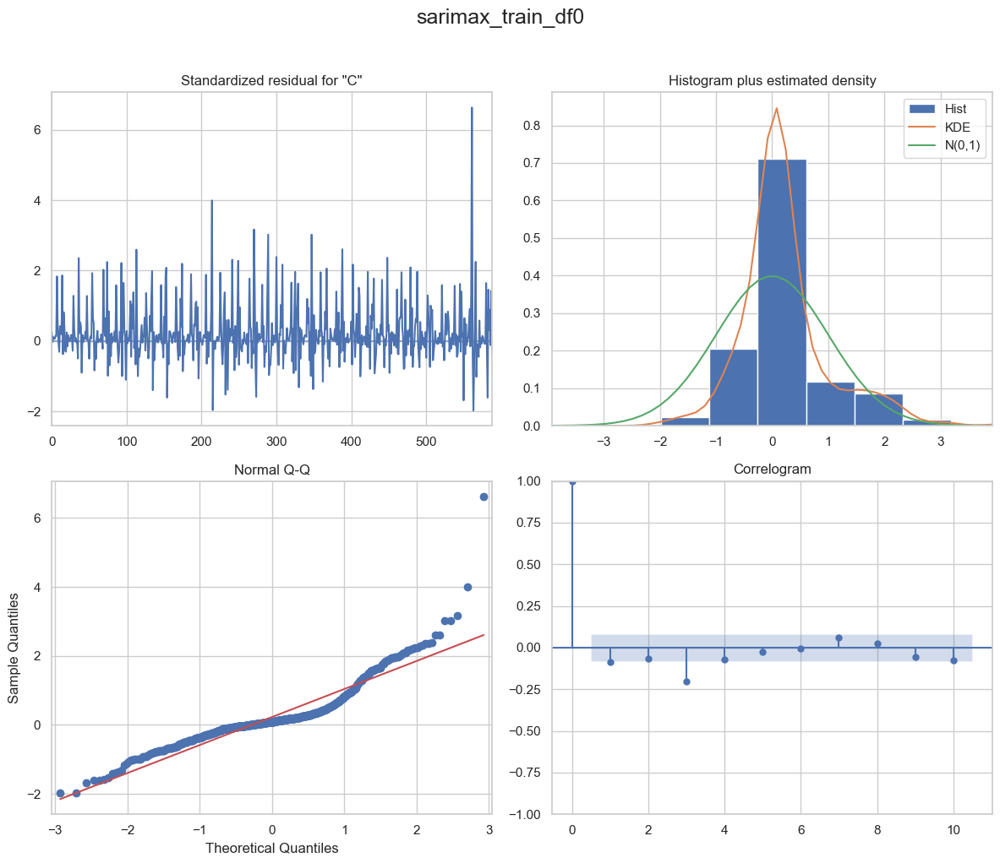

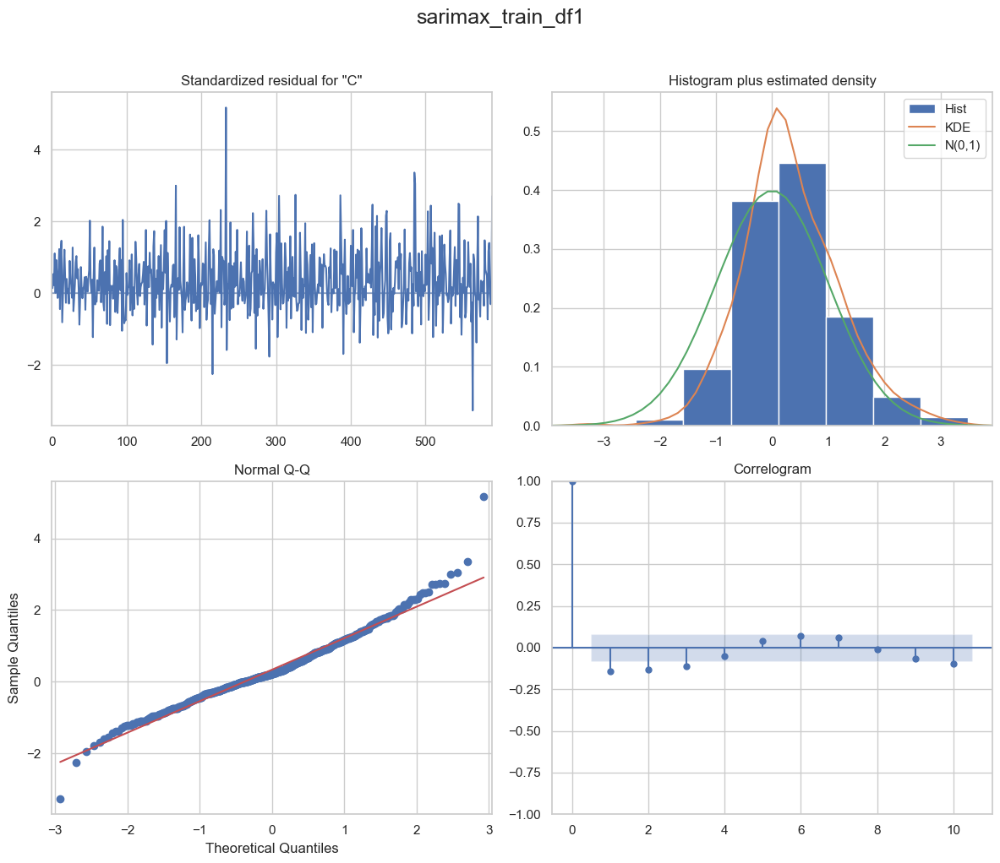

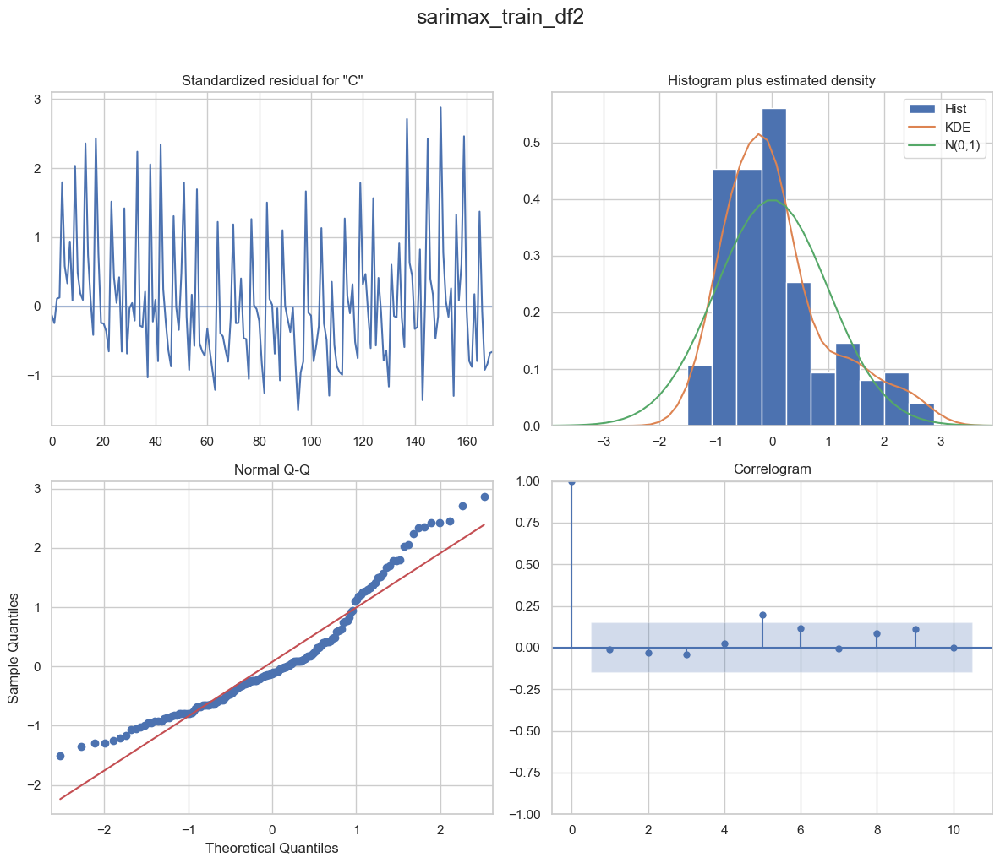

In [91]:
def plotear_analisis_diagnostico_residuos(modelo, titulo):
    fig = modelo.plot_diagnostics(figsize=(12, 10))
    
    # Agregar un título general a la figura
    fig.suptitle(titulo, size=18, y=1.02)  # y=1.02 ajusta la posición vertical del título
    
    plt.tight_layout()  # Asegura que los subgráficos no se solapen
    plt.show()

for modelo in models:
    try:
        plotear_analisis_diagnostico_residuos(modelo["modelo"],modelo["titulo"])
    except:
        print(f"Error en {modelo['titulo']}")

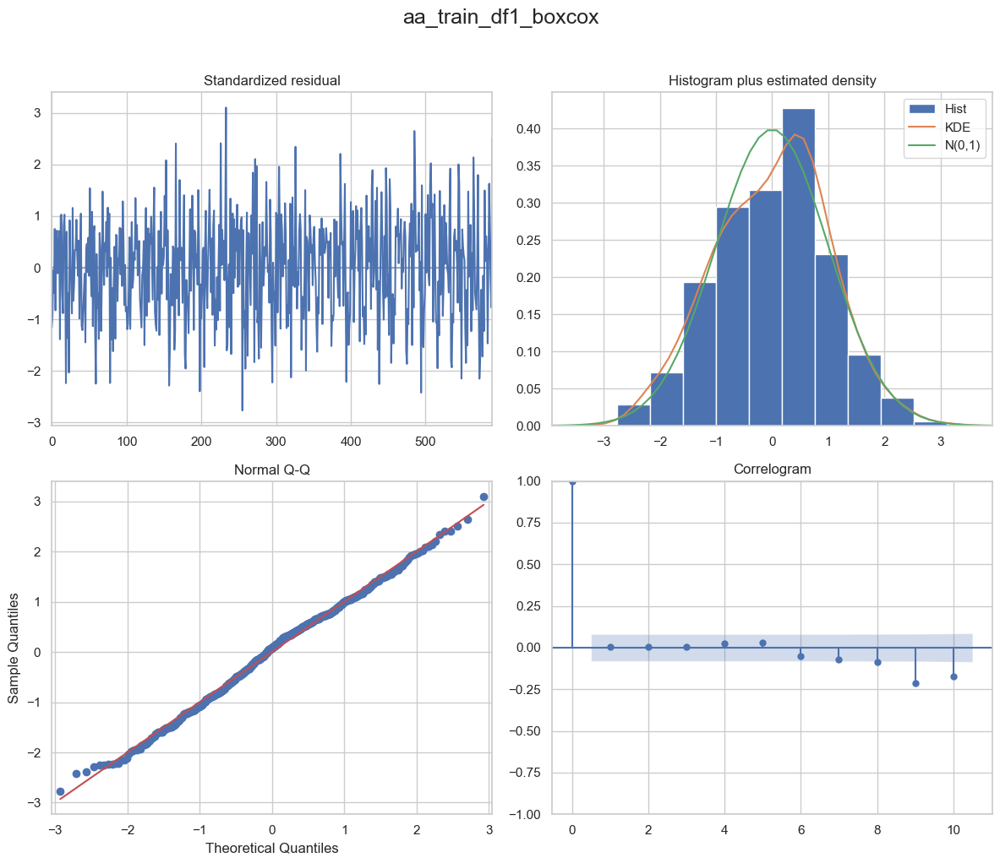

Error en expsmoth_train_df1_boxcox
Error en simpsmoth_train_df1_boxcox


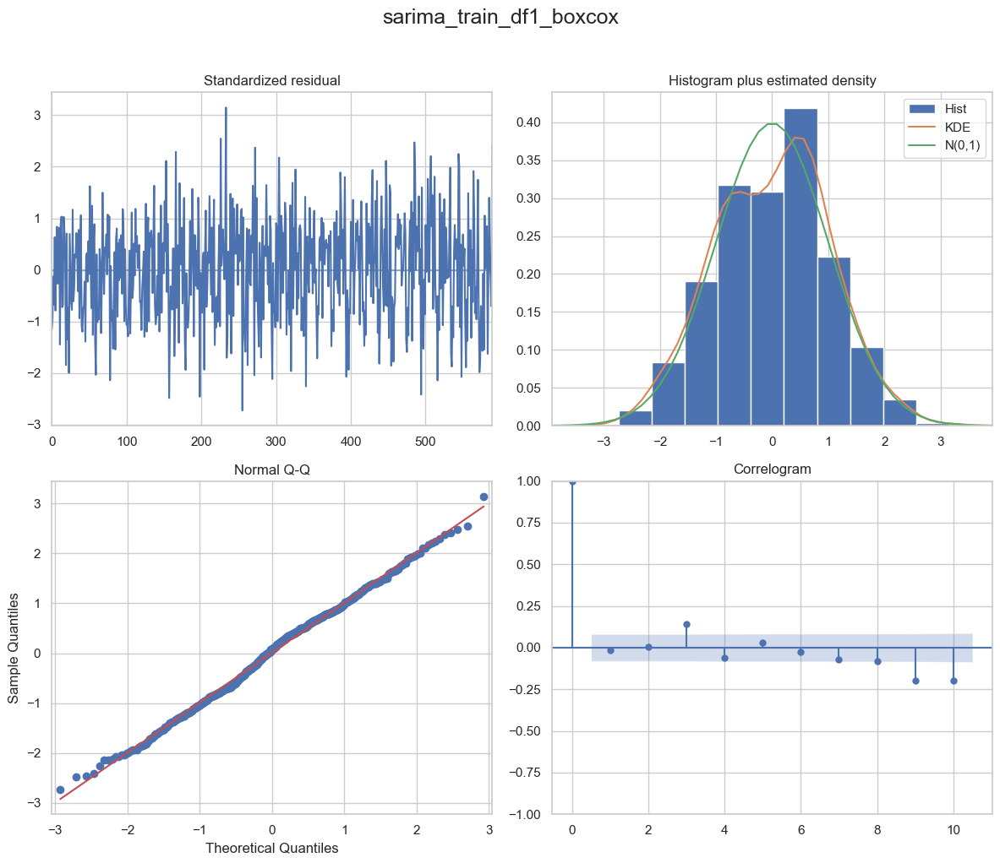

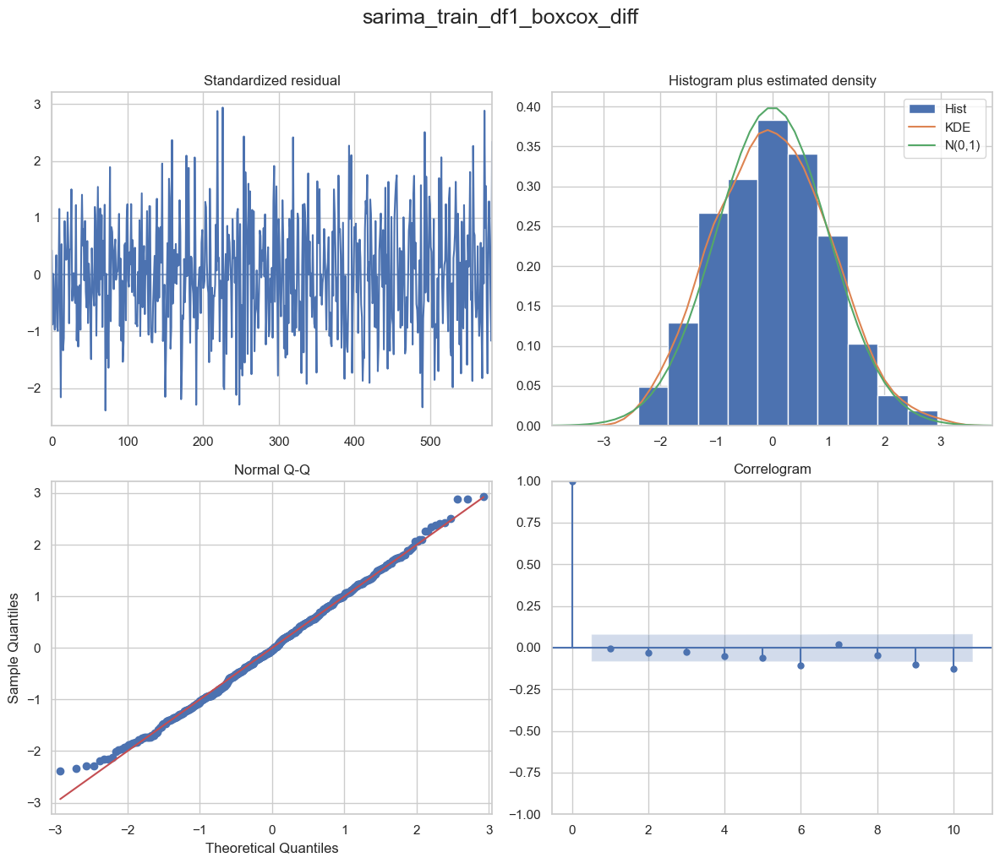

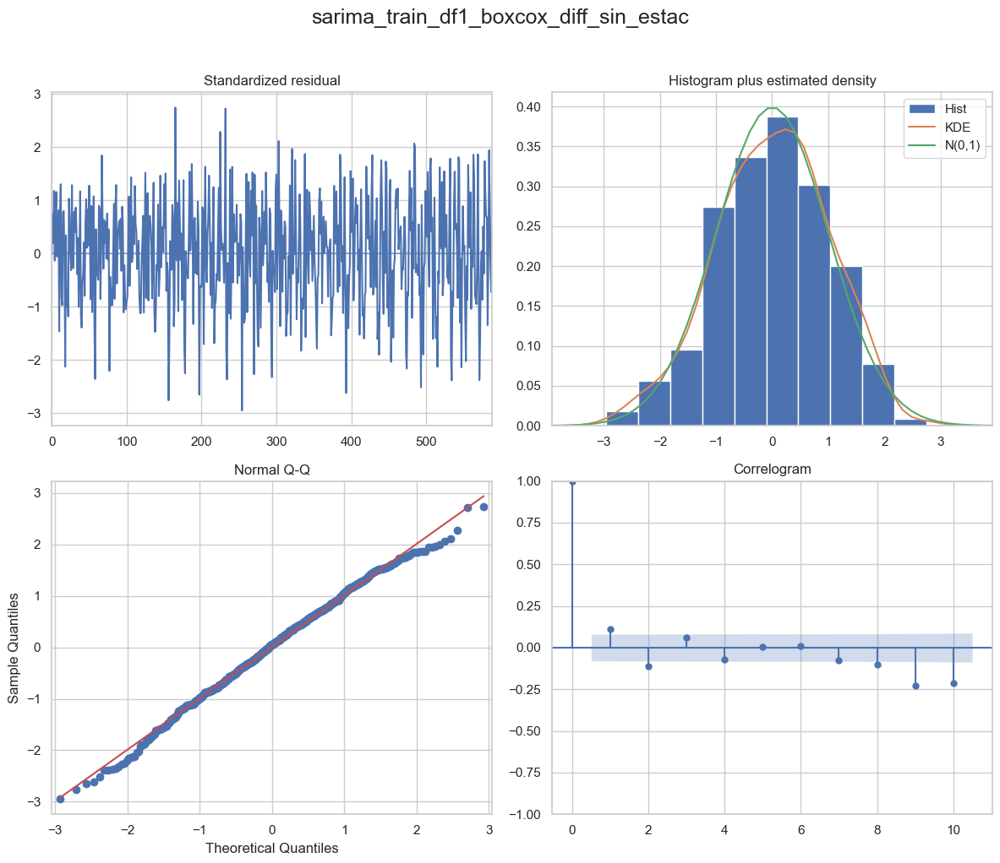

In [159]:
def plotear_analisis_diagnostico_residuos(modelo, titulo):
    fig = modelo.plot_diagnostics(figsize=(12, 10))
    
    # Agregar un título general a la figura
    fig.suptitle(titulo, size=18, y=1.02)  # y=1.02 ajusta la posición vertical del título
    
    plt.tight_layout()  # Asegura que los subgráficos no se solapen
    plt.show()

for modelo in models:
    try:
        plotear_analisis_diagnostico_residuos(modelo["modelo"],modelo["titulo"])
    except:
        print(f"Error en {modelo['titulo']}")

#### Incorrelación de los residuos

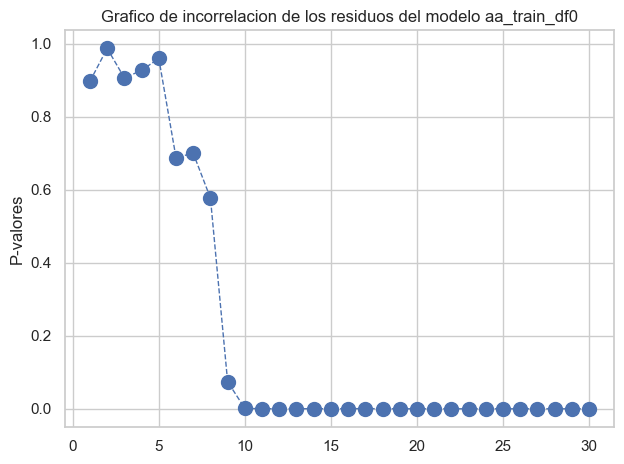

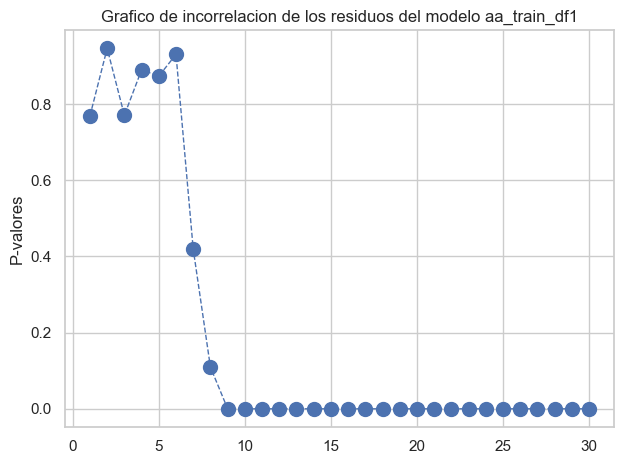

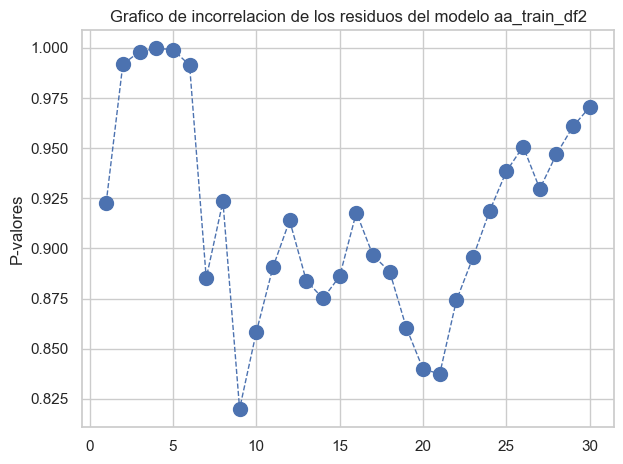

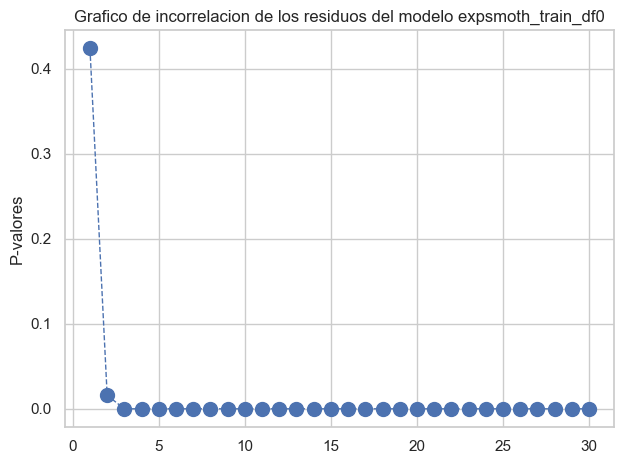

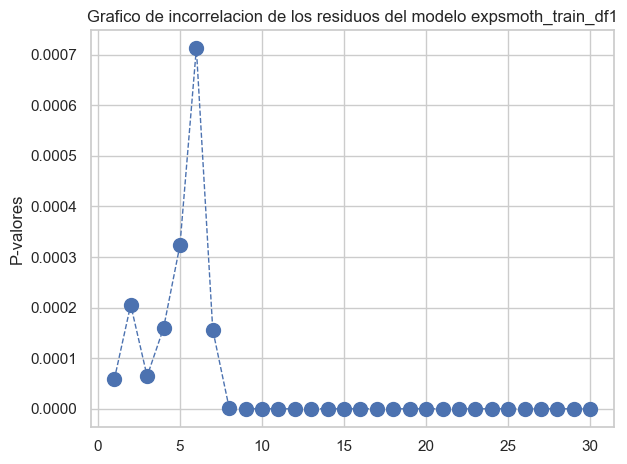

...

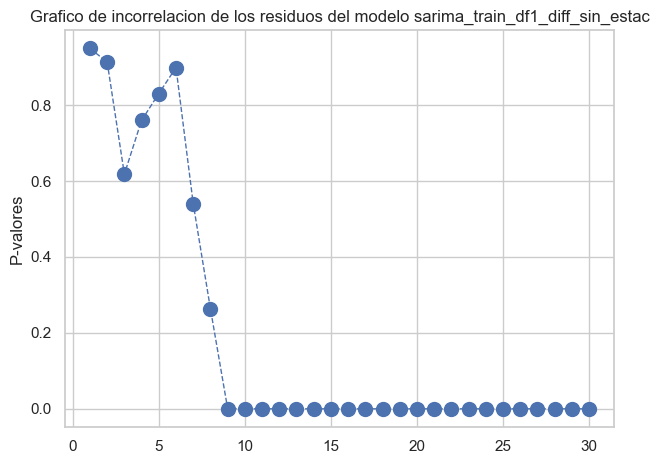

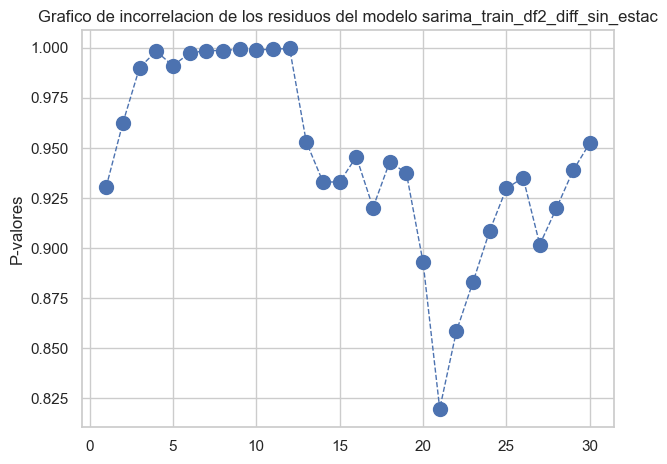

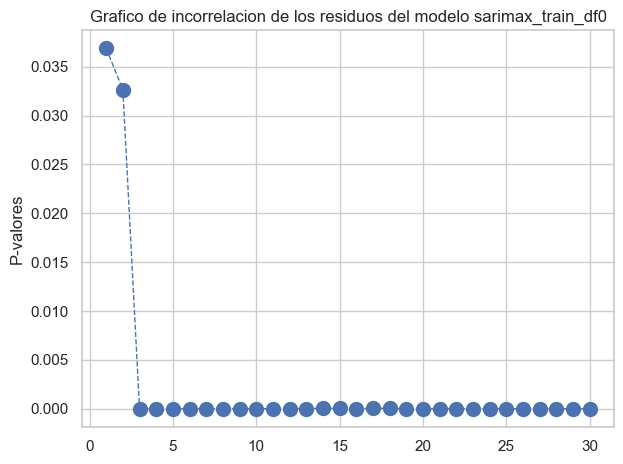

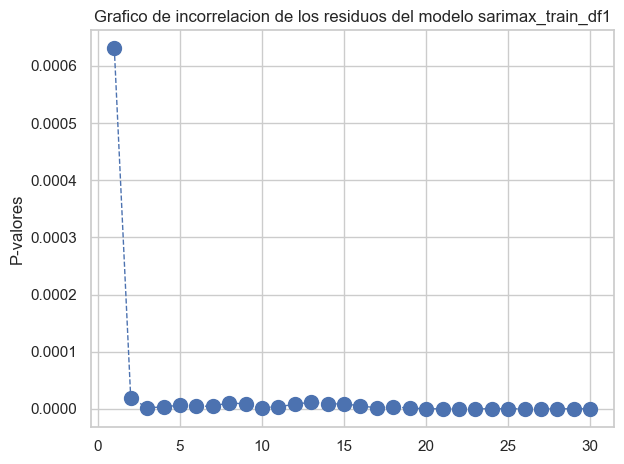

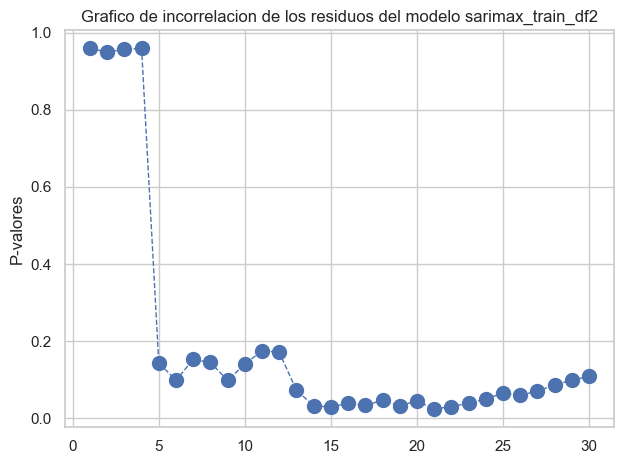

In [92]:
def plotear_incorrelacion(modelo, titulo):
    if titulo.startswith(("aa_","sarima_")):
        residuals = modelo.resid()
    else:
        residuals = modelo.resid
    Incorr_residuos_modelo=sm.stats.acorr_ljungbox(residuals, lags=30)

    
    plt.plot(Incorr_residuos_modelo.lb_pvalue, marker='o', markersize=10, linestyle='--', linewidth=1)
    plt.title(f"Grafico de incorrelacion de los residuos del modelo {titulo}")
    plt.ylabel("P-valores")
    # Mostrar el gráfico
    plt.tight_layout()
    plt.show()
    
for modelo in models:
    try:
        plotear_incorrelacion(modelo["modelo"],modelo["titulo"])
    except:
        print(f"Error en {modelo['titulo']}")

#### Test de Box-Pierce para analizar residuos

In [93]:
from statsmodels.tsa.stattools import acf
from scipy.stats import chi2
resultados_boxp = []
def test_de_box_pierce(modelo, titulo):
    if titulo.startswith(("aa_","sarima_")):
        residuals = modelo.resid()
    else:
        residuals = modelo.resid
    # Test Box-Pierce
    lags = 10

    acf_values = acf(residuals, nlags=lags, fft=False)
    
    # Calculamos el estadistico de prueba Q de Box-Pierce
    n = len(residuals)
    Q = n * np.sum(np.square(acf_values[1:lags+1]))
    p_value = 1 - chi2.cdf(Q, df=lags)
    
    alpha = 0.05
    resultados_boxp.append({
        "titulo": titulo,
        "Q": Q,
        "p_value": p_value,
        "autocorrelación":p_value < alpha
    })

for modelo in models:
    try:
        test_de_box_pierce(modelo["modelo"],modelo["titulo"])
    except:
        print(f"Error en {modelo['titulo']}")
resultados_boxp = pd.DataFrame(resultados_boxp)
display(HTML("<h2>Test de Box-Pierce</h2>"))
display(resultados_boxp)

,titulo,Q,p_value,autocorrelación
0,aa_train_df0,28.69,0.00,True
1,aa_train_df1,51.42,0.00,True
2,aa_train_df2,5.16,0.88,False
3,expsmoth_train_df0,55.51,0.00,True
4,expsmoth_train_df1,102.36,0.00,True
5,expsmoth_train_df2,22.88,0.01,True
6,simpsmoth_train_df0,61.61,0.00,True
7,simpsmoth_train_df1,156.33,0.00,True
8,simpsmoth_train_df2,20.56,0.02,True
9,sarima_train_df0,20.18,0.03,True


In [160]:
from statsmodels.tsa.stattools import acf
from scipy.stats import chi2
resultados_boxp = []
def test_de_box_pierce(modelo, titulo):
    if titulo.startswith(("aa_","sarima_")):
        residuals = modelo.resid()
    else:
        residuals = modelo.resid
    # Test Box-Pierce
    lags = 10

    acf_values = acf(residuals, nlags=lags, fft=False)
    
    # Calculamos el estadistico de prueba Q de Box-Pierce
    n = len(residuals)
    Q = n * np.sum(np.square(acf_values[1:lags+1]))
    p_value = 1 - chi2.cdf(Q, df=lags)
    
    alpha = 0.05
    resultados_boxp.append({
        "titulo": titulo,
        "Q": Q,
        "p_value": p_value,
        "autocorrelación":p_value < alpha
    })

for modelo in models:
    try:
        test_de_box_pierce(modelo["modelo"],modelo["titulo"])
    except:
        print(f"Error en {modelo['titulo']}")
resultados_boxp = pd.DataFrame(resultados_boxp)
display(HTML("<h2>Test de Box-Pierce</h2>"))
display(resultados_boxp)

,titulo,Q,p_value,autocorrelación
0,aa_train_df1_boxcox,55.24,0.00,True
1,expsmoth_train_df1_boxcox,106.39,0.00,True
2,simpsmoth_train_df1_boxcox,75.49,0.00,True
3,sarima_train_df1_boxcox,67.82,0.00,True
4,sarima_train_df1_boxcox_diff,28.51,0.00,True
5,sarima_train_df1_boxcox_diff_sin_estac,83.90,0.00,True


In [186]:
from statsmodels.tsa.stattools import acf
from scipy.stats import chi2
resultados_boxp = []
def test_de_box_pierce(modelo, titulo):
    if titulo.startswith(("aa_","sarima_")):
        residuals = modelo.resid()
    else:
        residuals = modelo.resid
    # Test Box-Pierce
    lags = 10

    acf_values = acf(residuals, nlags=lags, fft=False)
    
    # Calculamos el estadistico de prueba Q de Box-Pierce
    n = len(residuals)
    Q = n * np.sum(np.square(acf_values[1:lags+1]))
    p_value = 1 - chi2.cdf(Q, df=lags)
    
    alpha = 0.05
    resultados_boxp.append({
        "titulo": titulo,
        "Q": Q,
        "p_value": p_value,
        "autocorrelación":p_value < alpha
    })

for modelo in models:
    try:
        test_de_box_pierce(modelo["modelo"],modelo["titulo"])
    except:
        print(f"Error en {modelo['titulo']}")
resultados_boxp = pd.DataFrame(resultados_boxp)
display(HTML("<h2>Test de Box-Pierce</h2>"))
display(resultados_boxp)

,titulo,Q,p_value,autocorrelación
0,aa_train_df1_sinestac,47.90,0.00,True
1,simpsmoth_train_df1_boxcox,154.78,0.00,True
2,expsmoth_train_df1_sinestac,58.97,0.00,True
3,expsmoth_train_df1_sinestac,58.97,0.00,True
4,sarima_train_df1_sinestac,48.11,0.00,True
5,sarima_train_df1_sinestac_diff,28.14,0.00,True
6,sarima_train_df1_sinestac_diff_sinestac,49.46,0.00,True


In [94]:
resultados_boxp[resultados_boxp["autocorrelación"]==False]

,titulo,Q,p_value,autocorrelación
2,aa_train_df2,5.16,0.88,False
11,sarima_train_df2,7.72,0.66,False
14,sarima_train_df2_diff,2.93,0.98,False
15,sarima_train_df0_diff_sin_estac,16.42,0.09,False
17,sarima_train_df2_diff_sin_estac,1.40,1.00,False
20,sarimax_train_df2,14.09,0.17,False


## Ejercicio 9

Pronosticar con el modelo seleccionado para cada serie para una ventana temporal razonable, en función de la periodicidad y el comportamiento de las mismas.

*El único modelo cuyos residuos estan incorrelacionados es el ARIMA(7,6) con la serie diferenciada una vez. A continuación vemos la predicción.*

In [168]:
import matplotlib.pyplot as plt

def plot_forecast(model, title, steps):
  # Generar el forecast
  forecast = model.get_forecast(steps=steps)
  forecast_index = pd.date_range(start=model.data.endog.index[-1], periods=steps + 1, closed='right')
  forecast_mean = forecast.predicted_mean
  forecast_ci = forecast.conf_int()

  # Graficar los datos históricos
  plt.figure(figsize=(12, 6))
  plt.plot(model.data.endog, label='Historical Data')

  # Graficar el forecast
  plt.plot(forecast_index, forecast_mean, label='Forecast', color='red')
  plt.fill_between(forecast_index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink', alpha=0.3)

  # Configurar el gráfico
  plt.title(f'Forecast for {title}')
  plt.xlabel('Date')
  plt.ylabel('Value')
  plt.legend()
  plt.grid(True)
  plt.show()


plot_forecast(models[0]["modelo"], models[0]["titulo"], 30)

AttributeError: 'ARIMA' object has no attribute 'get_forecast'

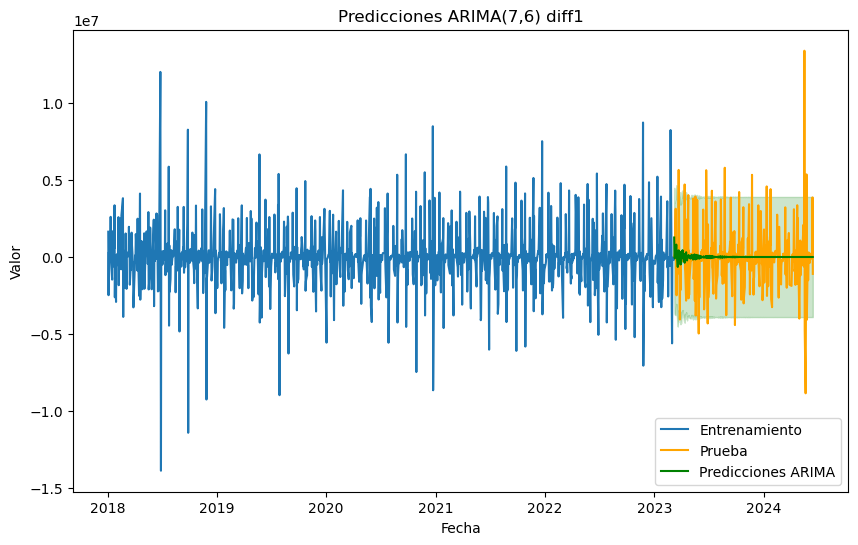

In [152]:
predicciones_arma = modelos_copa[1].get_forecast(steps=len(dataframes_test_diff1[0]))
pred_train3 = predicciones_arma.predicted_mean
conf_int = predicciones_arma.conf_int()

plt.figure(figsize=(10, 6))
plt.plot(dataframes_train_diff1[0].index, dataframes_train_diff1[0], label='Entrenamiento')
plt.plot(dataframes_test_diff1[0].index, dataframes_test_diff1[0], label='Prueba', color='orange')
plt.plot(dataframes_test_diff1[0].index, pred_train3, label='Predicciones ARIMA', color='green')
plt.fill_between(dataframes_test_diff1[0].index, conf_int.iloc[:, 0], conf_int.iloc[:, 1], color='green', alpha=0.2)
plt.title('Predicciones ARIMA(7,6) diff1')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.legend()
plt.show()

In [153]:
def evaluar_metricas(serie_test, serie_pred):
    print(f'MSE: {mean_squared_error(serie_test, serie_pred)}')
    print(f'MAE: {mean_absolute_error(serie_test, serie_pred)}')
    print(f'RMSE: {np.sqrt(mean_squared_error(serie_test, serie_pred))}')
    print(f'MAPE: {round(np.mean(abs((serie_test-serie_pred)/serie_test)),4)}')
    
evaluar_metricas(dataframes_test_diff1[0], predicciones_arma.predicted_mean)

MSE: 4212041046394.411
MAE: 1316508.935279116
RMSE: 2052325.7651733584
MAPE: nan


##  Ejercicio 10
Construir un modelo de Vectores Autorregresivos (VAR) con las series elegidas para realizar predicciones sobre cada una de ellas.


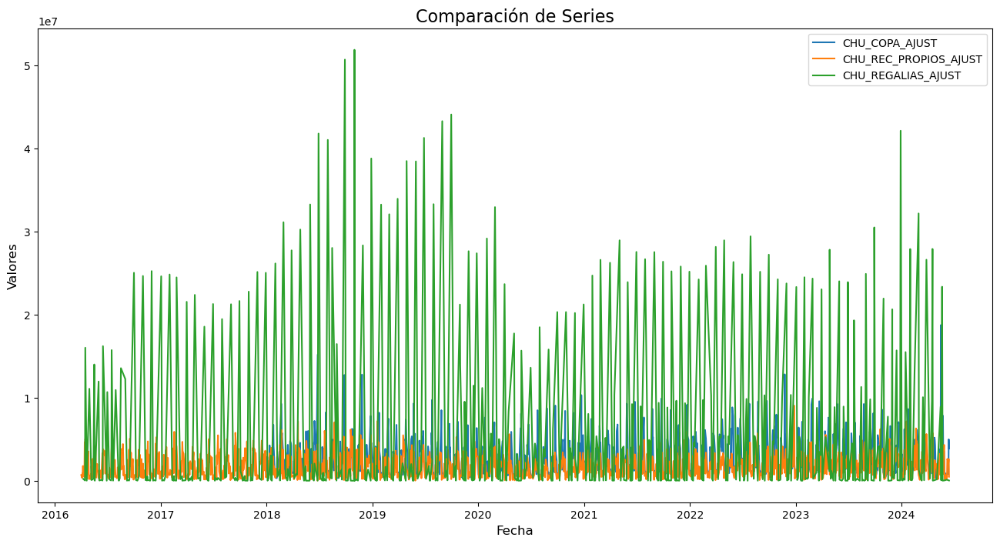

In [190]:
import matplotlib.pyplot as plt

# Crear una figura y ejes para los gráficos
fig, ax = plt.subplots(figsize=(16, 8))

# Graficar los tres dataframes con una paleta de colores personalizada
ax.plot(dataframes[0], label=dataframes[0].name, color='#1f77b4')  # Azul
ax.plot(dataframes[1], label=dataframes[1].name, color='#ff7f0e')  # Naranja
ax.plot(dataframes[2], label=dataframes[2].name, color='#2ca02c')  # Verde

# Añadir leyenda arriba a la derecha
ax.legend(loc='upper right')

# Añadir título y etiquetas de los ejes si es necesario
plt.title('Comparación de Series', fontsize=16)
plt.xlabel('Fecha', fontsize=12)
plt.ylabel('Valores', fontsize=12)

# Mostrar el gráfico
plt.show()


In [188]:
# Separacion Train/Test

# Variable que guarda el porcentaje de train
split = .9

# Seleccion de train
train_var = df_merged.iloc[:round(len(df_merged)*split)]

# Seleccionamos de test
test_var = df_merged.iloc[round(len(df_merged)*split):]

# Corroboramos que los limites se hayan establecido segun lo planificado
print(train_var.shape,"\n\n", test_var.shape)

(387, 3) 

 (43, 3)


##### Criterio de Granger
La hipótesis nula supone que el pasado de una variable no proporciona información adicional para predecir la otra variable más allá de lo que ya se puede predecir utilizando solo su propio pasado.
- H0: La serie temporal X no causa grangerianamente la serie temporal Y.  
- H1: La serie temporal X causa grangerianamente la serie temporal Y.  

In [191]:
from statsmodels.tsa.stattools import grangercausalitytests

In [192]:
# P-valores menores al nivel de significancia (0.05) implica que la hipotesis nula (X no causa Y) puede rechazarse.
# testgr: Es el tipo de prueba que se utilizará para evaluar la causalidad de Granger. Por defecto, se utiliza 'ssr_chi2test', que es una prueba basada en chi-cuadrado,

def grangers_causation_matrix(data, variables, maxlag, testgr='ssr_chi2test', verbose=False):


    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [(test_result[i+1][0][testgr][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

# se agrega '_x' al final de los nombres de las columnas para indicar que son las variables "causantes" y '_y' al final de los nombres de las filas para indicar que son las variables "afectadas".

In [193]:
testgr = 'ssr_chi2test'
grangers_causation_matrix(train_var, variables = train_var.columns, maxlag=20)

,CHU_COPA_AJUST_x,CHU_REC_PROPIOS_AJUST_x,CHU_REGALIAS_AJUST_x
CHU_COPA_AJUST_y,1.000000e+00,0.094448,1.015801e-12
CHU_REC_PROPIOS_AJUST_y,8.969867e-02,1.000000,4.160159e-06
CHU_REGALIAS_AJUST_y,3.320573e-11,0.004739,1.000000e+00


#### Resumen de causalidades significativas:
* CHU_COPA_AJUST_y aporta información a CHU_REGALIAS_AJUST_x.
* CHU_REC_PROPIOS_AJUST_y aporta información a CHU_REGALIAS_AJUST_x.
* CHU_REGALIAS_AJUST_y aporta información a CHU_COPA_AJUST_x y CHU_REC_PROPIOS_AJUST_x.

In [194]:
from statsmodels.tsa.api import VAR

model = VAR(train_var)

A continuación se utiliza el método select_order del modelo VAR (model) para seleccionar el orden adecuado del modelo VAR basado en criterios estadísticos. El parámetro maxlags se establece en 70, lo que significa que el código considerará modelos VAR con hasta 70 rezagos.
- AIC (Akaike Information Criterion)  
- BIC (Bayesian Information Criterion)  
- FPE (Final Prediction Error)  
- HQIC (Hannan-Quinn Information Criterion)  

In [195]:
x = model.select_order(maxlags=20)
x.summary()

,AIC,BIC,FPE,HQIC
0,89.02,89.05,4.561e+38,89.03
1,88.65,88.78*,3.177e+38,88.71
2,88.61,88.83,3.037e+38,88.70
3,88.57,88.88,2.907e+38,88.69*
4,88.55*,88.97,2.872e+38*,88.72
5,88.58,89.09,2.954e+38,88.78
6,88.60,89.21,3.010e+38,88.84
7,88.63,89.33,3.094e+38,88.91
8,88.64,89.44,3.146e+38,88.96
9,88.68,89.57,3.248e+38,89.03


In [196]:
model_fitted = model.fit(4)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 20, Oct, 2024
Time:                     11:32:03
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                    88.9547
Nobs:                     383.000    HQIC:                   88.7122
Log likelihood:          -18549.2    FPE:                2.87061e+38
AIC:                      88.5527    Det(Omega_mle):     2.59708e+38
--------------------------------------------------------------------
Results for equation CHU_COPA_AJUST
                              coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------------
const                      2941751.908567    457276.810809            6.433           0.000
L1.CHU_COPA_AJUST                0.042821         0.057279            0.748           0.455
L1.CHU_

Predicción

In [197]:
# Funcion que recibe listas con las predicciones e intervalos de confianza de las 3 series y devuelve un
# dataframe para la serie indicada por la variable indice
def serializar(predicciones_, test_, indice, futuro_, intervalos=True):

    serie = {
        "FECHA": test_.index[:futuro_],
        "serie"+str(indice): predicciones_[0][:,indice-1].tolist(),
        "serie"+str(indice)+"_inf": predicciones_[1][:,indice-1].tolist(),
        "serie"+str(indice)+"_sup": predicciones_[2][:,indice-1].tolist()}
    serie = pd.DataFrame(serie, columns=["FECHA", "serie"+str(indice),
                                         "serie"+str(indice)+"_inf", "serie"+str(indice)+"_sup"])
    serie.set_index("FECHA", inplace=True)
    if (intervalos==False):
        serie.loc[serie["serie"+str(indice)+"_inf"] < 0, "serie"+str(indice)+"_inf"] = 0
        serie.loc[serie["serie"+str(indice)+"_sup"] < 0, "serie"+str(indice)+"_sup"] = 0
    return serie

In [217]:
import pandas as pd

def serializar(predicciones_, test_, indice, futuro_, intervalos=True):
    # Verificar si predicciones_ tiene la longitud esperada
    predicciones = predicciones_[0]  # Predicciones
    inf_intervalo = predicciones_[1]  # Intervalos inferiores
    sup_intervalo = predicciones_[2]  # Intervalos superiores

    # Asegúrate de que los arrays tienen la longitud correcta
    print("Longitud de predicciones:", predicciones.shape[0])
    print("Longitud de inf_intervalo:", inf_intervalo.shape[0])
    print("Longitud de sup_intervalo:", sup_intervalo.shape[0])
    
    # Asegúrate de que las longitudes coincidan con el número de pasos de predicción
    if len(test_.index[:futuro_]) != predicciones.shape[0]:
        raise ValueError("La longitud de las predicciones no coincide con el número de pasos a predecir.")

    # Crear un diccionario para la nueva serie
    serie = {
        "FECHA": test_.index[:futuro_],  # Asegúrate de que esto coincida con el tamaño de predicciones
        "serie" + str(indice): predicciones[:, indice - 1].tolist(),
        "serie" + str(indice) + "_inf": inf_intervalo[:, indice - 1].tolist(),
        "serie" + str(indice) + "_sup": sup_intervalo[:, indice - 1].tolist()
    }

    # Convertir el diccionario en un DataFrame
    serie = pd.DataFrame(serie, columns=["FECHA", "serie" + str(indice),
                                         "serie" + str(indice) + "_inf", "serie" + str(indice) + "_sup"])
    
    # Establecer FECHA como índice
    serie.set_index("FECHA", inplace=True)
    
    # Ajustar valores de intervalos a 0 si son negativos, si es necesario
    if not intervalos:
        serie.loc[serie["serie" + str(indice) + "_inf"] < 0, "serie" + str(indice) + "_inf"] = 0
        serie.loc[serie["serie" + str(indice) + "_sup"] < 0, "serie" + str(indice) + "_sup"] = 0
        
    return serie


In [198]:
def graficar_pred(serie_test, serie_pred, titulo="Valores Originales vs Predicciones",
                  xlabel="Fecha", ylabel="Valor", intervalos=True):
    # serie_test:
    # serie_pred:

    fig_x = plt.figure(figsize=(12,3), dpi=100)
    axes_x = fig_x.add_axes([0.0, 0.0, 1, 1])

    # Graficamos los datos tests y las predicciones
    serie_test.plot(label="Serie Original de Test")
    serie_pred.iloc[:,0].plot(label="Predicciones")
    if (intervalos==True):
        serie_pred.iloc[:,2].plot(label="Intervalo de Confianza Superior")
        serie_pred.iloc[:,1].plot(label="Intervalo de Confianza Inferior")

    axes_x.set_xlabel(xlabel)
    axes_x.set_ylabel(ylabel)
    axes_x.set_title(titulo)
    axes_x.legend(loc=0)
    axes_x.grid(True, color='0.5', dashes=(5,2,1,2))

Longitud de predicciones: 15
Longitud de inf_intervalo: 15
Longitud de sup_intervalo: 15
Longitud de predicciones: 15
Longitud de inf_intervalo: 15
Longitud de sup_intervalo: 15
Longitud de predicciones: 15
Longitud de inf_intervalo: 15
Longitud de sup_intervalo: 15


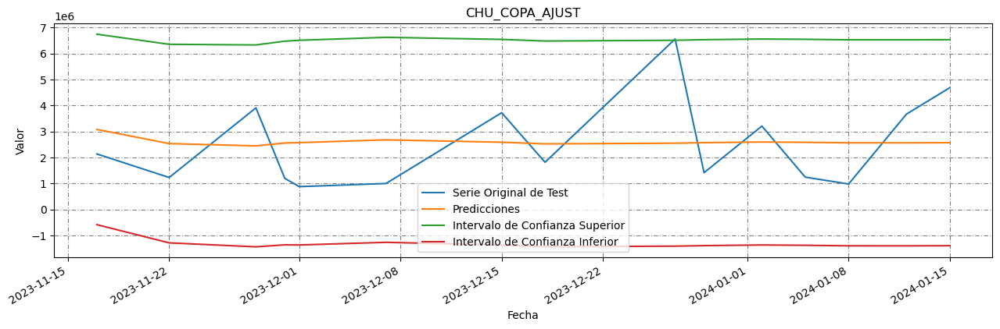

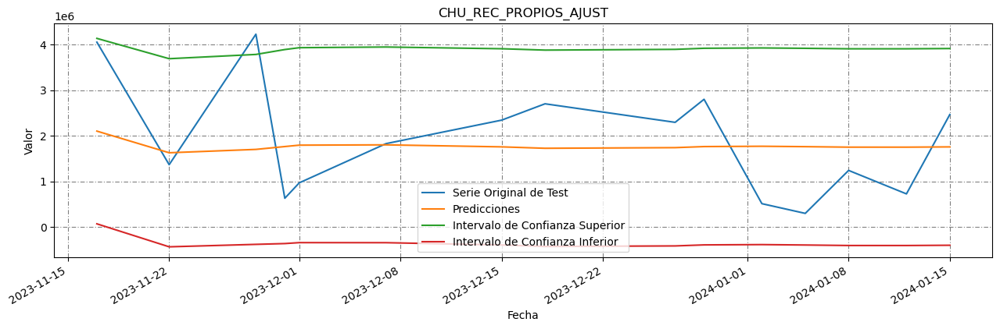

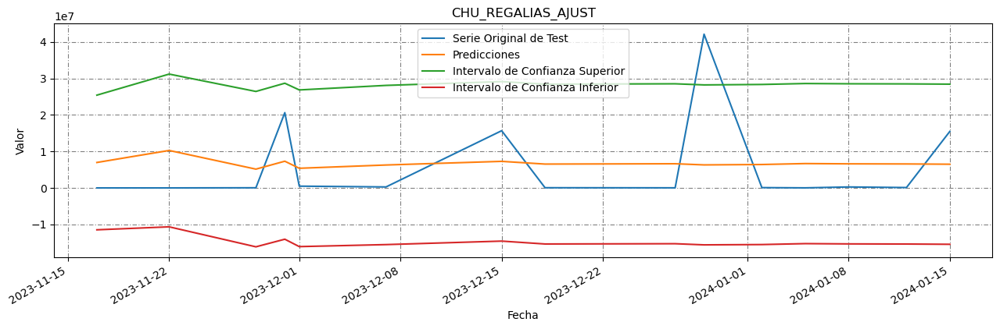

In [221]:
# Con la variable futuro se indican cuantas unidades en tiempo
# hacia adelante se quieren predecir
futuro = 15
lag_orden = 18

predicciones = model_fitted.forecast_interval(train_var.values[-lag_orden:], steps=futuro)

df = list()
for i in range(1, 4):  # Cambié de [1, 2, 3] a range(1, 4) para mayor claridad
    df.append(serializar(predicciones, test_var, i, futuro))

serieVAR = ['CHU_COPA_AJUST', 'CHU_REC_PROPIOS_AJUST', 'CHU_REGALIAS_AJUST']

for i, serie in enumerate(serieVAR):
    graficar_pred(test_var[serie][:futuro], df[i], titulo=serie)


In [222]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import jarque_bera, shapiro, boxcox, probplot
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
from statsmodels.stats.diagnostic import acorr_ljungbox, acorr_breusch_godfrey

In [223]:
def test_residuos(residuos):


    # Test de Jarque Bera
    # H0: los datos estan distribuidos normalmente
    # Ha: los datos no estan distribuidos normalmente
    # Si p < 0.05 se rechaza la hipotesis nula
    jarquebera = jarque_bera(residuos)
    print('Jarque-Bera')
    print(f'p-valor: {jarquebera[1]}\n')

    # Test de Shapiro Wilks
    # H0: los datos estan distribuidos normalmente
    # Ha: los datos no estan distribuidos normalmente
    # Si p < 0.05 se rechaza la hipotesis nula
    shapir = shapiro(residuos)
    print('Shapiro')
    print(f'p-valor: {shapir[1]}\n')

In [224]:
def evaluar_residuos(residuos):
    residuos.plot(title='Residuos', figsize=(12, 3))
    plt.axhline(0, linestyle='--', color='k')
    plt.show()
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 3))
    ax[0].set_title('Residuos KDE')
    ax[1].set_title('Q-Q Plot')
    residuos.plot(kind='kde', ax=ax[0])
    probplot(residuos, dist='norm', plot=ax[1])
    plt.show()
    acf = plot_acf(residuos)
    acf.set_size_inches(12,3)
    plt.show()
    print('Descriptivo Residuos\n')
    print(f'{residuos.describe()}\n\n')
    print('Test sobre los Residuos\n')
    test_residuos(residuos)

CHU_COPA_AJUST
-----------------------------
MSE: 2787791487896.3013
MAE: 1479987.748623582
RMSE: 1669668.077162734
MAPE: 0.8224
Evaluacion de residuos de Serie 


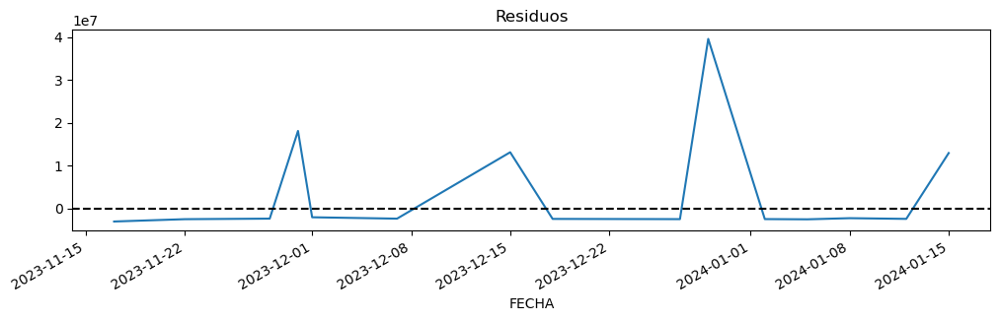

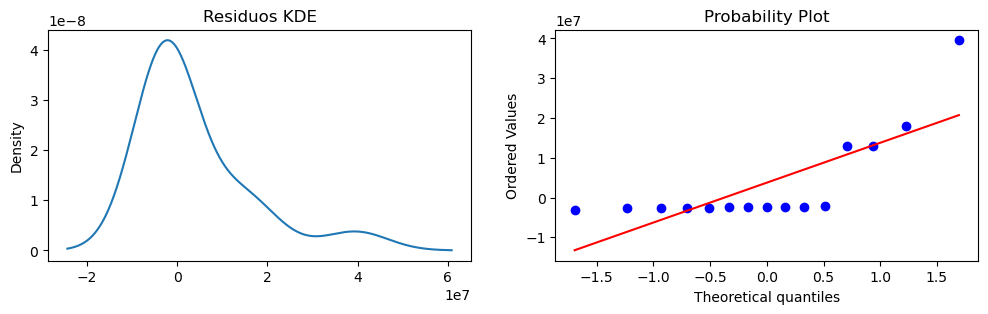

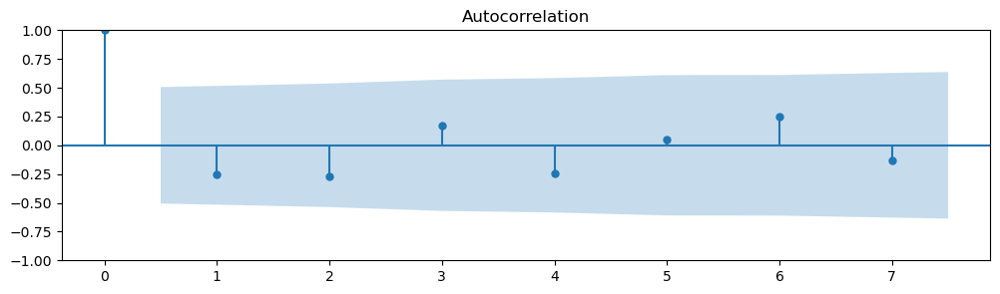

Descriptivo Residuos

count    1.500000e+01
mean     3.749568e+06
std      1.220583e+07
min     -3.076666e+06
25%     -2.518576e+06
50%     -2.411832e+06
75%      5.408812e+06
max      3.954531e+07
dtype: float64


Test sobre los Residuos

Jarque-Bera
p-valor: 0.0006388435039525697

Shapiro
p-valor: 3.081531744487833e-05



In [225]:
print("CHU_COPA_AJUST")
print("-----------------------------")
evaluar_metricas(test_var.CHU_COPA_AJUST[:futuro], df[0].iloc[:,0])
print(f"Evaluacion de residuos de Serie ")
evaluar_residuos(test_var[serie][:futuro]-df[0].iloc[:,0])

In [ ]:
print("CHU_REC_PROPIOS_AJUST")
print("-----------------------------")
evaluar_metricas(test_var.CHU_REC_PROPIOS_AJUST[:futuro], df[0].iloc[:,0])
print(f"Evaluacion de residuos de Serie ")
evaluar_residuos(test_var[serie][:futuro]-df[0].iloc[:,0])

In [ ]:
print("CHU_REGALIAS_AJUST")
print("-----------------------------")
evaluar_metricas(test_var.CHU_REGALIAS_AJUST[:futuro], df[0].iloc[:,0])
print(f"Evaluacion de residuos de Serie ")
evaluar_residuos(test_var[serie][:futuro]-df[0].iloc[:,0])

## Ejercicio 11
Analizar la función impulso respuesta y realizar distintas pruebas para analizar la causalidad.

Justificar la elección del modelo con todo lo visto en clase. Es posible complementar con otros análisis

*Debemos ver cómo las variables en el modelo responden a un shock o perturbación en una de las variables.*

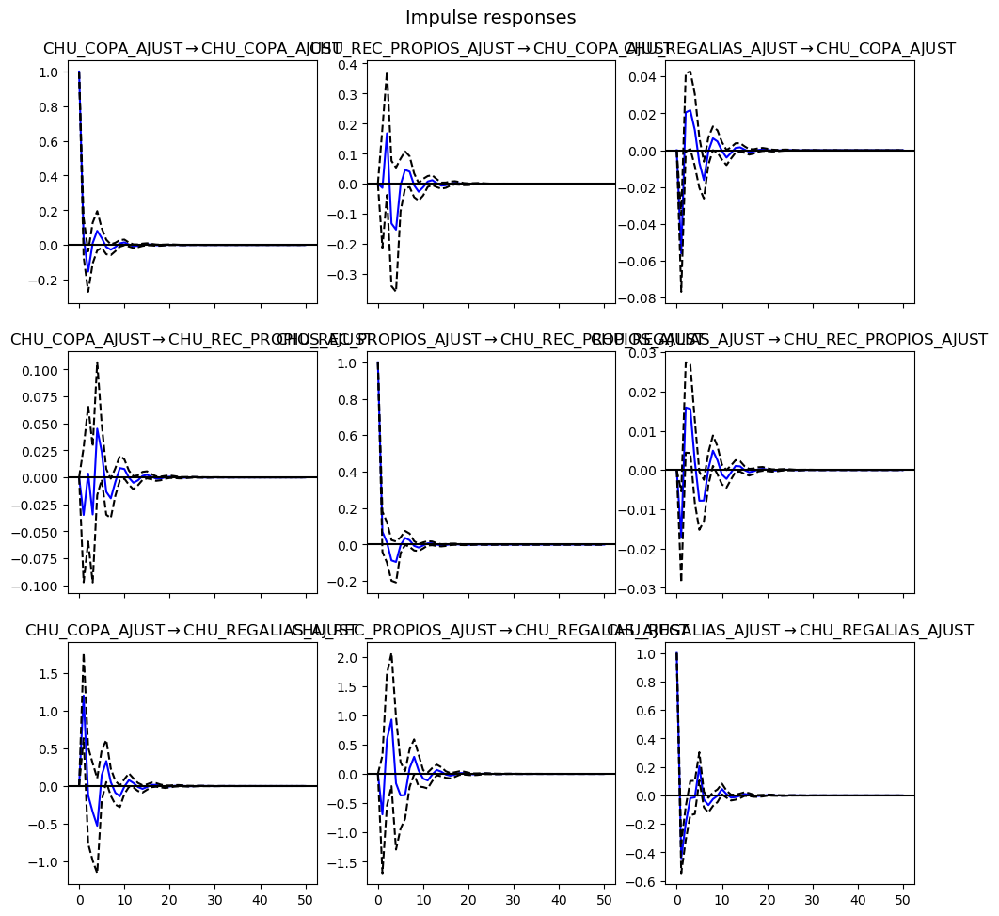

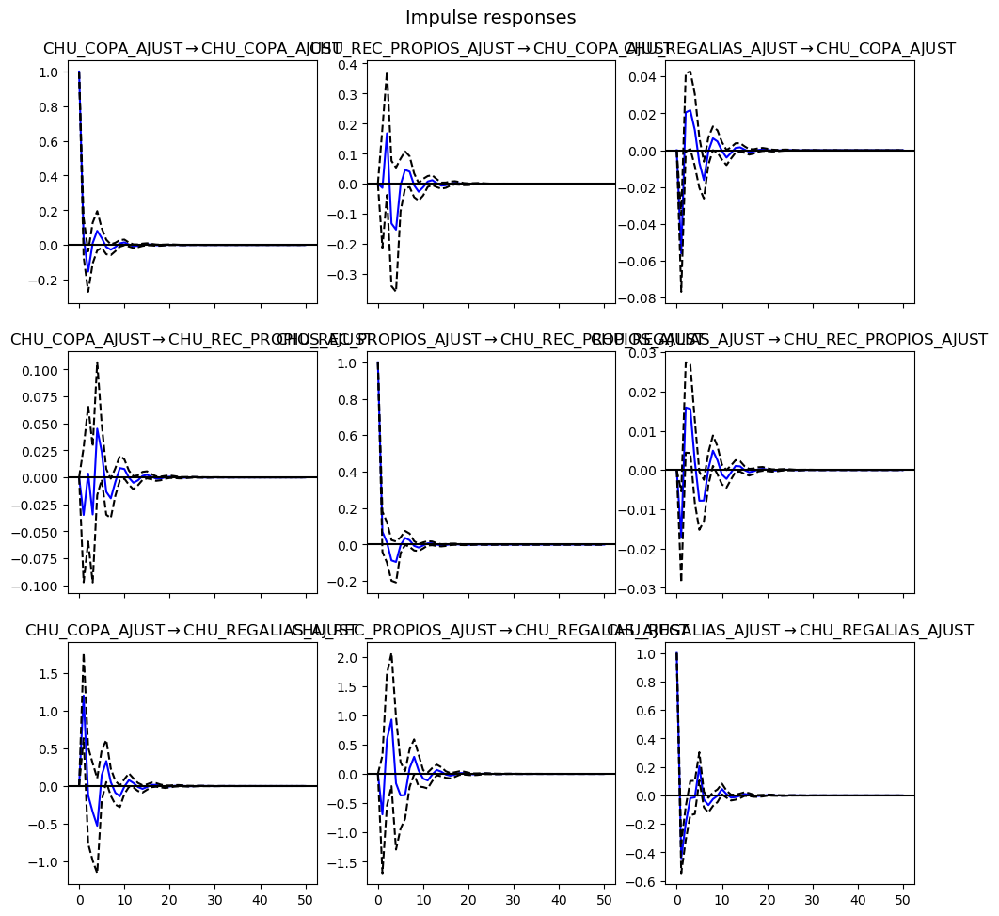

In [227]:
model_fitted.irf(50).plot()

## Ejercicio 12

En caso de presentar estacionalidad alguna de las series elegidas, se solicita determinar la representación más adecuada mediante algún modelo SARIMA y comparar los resultados con los modelos determinados en el trabajo anterior.

(Opcional) Realizar la prueba de hipótesis de HEGY para testear la conjetura de raíz unitaria sobre las series elegidas.


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=9292b23b-d668-48da-87b9-72d6854ea93f' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>